In [359]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.impute import KNNImputer
import scipy.stats as sc 
from sklearn.manifold import TSNE

import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier
from IPython.display import clear_output
from sklearn.preprocessing import MinMaxScaler

from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth, Birch, OPTICS
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
import itertools
from sklearn.metrics import silhouette_score , calinski_harabasz_score, davies_bouldin_score
from scipy.cluster.hierarchy import dendrogram
from tqdm import tqdm
import umap

### Basic EDA

In [360]:
df = pd.read_csv("XYZ_sports_dataset.csv", sep=";")
df.head()

,ID,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
0,10000,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,...,0.0,9.0,7,NaN,6.28,2,0,0.0,0,0
1,10001,29,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,...,0.0,23.0,1,2.0,17.42,1,2,0.0,0,1
2,10002,23,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,...,0.0,6.0,0,7.0,30.03,6,0,0.0,0,1
3,10003,9,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,...,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1
4,10004,35,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,...,NaN,41.0,0,7.0,60.97,0,3,0.0,0,1


In [361]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14942 entries, 0 to 14941
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          14942 non-null  int64  
 1   Age                         14942 non-null  int64  
 2   Gender                      14942 non-null  object 
 3   Income                      14447 non-null  float64
 4   EnrollmentStart             14942 non-null  object 
 5   EnrollmentFinish            14942 non-null  object 
 6   LastPeriodStart             14942 non-null  object 
 7   LastPeriodFinish            14942 non-null  object 
 8   DateLastVisit               14942 non-null  object 
 9   DaysWithoutFrequency        14942 non-null  int64  
 10  LifetimeValue               14942 non-null  float64
 11  UseByTime                   14942 non-null  int64  
 12  AthleticsActivities         14906 non-null  float64
 13  WaterActivities             149

In [362]:
df.describe()

,ID,Age,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,DanceActivities,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
count,14942.000000,14942.000000,14447.000000,14942.000000,14942.000000,14942.000000,14906.00000,14905.000000,14907.000000,14906.0,...,14907.000000,14916.000000,14942.000000,14407.000000,14942.000000,14942.000000,14942.000000,14930.000000,14942.000000,14942.000000
mean,17470.500000,26.015794,2230.816086,81.224936,302.561871,0.047116,0.00738,0.296209,0.576038,0.0,...,0.001878,40.120542,10.152456,5.759561,41.636299,5.320707,1.205260,0.019893,0.022286,0.800964
std,4313.528196,14.156582,1566.527734,144.199576,364.319566,0.211893,0.08559,0.456600,0.494201,0.0,...,0.043300,65.466459,29.154202,2.118867,21.066166,6.332958,1.381305,0.139637,0.166777,0.399289
min,10000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,...,0.000000,1.000000,0.000000,1.000000,0.560000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,13735.250000,19.000000,1470.000000,13.000000,83.600000,0.000000,0.00000,0.000000,0.000000,0.0,...,0.000000,7.000000,0.000000,4.000000,25.720000,1.000000,0.000000,0.000000,0.000000,1.000000
50%,17470.500000,23.000000,1990.000000,41.000000,166.200000,0.000000,0.00000,0.000000,1.000000,0.0,...,0.000000,18.000000,0.000000,7.000000,38.990000,4.000000,1.000000,0.000000,0.000000,1.000000
75%,21205.750000,31.000000,2790.000000,83.750000,355.075000,0.000000,0.00000,1.000000,1.000000,0.0,...,0.000000,45.000000,3.000000,7.000000,60.970000,7.000000,2.000000,0.000000,0.000000,1.000000
max,24941.000000,87.000000,10890.000000,1745.000000,6727.800000,1.000000,1.00000,1.000000,1.000000,0.0,...,1.000000,1031.000000,581.000000,7.000000,240.030000,84.000000,6.000000,1.000000,3.000000,1.000000


In [363]:
df.nunique()

ID                            14942
Age                              88
Gender                            2
Income                          737
EnrollmentStart                1490
EnrollmentFinish               1300
LastPeriodStart                  12
LastPeriodFinish                 11
DateLastVisit                  1384
DaysWithoutFrequency            660
LifetimeValue                  5668
UseByTime                         2
AthleticsActivities               2
WaterActivities                   2
FitnessActivities                 2
DanceActivities                   1
TeamActivities                    2
RacketActivities                  2
CombatActivities                  2
NatureActivities                  1
SpecialActivities                 2
OtherActivities                   2
NumberOfFrequencies             415
AttendedClasses                 230
AllowedWeeklyVisitsBySLA          7
AllowedNumberOfVisitsBySLA      270
RealNumberOfVisits               60
NumberOfRenewals            

In [364]:
# remove since only one value, useless columns
df.drop(columns = ['DanceActivities', 'NatureActivities'], inplace = True)

In [365]:
# keep all binary columns separately
binary_columns = ['Gender', 'UseByTime',
       'AthleticsActivities', 'WaterActivities', 'FitnessActivities','TeamActivities', 'RacketActivities',
       'CombatActivities', 'SpecialActivities', 'OtherActivities', 'HasReferences']



### Preprocessing

#### Activities columns

In [366]:
activities = ['AthleticsActivities', 'WaterActivities','FitnessActivities', 'TeamActivities','RacketActivities', 'CombatActivities', 'SpecialActivities', 'OtherActivities']
df['NumberActivities'] = df[activities].sum(axis=1)


#### Timestamp columns

We can process date columns to create important features that will reflect loyalty of customers and their behaviour patterns

In [367]:
df.columns

Index(['ID', 'Age', 'Gender', 'Income', 'EnrollmentStart', 'EnrollmentFinish',
       'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit',
       'DaysWithoutFrequency', 'LifetimeValue', 'UseByTime',
       'AthleticsActivities', 'WaterActivities', 'FitnessActivities',
       'TeamActivities', 'RacketActivities', 'CombatActivities',
       'SpecialActivities', 'OtherActivities', 'NumberOfFrequencies',
       'AttendedClasses', 'AllowedWeeklyVisitsBySLA',
       'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals',
       'HasReferences', 'NumberOfReferences', 'Dropout', 'NumberActivities'],
      dtype='object')

In [368]:
df['EnrollmentStart'] = pd.to_datetime(df['EnrollmentStart'])
df['EnrollmentFinish'] = pd.to_datetime(df['EnrollmentFinish'])
df['LastPeriodStart'] = pd.to_datetime(df['LastPeriodStart'])
df['LastPeriodFinish'] = pd.to_datetime(df['LastPeriodFinish'])
df['DateLastVisit'] = pd.to_datetime(df['DateLastVisit'])

In [369]:
df['EnrollmentStartYear'] = df['EnrollmentStart'].dt.year

In [370]:
df['EnrollmentDuration'] = (df['EnrollmentFinish'] - df['EnrollmentStart']).dt.days
df['LastPeriodDuration'] = (df['LastPeriodFinish'] - df['LastPeriodStart']).dt.days

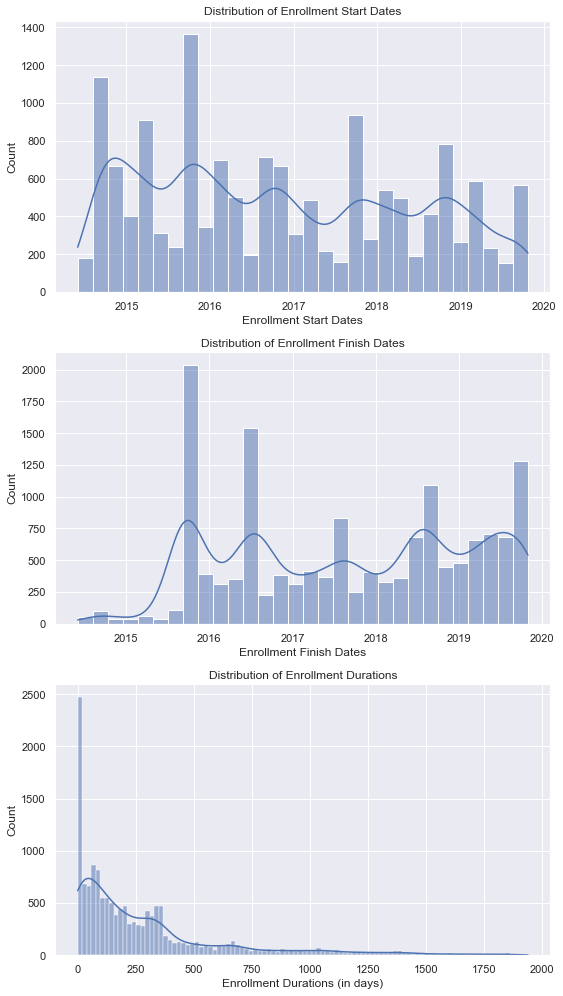

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msyhl.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=290, stretch='normal', size='scalable')) = 10.1545
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\STENCIL.TTF', name='Stencil', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\trebuc.ttf', name='Trebuchet MS', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguili.ttf', name='Segoe UI', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\COLONNA.TTF', name='Colonna MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisym.ttf', name='Segoe UI Symbol', style='normal', variant='n

findfont: score(FontEntry(fname='C:\\Users\\dggua\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\dggua\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizOneSymBol.ttf', name='STIXSizeOneSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Users\\dggua\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Users\\dggua\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Oblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
fi

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\NIAGENG.TTF', name='Niagara Engraved', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SCRIPTBL.TTF', name='Script MT Bold', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbelb.ttf', name='Corbel', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILLUBCD.TTF', name='Gill Sans Ultra Bold Condensed', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Candarali.ttf', name='Candara', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIGI.TTF', name='Gigi', style='norm

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LBRITED.TTF', name='Lucida Bright', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguibl.ttf', name='Segoe UI', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\seguisli.ttf', name='Segoe UI', style='italic', variant='normal', weight=350, stretch='normal', size='scalable')) = 11.0975
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgunsl.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=300, stretch='normal', size='scalable')) = 10.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SNAP____.TTF', name='Snap ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERBI___.TTF', name='Perpetua', style='italic', variant='nor

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msyh.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\msyhbd.ttc', name='Microsoft YaHei', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTI.TTF', name='Calisto MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ANTQUABI.TTF', name='Book Antiqua', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOTHICB.TTF', name='Century Gothic', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GLSNECB.TTF', name='Gill Sans MT Ext Condensed Bold

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\PERTIBD.TTF', name='Perpetua Titling MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRABKIT.TTF', name='Franklin Gothic Book', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LFAX.TTF', name='Lucida Fax', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\VINERITC.TTF', name='Viner Hand ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LFAXI.TTF', name='Lucida Fax', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\YuGothB.ttc', name='Yu Gothic', style='normal',

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibrili.ttf', name='Calibri', style='italic', variant='normal', weight=300, stretch='normal', size='scalable')) = 11.145
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\malgun.ttf', name='Malgun Gothic', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GARA.TTF', name='Garamond', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\AGENCYR.TTF', name='Agency FB', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\lucon.ttf', name='Lucida Console', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\segoepr.ttf', name='Segoe Print', style='normal', variant='normal', w

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LeelaUIb.ttf', name='Leelawadee UI', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\SansSerifCollection.ttf', name='Sans Serif Collection', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ERASDEMI.TTF', name='Eras Demi ITC', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILC____.TTF', name='Gill Sans MT Condensed', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\JOKERMAN.TTF', name='Jokerman', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\LTYPE.TTF', name='Lu

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILBI___.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOUDYSTO.TTF', name='Goudy Stout', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\ariblk.ttf', name='Arial', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 6.888636363636364
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\corbeli.ttf', name='Corbel', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MAIAN.TTF', name='Maiandra GD', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\CALISTBI.TTF', name='Calisto MT', style='italic', variant='n

findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRADMCN.TTF', name='Franklin Gothic Demi Cond', style='normal', variant='normal', weight=400, stretch='condensed', size='scalable')) = 10.25
findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GILI____.TTF', name='Gill Sans MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0 to DejaVu Sans ('C:\\Users\\dggua\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf') with score of 0.050000.


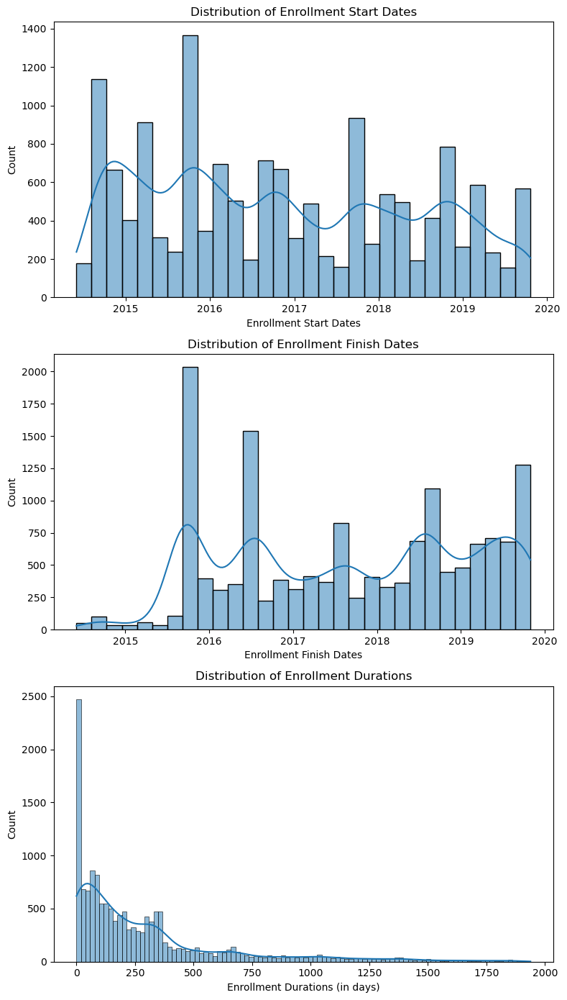

In [371]:
# Create subplots
fig, axes = plt.subplots(3, 1, figsize=(8, 14))

# Plot the distribution of 'EnrollmentStart' dates
sns.histplot(df['EnrollmentStart'], bins=30, kde=True, label='Enrollment Start', ax=axes[0])
axes[0].set_title('Distribution of Enrollment Start Dates')
axes[0].set_xlabel('Enrollment Start Dates')
axes[0].set_ylabel('Count')

# Plot the distribution of 'EnrollmentFinish' dates
sns.histplot(df['EnrollmentFinish'], bins=30, kde=True, label='Enrollment Finish', ax=axes[1])
axes[1].set_title('Distribution of Enrollment Finish Dates')
axes[1].set_xlabel('Enrollment Finish Dates')
axes[1].set_ylabel('Count')


sns.histplot(df['EnrollmentDuration'], bins=100, kde=True, ax=axes[2])
axes[2].set_title('Distribution of Enrollment Durations')
axes[2].set_xlabel('Enrollment Durations (in days)')
axes[2].set_ylabel('Count')
plt.tight_layout()
plt.show()

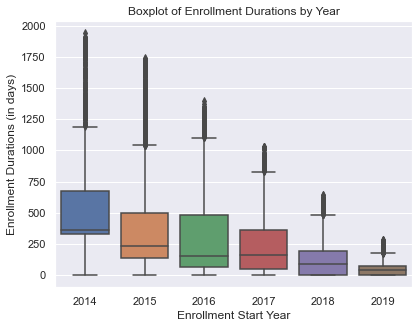

In [372]:
# Boxplot with KDE
sns.boxplot(data=df, x='EnrollmentStartYear', y='EnrollmentDuration', showfliers=True)  # Set showfliers=False to exclude outliers
# sns.stripplot(data=df, x='EnrollmentStartYear', y='EnrollmentDuration', color='black', alpha=0.5, jitter=0.2)  # Add strip plot for individual data points
plt.title('Boxplot of Enrollment Durations by Year')
plt.xlabel('Enrollment Start Year')
plt.ylabel('Enrollment Durations (in days)')
plt.show()

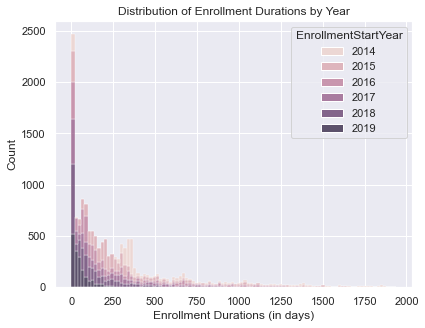

In [373]:
sns.histplot(data=df, x='EnrollmentDuration', bins=100,  hue='EnrollmentStartYear', multiple='stack')
plt.title('Distribution of Enrollment Durations by Year')
plt.xlabel('Enrollment Durations (in days)')
plt.ylabel('Count')
plt.show()

In [374]:
df[df['EnrollmentDuration'] == 0]

,ID,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,...,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,NumberActivities,EnrollmentStartYear,EnrollmentDuration,LastPeriodDuration
25,10025,13,Female,0.0,2015-09-09,2015-09-09,2019-07-01,2019-12-31,2019-10-26,5,...,6.28,3,4,0.0,0,0,1.0,2015,0,183
36,10036,13,Female,0.0,2014-10-02,2014-10-02,2019-07-01,2019-12-31,2019-10-22,9,...,17.14,5,5,1.0,1,0,3.0,2014,0,183
38,10038,38,Female,1910.0,2018-09-29,2018-09-29,2019-07-01,2019-12-31,2019-10-30,1,...,26.13,25,1,0.0,0,0,1.0,2018,0,183
49,10049,56,Male,6540.0,2018-09-03,2018-09-03,2019-07-01,2019-12-31,2019-10-29,2,...,60.97,32,1,0.0,0,0,1.0,2018,0,183
51,10051,12,Female,0.0,2018-08-17,2018-08-17,2019-07-01,2019-12-31,2019-10-28,3,...,34.84,4,2,0.0,0,0,2.0,2018,0,183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14918,24918,73,Male,3870.0,2014-12-10,2014-12-10,2019-07-01,2019-12-31,2019-10-31,0,...,60.97,45,5,0.0,0,0,2.0,2014,0,183
14919,24919,1,Female,0.0,2019-07-18,2019-07-18,2019-07-01,2019-12-31,2019-10-31,0,...,17.14,7,1,0.0,0,0,1.0,2019,0,183
14926,24926,24,Female,3290.0,2018-10-08,2018-10-08,2019-01-01,2019-12-31,2019-10-29,2,...,17.42,7,1,0.0,0,0,1.0,2018,0,364
14937,24937,14,Male,0.0,2016-09-08,2016-09-08,2019-07-01,2019-12-31,2019-10-29,2,...,34.84,8,3,0.0,0,0,1.0,2016,0,183


We can see that there are a lot of customers having enrollment start and finish as a same date, but their last visit is bigger date, so we can use this date is better approximation of the end of enrollment since we dobt have better data

In [375]:
df.loc[df['EnrollmentDuration'] == 0, 'EnrollmentFinish'] = df.loc[df['EnrollmentDuration'] == 0, 'DateLastVisit']
# recalculate enrollemnt duration 
df['EnrollmentDuration'] = (df['EnrollmentFinish'] - df['EnrollmentStart']).dt.days

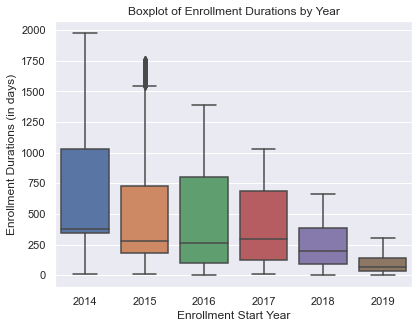

In [376]:
# Boxplot with KDE
sns.boxplot(data=df, x='EnrollmentStartYear', y='EnrollmentDuration', showfliers=True)  # Set showfliers=False to exclude outliers
# sns.stripplot(data=df, x='EnrollmentStartYear', y='EnrollmentDuration', color='black', alpha=0.5, jitter=0.2)  # Add strip plot for individual data points
plt.title('Boxplot of Enrollment Durations by Year')
plt.xlabel('Enrollment Start Year')
plt.ylabel('Enrollment Durations (in days)')
plt.show()

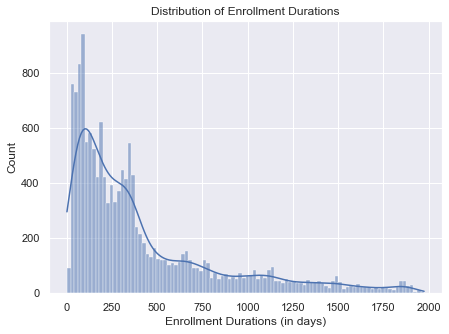

In [377]:
sns.histplot(df['EnrollmentDuration'], bins=100, kde=True)
plt.title('Distribution of Enrollment Durations')
plt.xlabel('Enrollment Durations (in days)')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

What we see from this beautiful distributions is that boxes with bigger year has distributions closer to 0 - that makes sense because elder clients had higher chance of staying for a long time and newer clients have just enrolled. However, we still have potential to attract some of these people back if they stop visiting our club. 

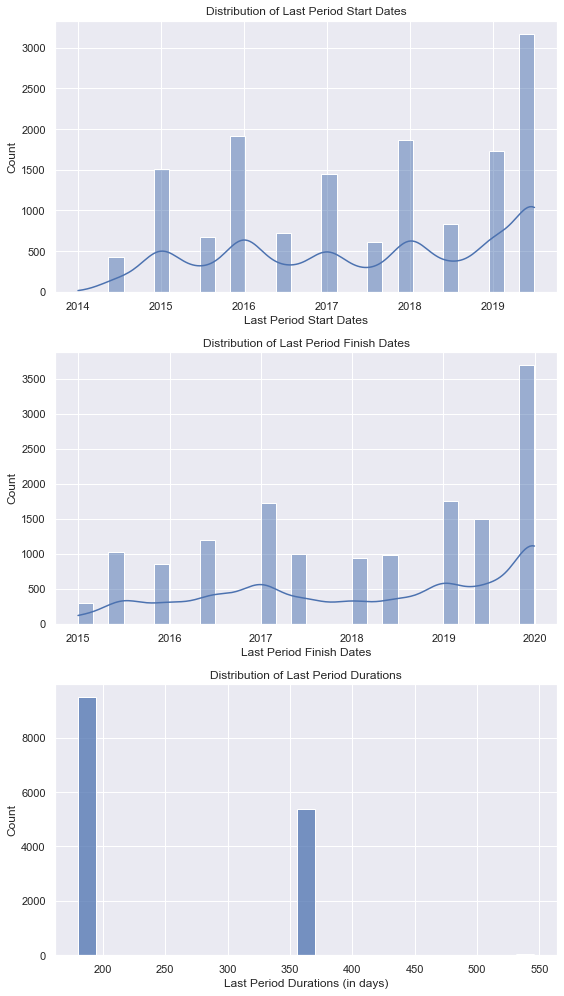

In [378]:
# Create subplots
fig, axes = plt.subplots(3, 1, figsize=(8, 14))

# Plot the distribution of 'EnrollmentStart' dates
sns.histplot(df['LastPeriodStart'], bins=30, kde=True, label='Last Period Start', ax=axes[0])
axes[0].set_title('Distribution of Last Period Start Dates')
axes[0].set_xlabel('Last Period Start Dates')
axes[0].set_ylabel('Count')

# Plot the distribution of 'EnrollmentFinish' dates
sns.histplot(df['LastPeriodFinish'], bins=30, kde=True, label='Last Period Finish', ax=axes[1])
axes[1].set_title('Distribution of Last Period Finish Dates')
axes[1].set_xlabel('Last Period Finish Dates')
axes[1].set_ylabel('Count')


sns.histplot(df['LastPeriodDuration'],   ax=axes[2])
axes[2].set_title('Distribution of Last Period Durations')
axes[2].set_xlabel('Last Period Durations (in days)')
axes[2].set_ylabel('Count')
plt.tight_layout()
plt.show()

In [379]:
df[df['DateLastVisit'] > df['LastPeriodFinish']]

,ID,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,...,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,NumberActivities,EnrollmentStartYear,EnrollmentDuration,LastPeriodDuration
23,10023,24,Male,1710.0,2016-10-13,2019-10-31,2018-01-01,2018-12-31,2019-10-25,6,...,26.13,11,3,0.0,0,1,1.0,2016,1113,364
98,10098,35,Male,6490.0,2015-09-14,2016-07-08,2016-01-01,2016-06-30,2016-07-08,0,...,59.99,4,0,0.0,0,1,1.0,2015,298,181
223,10223,51,Male,5640.0,2014-09-10,2019-09-20,2017-01-01,2017-12-31,2019-09-20,41,...,17.42,3,5,0.0,0,0,1.0,2014,1836,364
236,10236,19,Female,1190.0,2019-02-28,2019-10-30,2019-01-01,2019-06-30,2019-10-30,1,...,60.97,12,1,0.0,0,0,1.0,2019,244,180
279,10279,3,Female,0.0,2018-01-15,2019-10-23,2018-01-01,2018-12-31,2019-10-23,8,...,17.42,1,2,0.0,0,0,1.0,2018,646,364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14404,24404,8,Female,0.0,2018-09-22,2019-10-19,2019-01-01,2019-06-30,2019-10-19,12,...,17.42,6,1,0.0,0,0,1.0,2018,392,180
14437,24437,21,Male,2210.0,2019-02-13,2019-10-30,2019-01-01,2019-06-30,2019-10-30,1,...,60.97,12,1,0.0,0,0,1.0,2019,259,180
14576,24576,22,Female,1950.0,2016-09-20,2019-10-30,2019-01-01,2019-06-30,2019-10-30,1,...,60.97,18,3,0.0,0,0,1.0,2016,1135,180
14613,24613,23,Female,1520.0,2016-09-14,2019-10-30,2019-01-01,2019-06-30,2019-10-30,1,...,60.97,6,3,0.0,0,0,1.0,2016,1141,180


it seems like this variable is not useful since it only represents 0.5, 1 or 1,5 years and most of people are in two first groups

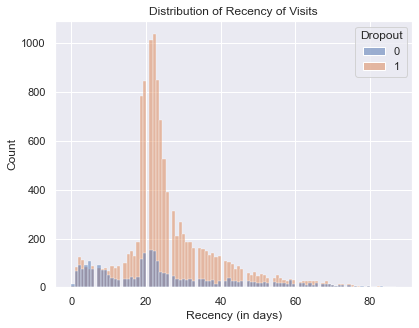

In [380]:
#creating recency variable that represents difference between last visit and biggest date of last visit in dataset

df['Recency'] = (df['DateLastVisit'].max() - df['DateLastVisit']).dt.days

sns.histplot(data=df, x='Age', bins=100, hue = 'Dropout')
plt.title('Distribution of Recency of Visits')
plt.xlabel('Recency (in days)')
plt.ylabel('Count')
plt.show()

A lot of people in data have recent visits, which means that are still active customers and probably we will spend less money on promotions for them

#### Other metric columns

In [381]:
df.drop(columns = binary_columns ).nunique()

ID                            14942
Age                              88
Income                          737
EnrollmentStart                1490
EnrollmentFinish                874
LastPeriodStart                  12
LastPeriodFinish                 11
DateLastVisit                  1384
DaysWithoutFrequency            660
LifetimeValue                  5668
NumberOfFrequencies             415
AttendedClasses                 230
AllowedWeeklyVisitsBySLA          7
AllowedNumberOfVisitsBySLA      270
RealNumberOfVisits               60
NumberOfRenewals                  7
NumberOfReferences                4
Dropout                           2
NumberActivities                  6
EnrollmentStartYear               6
EnrollmentDuration             1717
LastPeriodDuration                6
Recency                        1384
dtype: int64

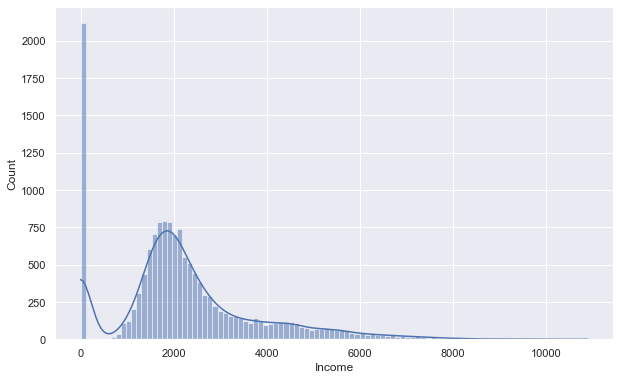

In [382]:
i = 'Income'
plt.figure(figsize=(10, 6))
sns.histplot(df[i], bins=100, kde=True)
plt.show()

seems like a lot of people has 0 income that might mean that these people dont work - tey are teen agers or students

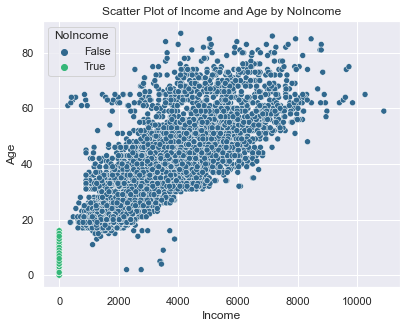

In [383]:
df['NoIncome'] = df['Income'] == 0
sns.scatterplot(data=df, x='Income', y='Age', hue='NoIncome', palette='viridis')
plt.title('Scatter Plot of Income and Age by NoIncome')
plt.show()

In [384]:
i = 'NumberOfReferences'
df[i].value_counts()

0    14646
1      267
2       21
3        8
Name: NumberOfReferences, dtype: int64

Almost all people did 0 or 1 reference, so this column doesnt seem important and will not help with clustering

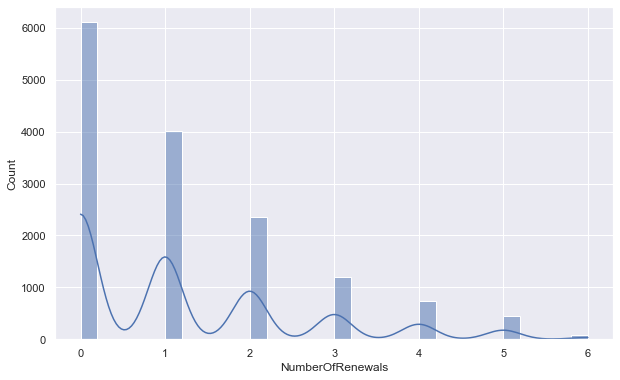

In [385]:
i = 'NumberOfRenewals'
plt.figure(figsize=(10, 6))
sns.histplot(df[i], bins=30, kde=True)
plt.show()

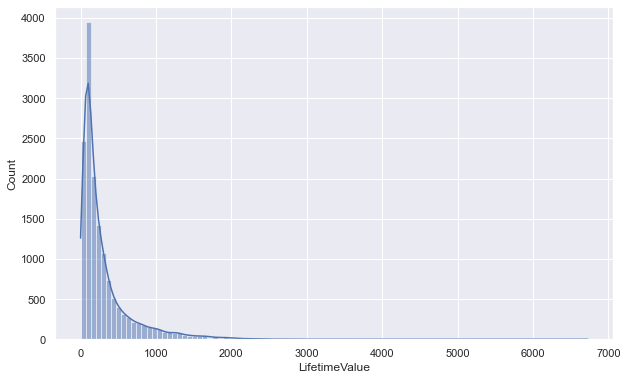

In [386]:
i = 'LifetimeValue'
plt.figure(figsize=(10, 6))
sns.histplot(df[i], bins=100, kde=True)
plt.show()

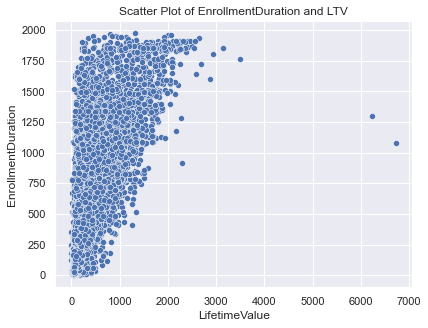

In [387]:
sns.scatterplot(data=df, x='LifetimeValue', y='EnrollmentDuration')
plt.title('Scatter Plot of EnrollmentDuration and LTV')
plt.show()

We see that there is correllation - the longer the person is client, the more money he spent. It makes sense. But for us it might be useful to see if there are people who spend more money not only in total but by unit of time.

#### Cost of the day

In [388]:
# we need to fill missing values in AllowedWeeklyVisitsBySLA since this column is better representation of allowed 
# number of visits than AllowedNumberOfVisitsBySLA which is very noisy - however ше can help fill missing values in weekly sla
X = df[['AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA']]
imputer = KNNImputer(n_neighbors=100) 
X_imputed = imputer.fit_transform(X)
df['AllowedWeeklyVisitsBySLA'] = np.round(X_imputed[:, 0])

In [389]:
# We know enrollement duration and LTV of customer, so we can approximate his Cost of the day as
# LTV/EnrollmentDuration
# Also we can multiple this number by sla converted to the part of period allowed to visit 
# To make it efficient cost of the day - since 7day and 2 day tarrifs definetely cost different money
df['AllowedWeeklyVisitsBySLA'].value_counts()

7.0    10830
2.0     2378
4.0      769
1.0      554
3.0      248
6.0      133
5.0       30
Name: AllowedWeeklyVisitsBySLA, dtype: int64

In [390]:
sla_part_period = df['AllowedWeeklyVisitsBySLA']/7

df['CostOfDay'] = df['LifetimeValue']/(df['EnrollmentDuration'] * sla_part_period)

Median: [0.9174354895722869]
Q1: [0.5582291585388962]
Q3: [1.803030303030303]
Whisker Low: [0.5582291585388962]
Whisker High: [3.669883040935673]


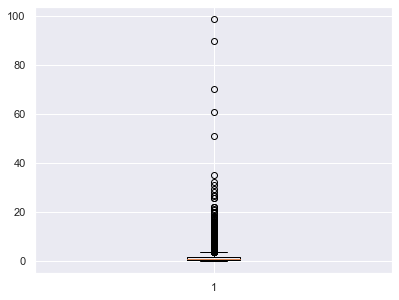

In [391]:
i = 'CostOfDay'
boxplot_dict = plt.boxplot(df[i])

medians = [median.get_ydata()[0] for median in boxplot_dict['medians']]
q1s = [q1.get_ydata()[0] for q1 in boxplot_dict['boxes']]
q3s = [q3.get_ydata()[2] for q3 in boxplot_dict['boxes']]
whisker_low = [whiskers.get_ydata()[0] for whiskers in boxplot_dict['whiskers'][::2]]
whisker_high = [whiskers.get_ydata()[1] for whiskers in boxplot_dict['whiskers'][1::2]]
print("Median:", medians)
print("Q1:", q1s)
print("Q3:", q3s)
print("Whisker Low:", whisker_low)
print("Whisker High:", whisker_high)

plt.show()

In [392]:
print('Percentage of data inside whiskers:', np.round(len(df[(df[i] > whisker_low[0]) & (df[i] < whisker_high[0])])/len(df),3))

Percentage of data inside whiskers: 0.634



We see that there are a lot of outliers inside this variable, 
but most spendings are distributed around 0-2, so our distribitution has very heavy tail. If distribution of variable is normal more than 99% of it is lies inside whiskers, but here we have 63%. That means that there are more than 40% of people who spend extremely a lot per unit of time compared to others. Let's explore who are they

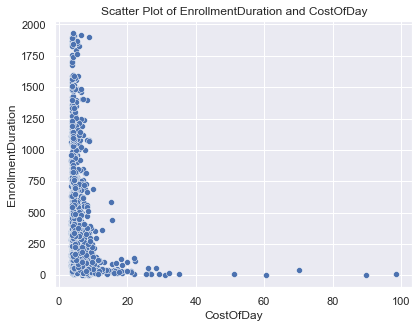

In [393]:
sns.scatterplot(data=df[df['CostOfDay'] > whisker_high[0]], 
                x='CostOfDay', 
                y='EnrollmentDuration')
plt.title('Scatter Plot of EnrollmentDuration and CostOfDay')
plt.show()

In [394]:
df[df['CostOfDay'] > 10][['AllowedWeeklyVisitsBySLA','NumberOfFrequencies', 'CostOfDay', 'EnrollmentDuration', 'LifetimeValue']].describe()

,AllowedWeeklyVisitsBySLA,NumberOfFrequencies,CostOfDay,EnrollmentDuration,LifetimeValue
count,96.000000,96.000000,96.000000,96.000000,96.000000
mean,2.250000,5.750000,18.317591,64.666667,214.863750
std,1.753193,8.746729,14.816198,92.547077,214.230832
min,1.000000,1.000000,10.030682,1.000000,38.600000
25%,1.000000,2.000000,11.125463,21.750000,71.700000
50%,2.000000,3.000000,13.287660,36.000000,103.475000
75%,3.000000,6.000000,18.417747,61.000000,304.800000
max,7.000000,71.000000,98.525000,581.000000,1261.600000


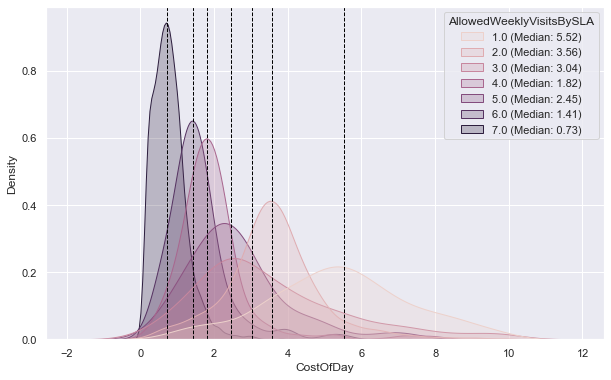

In [395]:
plt.figure(figsize=(10, 6))

sns.kdeplot(data=df[df['CostOfDay'] < 10], x='CostOfDay', hue='AllowedWeeklyVisitsBySLA', fill=True, common_norm=False)


medians = df.groupby('AllowedWeeklyVisitsBySLA')['CostOfDay'].median()
for category, median_value in medians.items():
    plt.axvline(median_value, color='black', linestyle='dashed', linewidth=1, label=f'Median {category}')
handles, labels = plt.gca().get_legend().legend_handles, medians.index

legend_labels = [f'{label} (Median: {medians[label]:.2f})' for label in labels]
plt.legend(handles=handles, labels=legend_labels, title='AllowedWeeklyVisitsBySLA')

plt.show()

The lower amount of visits per week the higher the cost of the day - seems true, since tariffs are normally done this way

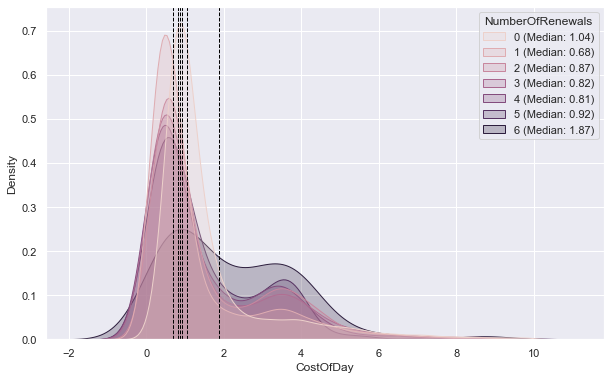

In [396]:
plt.figure(figsize=(10, 6))

sns.kdeplot(data=df[df['CostOfDay'] < 10], x='CostOfDay', hue='NumberOfRenewals', fill=True, common_norm=False)


medians = df.groupby('NumberOfRenewals')['CostOfDay'].median()
for category, median_value in medians.items():
    plt.axvline(median_value, color='black', linestyle='dashed', linewidth=1, label=f'Median {category}')
handles, labels = plt.gca().get_legend().legend_handles, medians.index

legend_labels = [f'{label} (Median: {medians[label]:.2f})' for label in labels]
plt.legend(handles=handles, labels=legend_labels, title='NumberOfRenewals')

plt.show()

We see that these people with extremely high spendings per day are not staying for a long time normally (< 1 year). And those extreme outliers (>10 ) are the ones who stayed just for a few days and come very few times. This is definitely not the target audience

However, some people may stay not the whole period of enrollment but have two or more separate enrollments inside with different lengths and pauses, but we dont have access to this info, so we this is the best approximation we can have (however from the plot above we don't see radical differences in plot shapes and medians of the cost by amount of renewals - meaning that approximation we use is quite good)

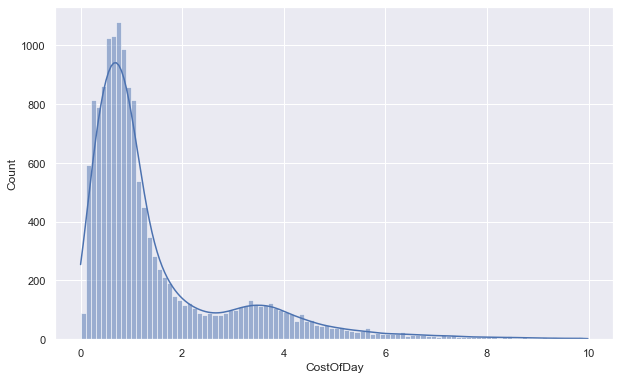

In [397]:
plt.figure(figsize=(10, 6))
sns.histplot(df[df[i] < 10][i], bins=100, kde=True)
plt.show()

#### Cost of visit

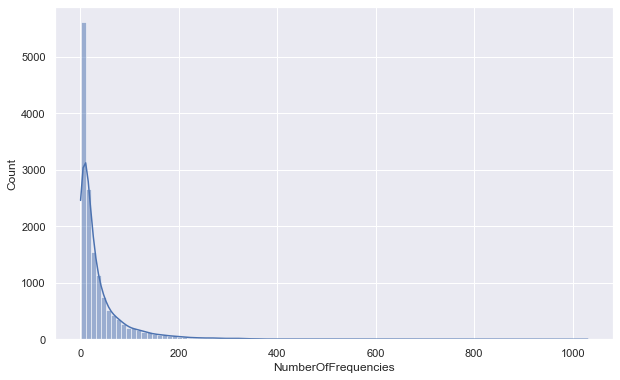

In [398]:
i = 'NumberOfFrequencies'
plt.figure(figsize=(10, 6))
sns.histplot(df[i], bins=100, kde=True)
plt.show()

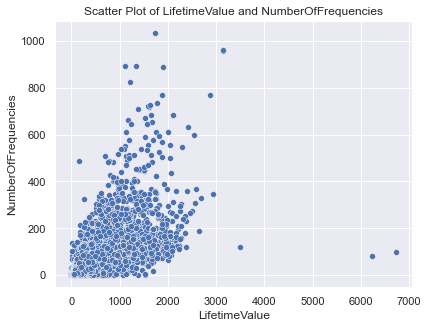

In [399]:
sns.scatterplot(data=df, x='LifetimeValue', y='NumberOfFrequencies')
plt.title('Scatter Plot of LifetimeValue and NumberOfFrequencies')
plt.show()

We also can measure cost of visit per person and check if it is correlated with cost per day - so we can define if there are people how tend to be loyal (have long enrollment period) but they dont really use facilities

In [400]:
df.columns

Index(['ID', 'Age', 'Gender', 'Income', 'EnrollmentStart', 'EnrollmentFinish',
       'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit',
       'DaysWithoutFrequency', 'LifetimeValue', 'UseByTime',
       'AthleticsActivities', 'WaterActivities', 'FitnessActivities',
       'TeamActivities', 'RacketActivities', 'CombatActivities',
       'SpecialActivities', 'OtherActivities', 'NumberOfFrequencies',
       'AttendedClasses', 'AllowedWeeklyVisitsBySLA',
       'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals',
       'HasReferences', 'NumberOfReferences', 'Dropout', 'NumberActivities',
       'EnrollmentStartYear', 'EnrollmentDuration', 'LastPeriodDuration',
       'Recency', 'NoIncome', 'CostOfDay'],
      dtype='object')

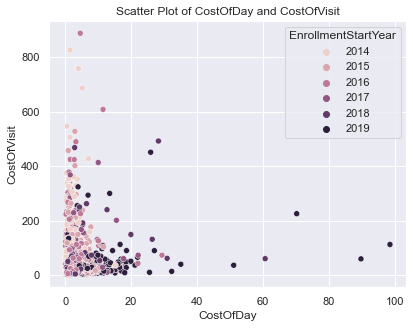

In [401]:
df['CostOfVisit'] = df['LifetimeValue']/(df['NumberOfFrequencies'])

#Let's plot only those who came at least once
sns.scatterplot(data=df[df['NumberOfFrequencies'] > 0], x='CostOfDay', y='CostOfVisit', hue = 'EnrollmentStartYear')
plt.title('Scatter Plot of CostOfDay and CostOfVisit')
plt.show()

We see that there is visible no relation here - that means that even if people stay with us for a long time (so their cost per day is not that big even with large spendings) it doesnt mean that they go to gym during these periods. There are people whose cost of visit is >100 times bigger than the cost of day of a person who has same cost of day! 

#### Gymlovers and Classlovers

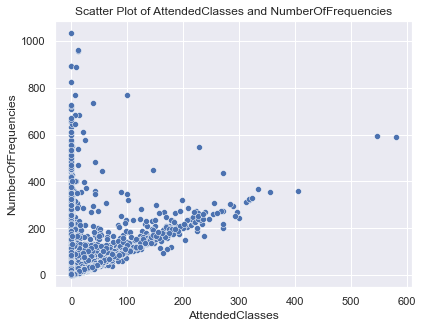

In [402]:
#since there are people that not even came once we will add 1 to number of visits to handle denominator problem
sns.scatterplot(data=df, x='AttendedClasses', y='NumberOfFrequencies')
plt.title('Scatter Plot of AttendedClasses and NumberOfFrequencies')
plt.show()

We see from this chart that there are to groups of people - ones who come for classes and ones who just go to the gym(in the left corner) - that can also help us identify gymlovers and classlovers

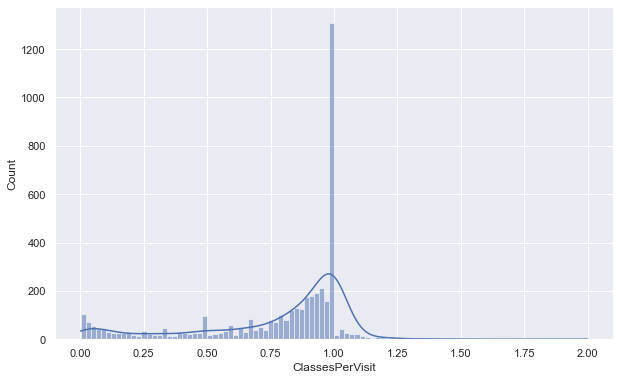

In [403]:
#Let's create a variable which will handle these people

df['ClassesPerVisit'] = df['AttendedClasses']/df['NumberOfFrequencies']

#Plot for those who attended at least one class
i = 'ClassesPerVisit'
plt.figure(figsize=(10, 6))
sns.histplot(df[df['AttendedClasses'] > 0 ][i], bins=100, kde=True)
plt.show()

We see that there are real classgoers - people who come onlt to attend classes or even attend more than 2 classes

#### Last period activity

activity during last months of registration of customers may be an important measure for clusterisation too - so we can do similar analysis of visits but during last two months of it. 

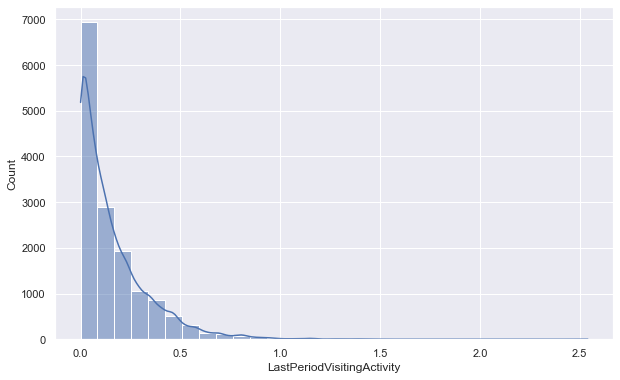

In [404]:
#Let's create this variable since it reflects person's activity better than just number of visits


df['LastPeriodVisitingActivity'] = df['RealNumberOfVisits']/df['AllowedNumberOfVisitsBySLA']

i = 'LastPeriodVisitingActivity'
plt.figure(figsize=(10, 6))
sns.histplot(df[i], bins=30, kde=True)
plt.show()

Numbers close to 0 indicate people who gave up their visit and didn't attend during last months - these might be the guys who always buy membership and then forget about it

#### Correlation matrix and highly correlated variables

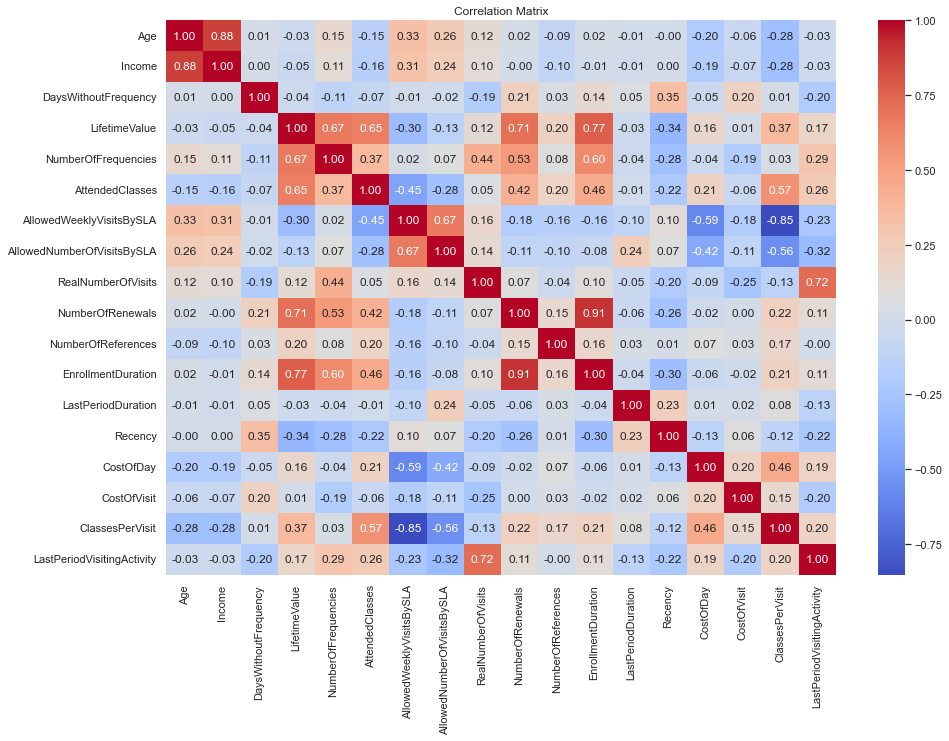

In [405]:
#Let's build correlation matrix with all numeric variables we have
metric_columns = ['Age', 'Income', 'DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies',
       'AttendedClasses', 'AllowedWeeklyVisitsBySLA',
       'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals',
       'NumberOfReferences', 
       'EnrollmentDuration', 'LastPeriodDuration', 'Recency', 
       'CostOfDay', 'CostOfVisit', 
       'ClassesPerVisit', 'LastPeriodVisitingActivity']
# Visualize the correlation matrix
plt.figure(figsize=(15, 10))
sns.heatmap(df[metric_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

'DaysWithoutFrequency' - it doesnt seems like this variable might reflect any patterns among customers since its just some internal measurement|

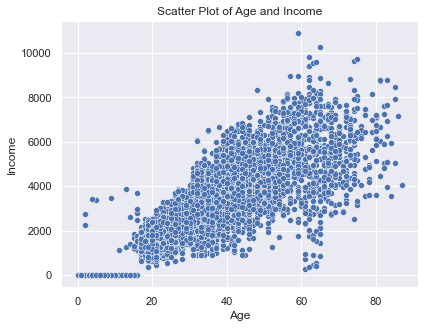

In [406]:
sns.scatterplot(data=df, x='Age', y='Income')
plt.title('Scatter Plot of Age and Income')
plt.show()

There is very strong correlation between age and income, so one of the variables might be redundant. However, age and income might be both important since they handle different aspects of customer portrait

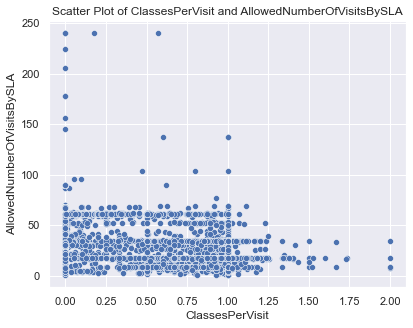

In [407]:
sns.scatterplot(data=df, x='ClassesPerVisit', y='AllowedNumberOfVisitsBySLA')
plt.title('Scatter Plot of ClassesPerVisit and AllowedNumberOfVisitsBySLA')
plt.show()

In case of these two variables there are just some outliers that create weird negative distribution, however, there is no practical sense in this correlation. And we are not going to use AllowedNumberOfVisitsBySLA for clustering since it has nothing to do with client portrait

### Missing values and change of variables

In [408]:
df.isna().sum()/df.shape[0]

ID                            0.000000
Age                           0.000000
Gender                        0.000000
Income                        0.033128
EnrollmentStart               0.000000
EnrollmentFinish              0.000000
LastPeriodStart               0.000000
LastPeriodFinish              0.000000
DateLastVisit                 0.000000
DaysWithoutFrequency          0.000000
LifetimeValue                 0.000000
UseByTime                     0.000000
AthleticsActivities           0.002409
WaterActivities               0.002476
FitnessActivities             0.002342
TeamActivities                0.002342
RacketActivities              0.002476
CombatActivities              0.002209
SpecialActivities             0.002945
OtherActivities               0.002342
NumberOfFrequencies           0.001740
AttendedClasses               0.000000
AllowedWeeklyVisitsBySLA      0.000000
AllowedNumberOfVisitsBySLA    0.000000
RealNumberOfVisits            0.000000
NumberOfRenewals         

In [409]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14942 entries, 0 to 14941
Data columns (total 39 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ID                          14942 non-null  int64         
 1   Age                         14942 non-null  int64         
 2   Gender                      14942 non-null  object        
 3   Income                      14447 non-null  float64       
 4   EnrollmentStart             14942 non-null  datetime64[ns]
 5   EnrollmentFinish            14942 non-null  datetime64[ns]
 6   LastPeriodStart             14942 non-null  datetime64[ns]
 7   LastPeriodFinish            14942 non-null  datetime64[ns]
 8   DateLastVisit               14942 non-null  datetime64[ns]
 9   DaysWithoutFrequency        14942 non-null  int64         
 10  LifetimeValue               14942 non-null  float64       
 11  UseByTime                   14942 non-null  int64     

very few missing values compared to dataset size, so we can impute them using knn imputer for most cases or simpler techinques

In [410]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer

# No we have more metric features that define a person so we will use them
features_for_transform = ['Age', 'Income',  'RealNumberOfVisits', 'NumberOfRenewals',
     'NumberOfReferences', 'NumberOfFrequencies',
       'EnrollmentDuration', 'LastPeriodDuration', 'Recency', 
       'CostOfDay', 'CostOfVisit', 'ClassesPerVisit',
       'LastPeriodVisitingActivity']

df_for_transform = df[features_for_transform]

scaler = MinMaxScaler()
scaled_df_for_transform = scaler.fit_transform(df_for_transform)

imputer = KNNImputer(n_neighbors=15)
imputed_data = pd.DataFrame(imputer.fit_transform(scaled_df_for_transform), columns = features_for_transform)

imputed_data_train = scaler.inverse_transform(imputed_data)

df[features_for_transform] = imputed_data_train
df[['Age', 'Income',  'RealNumberOfVisits', 'NumberOfRenewals',
     'NumberOfReferences', 'NumberOfFrequencies',
       'EnrollmentDuration', 'LastPeriodDuration', 'Recency']] = np.round(df[['Age', 'Income',  'RealNumberOfVisits', 'NumberOfRenewals',
     'NumberOfReferences', 'NumberOfFrequencies',
       'EnrollmentDuration', 'LastPeriodDuration', 'Recency']])

df

,ID,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,...,NumberActivities,EnrollmentStartYear,EnrollmentDuration,LastPeriodDuration,Recency,NoIncome,CostOfDay,CostOfVisit,ClassesPerVisit,LastPeriodVisitingActivity
0,10000,60.0,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,...,1.0,2019,58.0,183.0,1.0,False,3.594540,9.927778,0.777778,0.318471
1,10001,29.0,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,...,1.0,2014,398.0,364.0,1568.0,False,4.214070,20.834783,0.043478,0.057405
2,10002,23.0,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,...,1.0,2017,30.0,180.0,889.0,False,1.253333,6.266667,0.000000,0.199800
3,10003,9.0,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,...,1.0,2018,160.0,364.0,283.0,True,3.399375,7.770000,0.100000,0.169300
4,10004,35.0,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,...,1.0,2016,778.0,180.0,721.0,False,0.479692,9.102439,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14937,24937,14.0,Male,0.0,2016-09-08,2019-10-29,2019-07-01,2019-12-31,2019-10-29,2,...,1.0,2016,1146.0,183.0,2.0,True,2.230181,13.039732,0.857143,0.229621
14938,24938,39.0,Male,3529.0,2015-09-17,2016-06-04,2016-01-01,2016-06-30,2016-04-27,38,...,1.0,2015,261.0,181.0,1282.0,False,1.317433,6.032456,0.000000,0.049205
14939,24939,20.0,Male,1810.0,2017-03-01,2017-03-31,2017-01-01,2017-06-30,2017-03-29,2,...,1.0,2017,30.0,180.0,946.0,False,1.453333,7.266667,0.000000,0.266400
14940,24940,55.0,Male,4800.0,2018-03-01,2019-10-28,2019-07-01,2019-12-31,2019-10-28,3,...,1.0,2018,606.0,183.0,3.0,False,3.036414,4.262703,0.837838,0.441084


In [411]:
#recalculate some features that were dependant on columns with missing values

df['CostOfDay'] = df['LifetimeValue']/df['EnrollmentDuration']
df['CostOfVisit'] = df['LifetimeValue']/(df['NumberOfFrequencies'])
df['ClassesPerVisit'] = df['AttendedClasses']/df['NumberOfFrequencies']

In [412]:
#fillna in binaries with mode
df[['AthleticsActivities', 'WaterActivities', 'FitnessActivities',
       'TeamActivities', 'RacketActivities', 'CombatActivities',
       'SpecialActivities', 'OtherActivities']] = df[['AthleticsActivities', 'WaterActivities', 'FitnessActivities',
       'TeamActivities', 'RacketActivities', 'CombatActivities',
       'SpecialActivities', 'OtherActivities']].apply(lambda x: x.fillna(x.mode()[0]))

# Fix this column based on another one
df['HasReferences'] = df['NumberOfReferences'].apply(lambda x: 0 if x == 0 else 1)

In [413]:
df.isna().sum()/df.shape[0]

ID                            0.0
Age                           0.0
Gender                        0.0
Income                        0.0
EnrollmentStart               0.0
EnrollmentFinish              0.0
LastPeriodStart               0.0
LastPeriodFinish              0.0
DateLastVisit                 0.0
DaysWithoutFrequency          0.0
LifetimeValue                 0.0
UseByTime                     0.0
AthleticsActivities           0.0
WaterActivities               0.0
FitnessActivities             0.0
TeamActivities                0.0
RacketActivities              0.0
CombatActivities              0.0
SpecialActivities             0.0
OtherActivities               0.0
NumberOfFrequencies           0.0
AttendedClasses               0.0
AllowedWeeklyVisitsBySLA      0.0
AllowedNumberOfVisitsBySLA    0.0
RealNumberOfVisits            0.0
NumberOfRenewals              0.0
HasReferences                 0.0
NumberOfReferences            0.0
Dropout                       0.0
NumberActiviti

### EDA

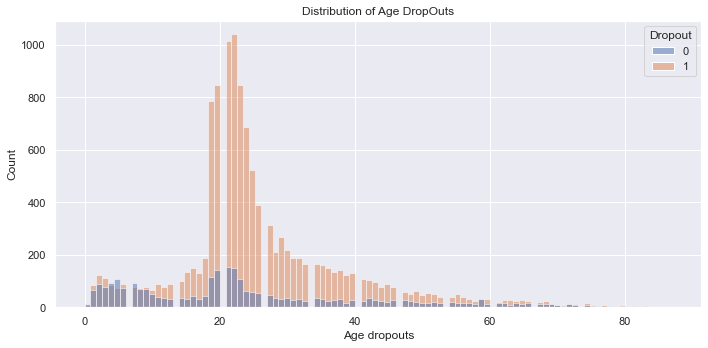

In [414]:
fig, axes = plt.subplots(1, 1, figsize=(10,5))

sns.histplot(data=df, x='Age', bins=100, hue = 'Dropout')
plt.title('Distribution of Age DropOuts')
plt.xlabel('Age dropouts')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

In [415]:
ages = []
for i in range(0, len(df)):
    ages.append(int(df['Age'].iloc[i] - df['EnrollmentDuration'].iloc[i]/360))
df['AgeStart'] = ages

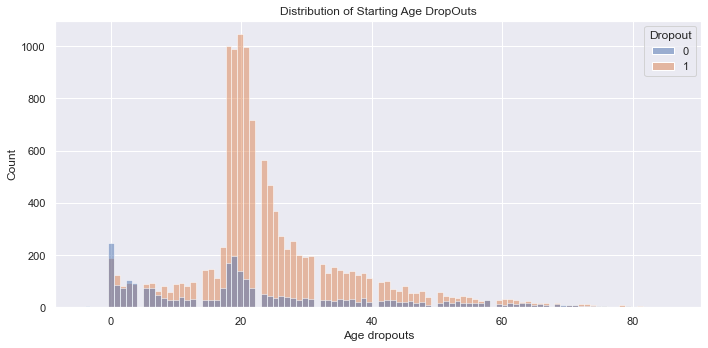

In [416]:
fig, axes = plt.subplots(1, 1, figsize=(10,5))

sns.histplot(data=df, x='AgeStart', bins=100, hue = 'Dropout')
plt.title('Distribution of Starting Age DropOuts')
plt.xlabel('Age dropouts')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

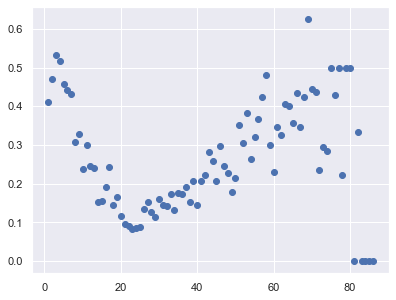

In [417]:
colors = sns.color_palette('pastel')[0:5]
df = df.loc[df['AgeStart']>0]
ageStart = df['AgeStart'].unique()
df.loc[df['Dropout']==0]
countAge=[]
for i in ageStart:
    countAge.append(len(df.loc[(df['AgeStart']==i )& (df['Dropout']==0)])/len(df.loc[(df['AgeStart']==i)]))
#create pie chart
plt.scatter(x=ageStart, y = countAge)

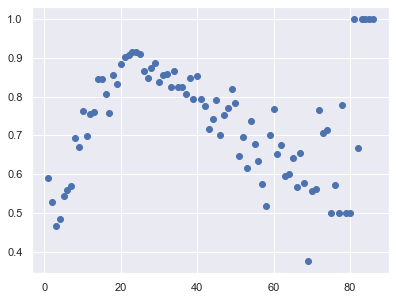

In [418]:
colors = sns.color_palette('pastel')[0:5]
df = df.loc[df['AgeStart']>0]
ageStart = df['AgeStart'].unique()
df.loc[df['Dropout']==0]
countAge=[]
for i in ageStart:
    countAge.append(len(df.loc[(df['AgeStart']==i )& (df['Dropout']==1)])/len(df.loc[(df['AgeStart']==i)]))
#create pie chart
plt.scatter(x=ageStart, y = countAge)

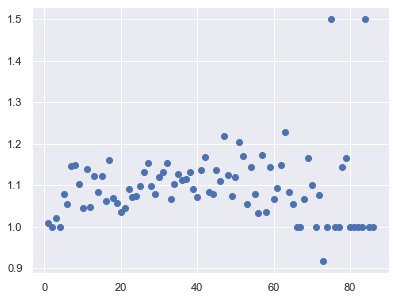

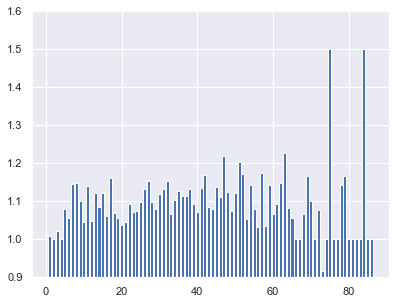

In [419]:
colors = sns.color_palette('pastel')[0:5]
df = df.loc[df['AgeStart']>0]
ageStart = df['AgeStart'].unique()
df.loc[df['Dropout']==0]
Activities=[]
for i in ageStart:
    Activities.append(df['NumberActivities'].loc[(df['AgeStart']==i )& (df['Dropout']==1)].mean())
    
plt.scatter(x=ageStart, y = Activities)
plt.show()
plt.bar(x=ageStart, height = Activities)
plt.ylim(0.9, 1.6)
plt.show()
    

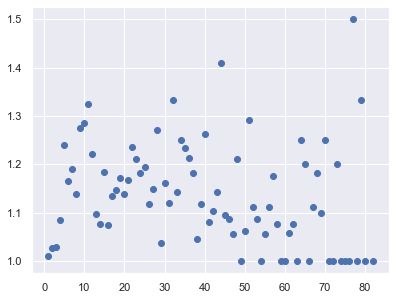

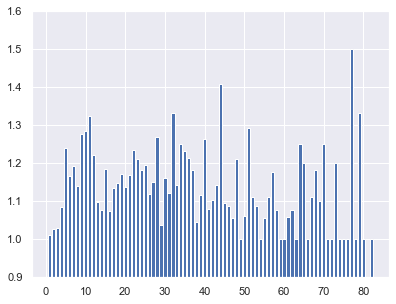

In [420]:
colors = sns.color_palette('pastel')[0:5]
df = df.loc[df['AgeStart']>0]
ageStart = df['AgeStart'].unique()
df.loc[df['Dropout']==0]
Activities=[]
for i in ageStart:
    Activities.append(df['NumberActivities'].loc[(df['AgeStart']==i )& (df['Dropout']==0)].mean())
    
plt.scatter(x=ageStart, y = Activities)
plt.show()
plt.bar(x=ageStart, height = Activities)
plt.ylim(0.9, 1.6)
plt.show()
    

### Outliers

In [421]:
df_clustering = df[['ID', 'Age', 'Income',  'RealNumberOfVisits', 'NumberOfRenewals',
     'NumberOfReferences', 'NumberOfFrequencies', 'NumberActivities',
       'EnrollmentDuration', 'Recency', 'AttendedClasses', 'LifetimeValue',
       'CostOfDay', 'CostOfVisit', 'ClassesPerVisit',
       'LastPeriodVisitingActivity']]
df_clustering.set_index('ID', inplace = True)

#### Skewness, log and transformations

Age
Skewness: 1.2083208687810536
Skewness: -0.9858842058373339
Skewness: 0.20239445934744338


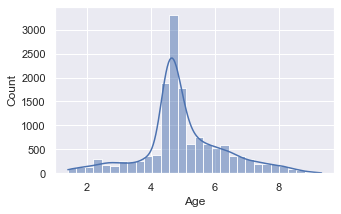

Income
Skewness: 1.0018888945316005
Skewness: -2.066947140321689
Skewness: -0.7285973017477833


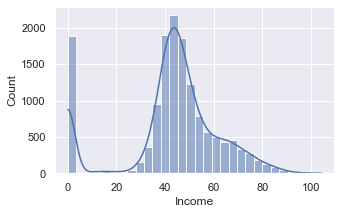

RealNumberOfVisits
Skewness: 2.8479661281367727
Skewness: -0.02994886917191756
Skewness: 0.4801665126523072


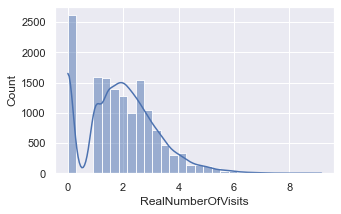

NumberOfRenewals
Skewness: 1.2165622138400436
Skewness: 0.3753517463702357
Skewness: 0.2089857622103864


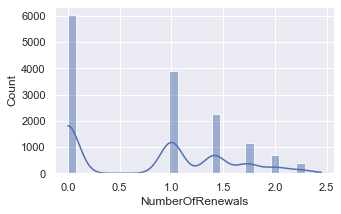

NumberOfReferences
Skewness: 9.66840022062338
Skewness: 8.039506492034793
Skewness: 7.730588073674073


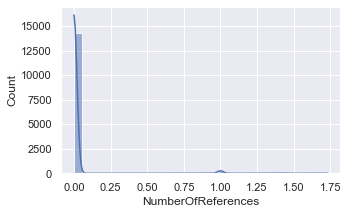

NumberOfFrequencies
Skewness: 4.871498141623112
Skewness: 0.17546664233915688
Skewness: 1.7781529455373173


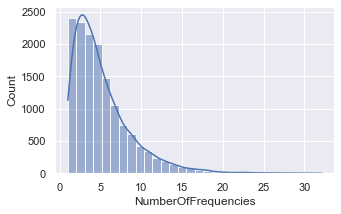

NumberActivities
Skewness: 3.461435224434733
Skewness: 2.4361015970242987
Skewness: 1.6176101123960114


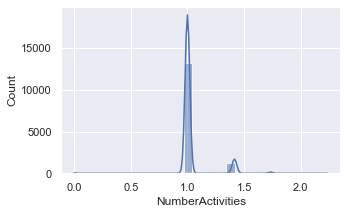

EnrollmentDuration
Skewness: 1.6066086116110159
Skewness: -0.1874824942986605
Skewness: 0.8022137750908386


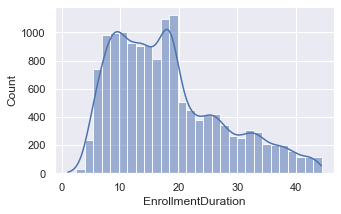

Recency
Skewness: 0.22684557143688067
Skewness: -1.4490543026440053
Skewness: -0.3920815285416421


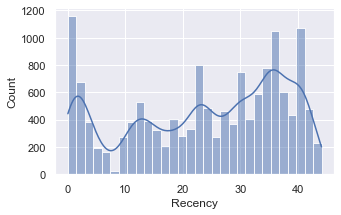

AttendedClasses
Skewness: 5.690887112335081
Skewness: 1.5929077061036543
Skewness: 2.449498273435845


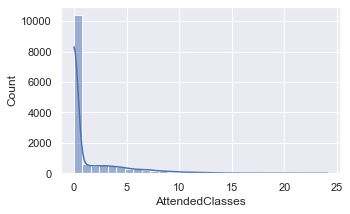

LifetimeValue
Skewness: 3.2420733399946267
Skewness: 0.32624375690491514
Skewness: 1.4345089039324224


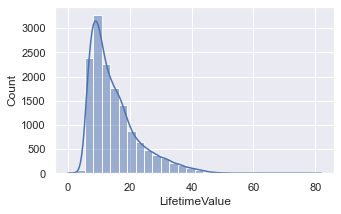

CostOfDay
Skewness: 42.62883098570853
Skewness: 1.5151099983935026
Skewness: 4.03899404440667


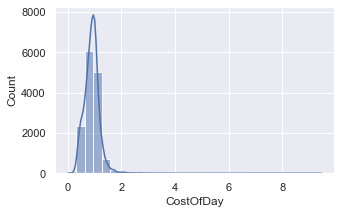

CostOfVisit
Skewness: 9.869247526085179
Skewness: 0.9085144067745852
Skewness: 3.2483937107974747


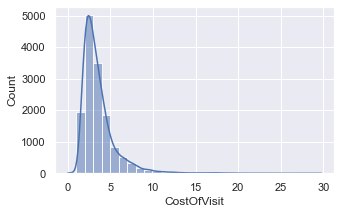

ClassesPerVisit
Skewness: 1.3713807139410454
Skewness: 1.28676716592169
Skewness: 1.1887617209784744


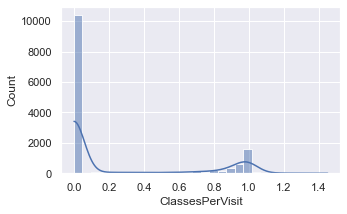

LastPeriodVisitingActivity
Skewness: 2.2755371813468193
Skewness: 1.5326603030572366
Skewness: 0.41710686421552884


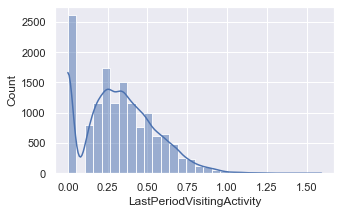

In [422]:
for k in range(len(df_clustering.columns)):
    i = df_clustering.columns[k]
    print(i)
    print("Skewness: {}".format(sc.skew(df_clustering[i])))
    print("Skewness: {}".format(sc.skew(np.log1p(df_clustering[i]))))
    print("Skewness: {}".format(sc.skew(np.sqrt(df_clustering[i]))))
    plt.figure(figsize=(5, 3))
    sns.histplot(df_clustering[i]**0.5, bins=30, kde=True)
    plt.show()


We see that almost variables are skewed - so we will apply log or sqrt transformations to handle this for further clusterisation

Cost of day, cost of visit, number of frequencies, AttendedClasses are the ones that need log transformation before outliers detection and clusterisation. 

Also some variables with not that big skewness still have long right tail, so log transformation will be useful (Enrollment duration, Real Number of Visits, LTV)

Sqrt transformation will help in case of Age, Income, Number of renewals and LastPeriodVisitingActivity, as their tail is not that long but still causes problems for some clusterisation algorithms

From this plot we also see that Number of references is very poor(in terms of variability) variable, same problem happend with NumberActivities where almost all people have 1 or 2 as number, so column becomes binary. We will remove both

In [423]:
df_clustering.drop(columns = ['NumberOfReferences', 'NumberActivities'], inplace = True)

/var/folders/kk/jn6jnrpj6_30s05tyyfmmk9h0000gn/T/ipykernel_47740/2157026330.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clustering.drop(columns = ['NumberOfReferences', 'NumberActivities'], inplace = True)


In [424]:
print("Skewness CostOfDay before log: {}".format(sc.skew(df_clustering['CostOfDay'])))
print("Skewness CostOfVisit before log: {}".format(sc.skew(df_clustering['CostOfVisit'])))
print("Skewness NumberOfFrequencies before log: {}".format(sc.skew(df_clustering['NumberOfFrequencies'])))
print("Skewness RealNumberOfVisits before log: {}".format(sc.skew(df_clustering['RealNumberOfVisits'])))
print("Skewness EnrollmentDuration before log: {}".format(sc.skew(df_clustering['EnrollmentDuration'])))
print("Skewness LifetimeValue before log: {}".format(sc.skew(df_clustering['LifetimeValue'])))
print("Skewness AttendedClasses before log: {}".format(sc.skew(df_clustering['AttendedClasses'])))
print('\n')

df_clustering['NumberOfFrequencies'] = np.log1p(df_clustering['NumberOfFrequencies'])
df_clustering['CostOfDay'] = np.log1p(df_clustering['CostOfDay'])
df_clustering['CostOfVisit'] = np.log1p(df_clustering['CostOfVisit'])
df_clustering['RealNumberOfVisits'] = np.log1p(df_clustering['RealNumberOfVisits'])
df_clustering['EnrollmentDuration'] = np.log1p(df_clustering['EnrollmentDuration'])
df_clustering['LifetimeValue'] = np.log1p(df_clustering['LifetimeValue'])
df_clustering['AttendedClasses'] = np.log1p(df_clustering['AttendedClasses'])

print("Skewness CostOfDay after log: {}".format(sc.skew(df_clustering['CostOfDay'])))
print("Skewness CostOfVisit after log: {}".format(sc.skew(df_clustering['CostOfVisit'])))
print("Skewness NumberOfFrequencies after log: {}".format(sc.skew(df_clustering['NumberOfFrequencies'])))
print("Skewness RealNumberOfVisits after log: {}".format(sc.skew(df_clustering['RealNumberOfVisits'])))
print("Skewness EnrollmentDuration after log: {}".format(sc.skew(df_clustering['EnrollmentDuration'])))
print("Skewness LifetimeValue after log: {}".format(sc.skew(df_clustering['LifetimeValue'])))
print("Skewness AttendedClasses after log: {}".format(sc.skew(df_clustering['AttendedClasses'])))
print('\n')

print("Skewness Age before sqrt: {}".format(sc.skew(df_clustering['Age'])))
print("Skewness LastPeriodVisitingActivity before sqrt: {}".format(sc.skew(df_clustering['LastPeriodVisitingActivity'])))
print("Skewness NumberOfRenewals before sqrt: {}".format(sc.skew(df_clustering['NumberOfRenewals'])))
print("Skewness Income before sqrt: {}".format(sc.skew(df_clustering['Income'])))
print('\n')

df_clustering['Age'] = np.sqrt(df_clustering['Age'])
df_clustering['LastPeriodVisitingActivity'] = np.sqrt(df_clustering['LastPeriodVisitingActivity'])
df_clustering['NumberOfRenewals'] = np.sqrt(df_clustering['NumberOfRenewals'])
df_clustering['Income'] = np.sqrt(df_clustering['Income'])

print("Skewness Age after sqrt: {}".format(sc.skew(df_clustering['Age'])))
print("Skewness LastPeriodVisitingActivity after sqrt: {}".format(sc.skew(df_clustering['LastPeriodVisitingActivity'])))
print("Skewness NumberOfRenewals after sqrt: {}".format(sc.skew(df_clustering['NumberOfRenewals'])))
print("Skewness Income after sqrt: {}".format(sc.skew(df_clustering['Income'])))


Skewness CostOfDay before log: 42.62883098570853
Skewness CostOfVisit before log: 9.869247526085179
Skewness NumberOfFrequencies before log: 4.871498141623112
Skewness RealNumberOfVisits before log: 2.8479661281367727
Skewness EnrollmentDuration before log: 1.6066086116110159
Skewness LifetimeValue before log: 3.2420733399946267
Skewness AttendedClasses before log: 5.690887112335081


Skewness CostOfDay after log: 1.5151099983935026
Skewness CostOfVisit after log: 0.9085144067745852
Skewness NumberOfFrequencies after log: 0.17546664233915688
Skewness RealNumberOfVisits after log: -0.02994886917191756
Skewness EnrollmentDuration after log: -0.1874824942986605
Skewness LifetimeValue after log: 0.32624375690491514
Skewness AttendedClasses after log: 1.5929077061036543


Skewness Age before sqrt: 1.2083208687810536
Skewness LastPeriodVisitingActivity before sqrt: 2.2755371813468193
Skewness NumberOfRenewals before sqrt: 1.2165622138400436
Skewness Income before sqrt: 1.0018888945316005


S

/var/folders/kk/jn6jnrpj6_30s05tyyfmmk9h0000gn/T/ipykernel_47740/3205968063.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clustering['NumberOfFrequencies'] = np.log1p(df_clustering['NumberOfFrequencies'])
/var/folders/kk/jn6jnrpj6_30s05tyyfmmk9h0000gn/T/ipykernel_47740/3205968063.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clustering['CostOfDay'] = np.log1p(df_clustering['CostOfDay'])
/var/folders/kk/jn6jnrpj6_30s05tyyfmmk9h0000gn/T/ipykernel_47740/3205968063.py:12: SettingWithCopyWarn

NumberOfFrequencies
Skewness: 0.17546664233915688


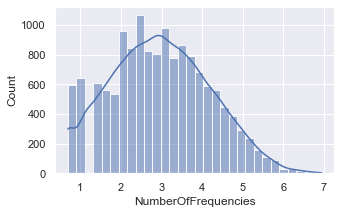

CostOfDay
Skewness: 1.5151099983935026


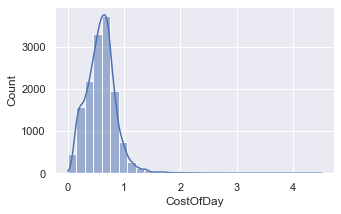

CostOfVisit
Skewness: 0.9085144067745852


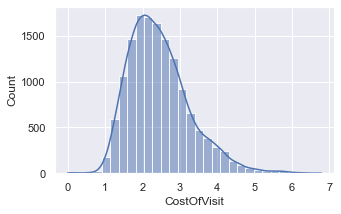

RealNumberOfVisits
Skewness: -0.02994886917191756


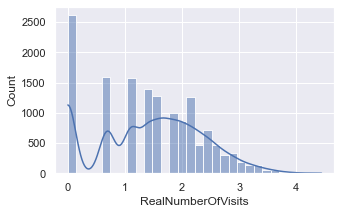

EnrollmentDuration
Skewness: -0.1874824942986605


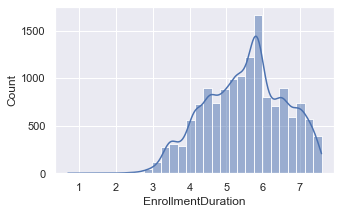

Age
Skewness: 0.20239445934744338


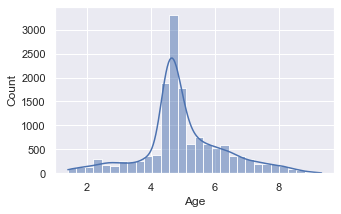

Income
Skewness: -0.7285973017477833


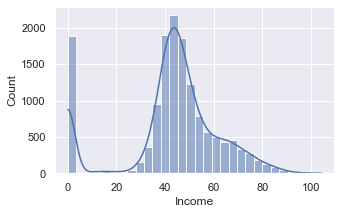

LastPeriodVisitingActivity
Skewness: 0.41710686421552884


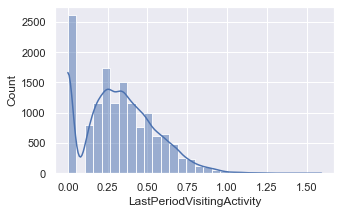

NumberOfRenewals
Skewness: 0.2089857622103864


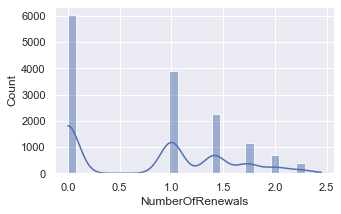

LifetimeValue
Skewness: 0.32624375690491514


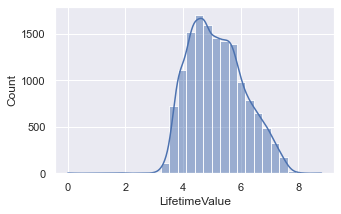

AttendedClasses
Skewness: 1.5929077061036543


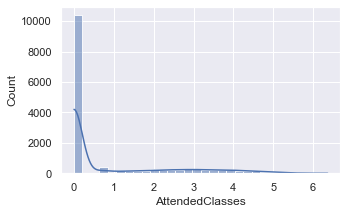

In [425]:
for k in ['NumberOfFrequencies', 'CostOfDay', 
          'CostOfVisit', 'RealNumberOfVisits', 
          'EnrollmentDuration', 'Age', 'Income',
          'LastPeriodVisitingActivity', 'NumberOfRenewals',
          'LifetimeValue', 'AttendedClasses'
         ]:
    print(k)
    print("Skewness: {}".format(sc.skew(df_clustering[k])))
    plt.figure(figsize=(5, 3))
    sns.histplot(df_clustering[k], bins=30, kde=True)
    plt.show()

Way better result!

#### IQR and Zscore

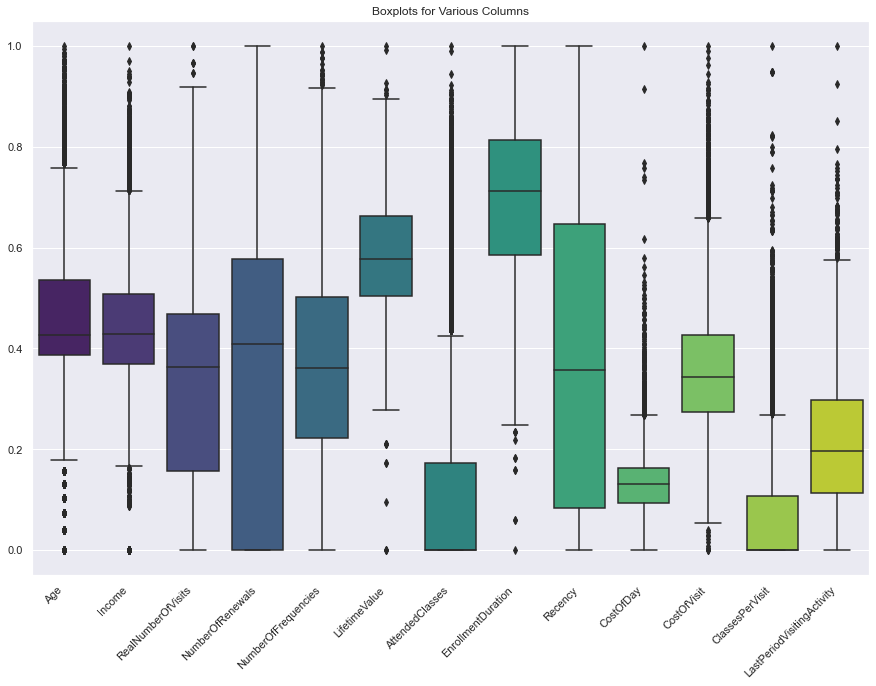

In [426]:

columns_to_plot = ['Age', 'Income', 'RealNumberOfVisits', 'NumberOfRenewals',
                   'NumberOfFrequencies', 'LifetimeValue', 'AttendedClasses',
                   'EnrollmentDuration',  'Recency',
                   'CostOfDay', 'CostOfVisit', 'ClassesPerVisit',
                   'LastPeriodVisitingActivity']

scaler = MinMaxScaler()

# Create boxplots for each column
plt.figure(figsize=(15, 10))
sns.boxplot(data=pd.DataFrame(scaler.fit_transform(df_clustering[columns_to_plot]), columns = columns_to_plot), orient='v', palette='viridis')
plt.title('Boxplots for Various Columns')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.show()

According to IQR method we have too many outliers - but we cannot just delete whole dataset, so we can use other techniques to deal with outliers

In [427]:
# Assuming df is your DataFrame with numerical columns
for k in range(len(df_clustering.columns)):
    i = df_clustering.columns[k]
    print(i)
    
    # IQR method
    Q1 = df_clustering[i].quantile(0.25)
    Q3 = df_clustering[i].quantile(0.75)
    IQR = Q3 - Q1
    outliers_iqr = (df_clustering[i] < Q1 - 1.5 * IQR) | (df_clustering[i] > Q3 + 1.5 * IQR)
    
    # Z-score method
    df_clustering['Zscore'] = (df_clustering[i] - df_clustering[i].mean()) / df_clustering[i].std()
    outliers_zscore = (df_clustering['Zscore'] > 3) | (df_clustering['Zscore'] < -3)
    
    print("Outliers (IQR) - number: {}, lower_bound: {}, upper_bound: {}".format(len(df_clustering[outliers_iqr])
          , np.max(df_clustering[df_clustering[i] < Q1 - 1.5 * IQR][i])
          , np.min(df_clustering[df_clustering[i] > Q3 + 1.5 * IQR][i])))
    
    print("Outliers (Z-score) - number: {}, lower_bound: {}, upper_bound: {}".format(len(df_clustering[outliers_zscore])
          , np.max(df_clustering[df_clustering['Zscore'] < -3][i])
          , np.min(df_clustering[df_clustering['Zscore'] > 3][i])))
    print("\n")
    df_clustering.drop(columns = ['Zscore'], inplace = True)

Age
Outliers (IQR) - number: 1574, lower_bound: 2.6457513110645907, upper_bound: 7.483314773547883
Outliers (Z-score) - number: 36, lower_bound: nan, upper_bound: 8.94427190999916


Income
Outliers (IQR) - number: 2589, lower_bound: 17.05872210923198, upper_bound: 74.43117626371358
Outliers (Z-score) - number: 1, lower_bound: nan, upper_bound: 104.35516278555652


RealNumberOfVisits
Outliers (IQR) - number: 7, lower_bound: nan, upper_bound: 4.204692619390966
Outliers (Z-score) - number: 5, lower_bound: nan, upper_bound: 4.290459441148391


NumberOfRenewals
Outliers (IQR) - number: 0, lower_bound: nan, upper_bound: nan
Outliers (Z-score) - number: 0, lower_bound: nan, upper_bound: nan


NumberOfFrequencies
Outliers (IQR) - number: 22, lower_bound: nan, upper_bound: 6.453624998892692
Outliers (Z-score) - number: 9, lower_bound: nan, upper_bound: 6.645090969505644


EnrollmentDuration
Outliers (IQR) - number: 11, lower_bound: 2.302585092994046, upper_bound: nan
Outliers (Z-score) - number

/var/folders/kk/jn6jnrpj6_30s05tyyfmmk9h0000gn/T/ipykernel_47740/528244026.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clustering['Zscore'] = (df_clustering[i] - df_clustering[i].mean()) / df_clustering[i].std()
/var/folders/kk/jn6jnrpj6_30s05tyyfmmk9h0000gn/T/ipykernel_47740/528244026.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clustering.drop(columns = ['Zscore'], inplace = True)
/var/folders/kk/jn6jnrpj6_30s05tyyfmmk9h0000gn/T/ipykernel_47740/528244026.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

We see that Z-score in most cases we have upper boundary outliers and Z-score provide higher upper boundary, identifying less outliers. This seems to be more reasonable approach as almost all of our variables have distributions with heavy tails and we dont want to punish them too much for it. However, for some variables both approaches are too radical in outliers identification - for example, we will not remove 300 people using only one feature. We can experiment with boundaries as well since not all the variables we have are normally distributed - so we can keep more of tails

#### DBSCAN for outliers

Also we can use DBSCAN to find outliers - and then try to find outliers which we identified by many approaches

In [428]:

df_dbscan = df_clustering.copy()

scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df_clustering)


epsilon = 0.3
min_samples = 5
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
df_dbscan['Cluster'] = dbscan.fit_predict(df_scaled)

outliers = df_dbscan[df_dbscan['Cluster'] == -1]
df_dbscan.set_index('Cluster', inplace = True)

pd.Series(dbscan.labels_).value_counts()


 1    8217
 0    5986
-1     302
dtype: int64

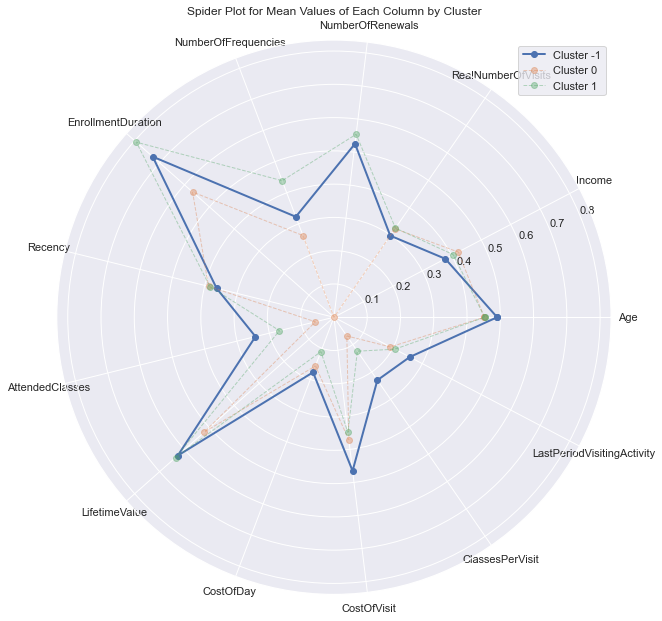

In [429]:
normalized_data = (df_dbscan - df_dbscan.min()) / (df_dbscan.max() - df_dbscan.min())

grouped_data = normalized_data.groupby(normalized_data.index).mean()

normalized_data = grouped_data

num_categories = len(grouped_data.columns)

angles = np.linspace(0, 2 * np.pi, num_categories, endpoint=False).tolist()
angles.append(angles[0])

plt.figure(figsize=(10, 10))
for i in range(len(normalized_data)):
    values = normalized_data.iloc[i].tolist()
    values.append(values[0])
    if normalized_data.index[i] == -1:
        plt.polar(angles, values, marker='o', linestyle='-', linewidth=2, label=f'Cluster {normalized_data.index[i]}')
    else:
        plt.polar(angles, values, marker='o', linestyle='--', linewidth=1, alpha=0.4, label=f'Cluster {normalized_data.index[i]}')

plt.xticks(angles[:-1], grouped_data.columns)
plt.legend(loc='upper right')
plt.title('Spider Plot for Mean Values of Each Column by Cluster')

plt.show()


DBSCAN (with epsilon = 0.3 and min_samples = 5) tends to put classlovers with high cost of visit as outliers 

#### Visual approach

Let's try hand approach based on plots.

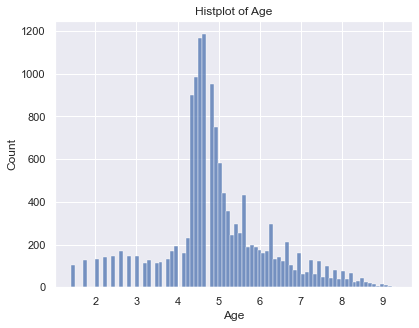

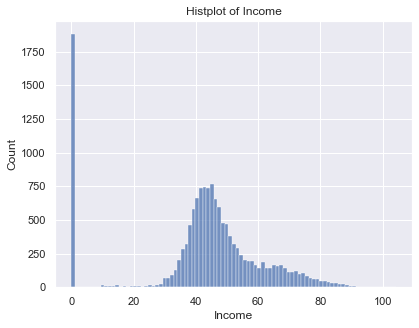

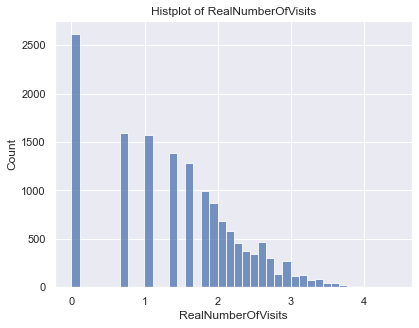

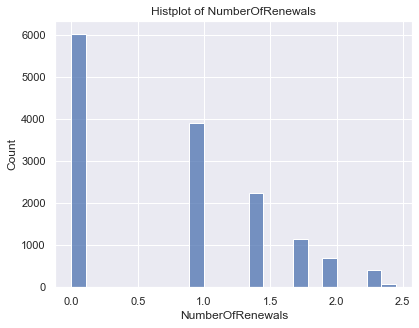

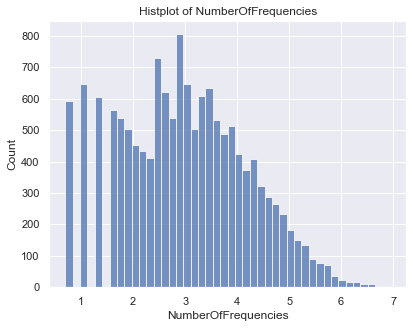

...

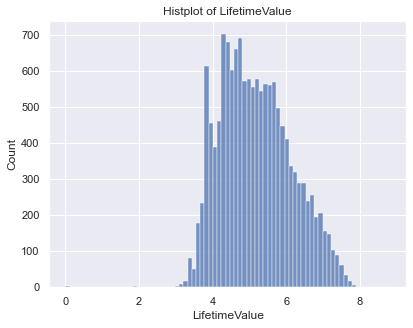

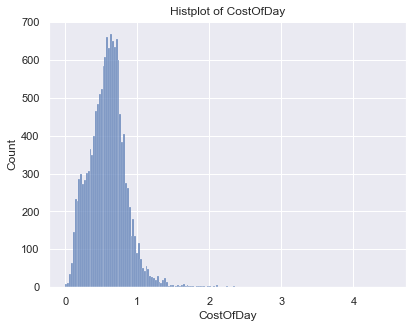

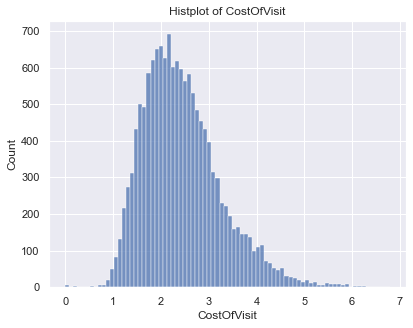

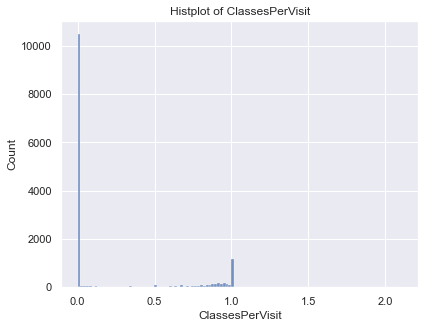

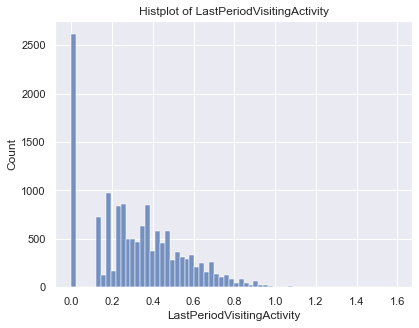

In [430]:
for i in (df_clustering.columns):
    sns.histplot(df_clustering, x = i)
    plt.title('Histplot of ' + str(i))
    plt.show()

In [431]:
df_clustering['outliers_hand'] = ((df_clustering['LastPeriodVisitingActivity'] > 1) 
            | (df_clustering['ClassesPerVisit'] > 1.5)
            | (df_clustering['CostOfVisit'] > 5.5)
            | (df_clustering['CostOfDay'] > 1.5)
            | (df_clustering['EnrollmentDuration'] < 2.5)
            | (df_clustering['NumberOfFrequencies'] > 6.5)
            | (df_clustering['RealNumberOfVisits'] > 4)
            | (df_clustering['Age'] > 9)
            | (df_clustering['Income'] > 90)
            | (df_clustering['LifetimeValue'] < 3)
            | (df_clustering['LifetimeValue'] > 8)
            | (df_clustering['AttendedClasses'] > 5.7)
                                 )

/var/folders/kk/jn6jnrpj6_30s05tyyfmmk9h0000gn/T/ipykernel_47740/1272968752.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clustering['outliers_hand'] = ((df_clustering['LastPeriodVisitingActivity'] > 1)


#### Comparison and final solution

Let's combine all approaches and check what are the outliers. Before it We suggest to remove some columns since we should not deleted all old people or people with no income - they are important representatives of their groups. Same idea will go to some different columns. It is better to explore columns by hand and check for some really extreme values

In [432]:
for k in range(len(df_clustering.columns)-1):
    i = df_clustering.columns[k]

    # IQR method
    Q1 = df_clustering[i].quantile(0.25)
    Q3 = df_clustering[i].quantile(0.75)
    IQR = Q3 - Q1
    outliers_iqr += (df_clustering[i] < Q1 - 1.5 * IQR) | (df_clustering[i] > Q3 + 1.5 * IQR)
    
    # Z-score method
    df_clustering['Zscore'] = (df_clustering[i] - df_clustering[i].mean()) / df_clustering[i].std()
    outliers_zscore += (df_clustering['Zscore'] > 3) | (df_clustering['Zscore'] < -3)
    df_clustering.drop(columns = ['Zscore'], inplace = True)
df_clustering['outliers_zscore'] = outliers_zscore
df_clustering['outliers_iqr'] = outliers_iqr
df_clustering['outliers_dbscan'] = list(pd.Series(df_dbscan.index).apply(lambda x: 1 if x == -1 else 0))
clear_output()
df_clustering

,Age,Income,RealNumberOfVisits,NumberOfRenewals,NumberOfFrequencies,EnrollmentDuration,Recency,AttendedClasses,LifetimeValue,CostOfDay,CostOfVisit,ClassesPerVisit,LastPeriodVisitingActivity,outliers_hand,outliers_zscore,outliers_iqr,outliers_dbscan
ID,,,,,,,,,,,,,,,,,
10000,7.745967,74.161985,1.098612,0.000000,2.302585,4.077537,1.0,2.079442,4.503691,0.932368,2.391308,0.777778,0.564333,False,False,True,0
10001,5.385165,51.283526,0.693147,1.414214,3.178054,5.988961,1568.0,0.693147,6.174203,0.790283,3.083504,0.043478,0.239594,False,False,False,0
10002,4.795832,44.497191,1.945910,0.000000,1.945910,3.433987,889.0,0.000000,3.653252,0.812411,1.983298,0.000000,0.446990,False,False,False,0
10003,3.000000,0.000000,1.386294,0.000000,3.044522,5.081404,283.0,1.098612,5.052417,0.678668,2.171337,0.100000,0.411461,False,False,True,0
10004,5.916080,65.726707,0.000000,1.732051,3.737670,6.658011,721.0,0.000000,5.924790,0.391834,2.312777,0.000000,0.000000,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,3.741657,0.000000,2.197225,1.732051,4.727388,7.044905,2.0,4.574711,7.287184,0.821712,2.641891,0.857143,0.479188,False,False,True,0
24938,6.244998,59.405387,1.386294,0.000000,4.060443,5.568345,1282.0,0.000000,5.843110,0.840460,1.950536,0.000000,0.221821,False,False,False,0
24939,4.472136,42.544095,2.197225,0.000000,1.945910,3.433987,946.0,0.000000,3.797734,0.897448,2.112231,0.000000,0.516140,False,False,False,0


In [433]:
pd.DataFrame(df_clustering[['outliers_iqr','outliers_zscore','outliers_hand', 'outliers_dbscan']].value_counts()).reset_index()

,outliers_iqr,outliers_zscore,outliers_hand,outliers_dbscan,0
0,False,False,False,0,9639
1,True,False,False,0,4174
2,True,True,False,0,201
3,True,True,True,0,153
4,True,False,False,1,142
5,True,True,True,1,109
6,True,False,True,0,36
7,False,False,False,1,26
8,True,True,False,1,20
9,True,False,True,1,5


In [434]:
pd.DataFrame(df_clustering[['outliers_iqr','outliers_zscore','outliers_hand']].value_counts()).reset_index()

,outliers_iqr,outliers_zscore,outliers_hand,0
0,False,False,False,9665
1,True,False,False,4316
2,True,True,True,262
3,True,True,False,221
4,True,False,True,41


We see that IQR, xscore and hand approaches provide almost similar solutions (IQR is most radical, zscore is subset of it and hand approach is mostly subset of zscore). The result is so since they use same idea - take each variable and identify values that lie far away from meadian, corners of distributions. DBSCAN is different since it takes into consideration all variables at once, but as mentioned before it focuses too much on age and number of renewals which is not that important. However, hand approach seems more reliable and gonna be final solution.

In [435]:
condition = (
    (df_clustering['LastPeriodVisitingActivity'] > 1) |
    (df_clustering['ClassesPerVisit'] > 1.5) |
    (df_clustering['CostOfVisit'] > 5.5) |
    (df_clustering['CostOfDay'] > 1.5) |
    (df_clustering['EnrollmentDuration'] < 2.5) |
    (df_clustering['NumberOfFrequencies'] > 6.5) |
    (df_clustering['RealNumberOfVisits'] > 4) |
    (df_clustering['Age'] > 9) |
    (df_clustering['Income'] > 90) | 
    (df_clustering['LifetimeValue'] < 3) | 
    (df_clustering['LifetimeValue'] > 8) | 
    (df_clustering['AttendedClasses'] > 5.7)
)

print('Percentage of outliers: {}'.format( np.round(len(df_clustering[condition])/len(df_clustering), 3)))
df_clustering = df_clustering.drop(df_clustering[condition].index)
df_clustering.drop(columns=['outliers_hand', 'outliers_zscore', 'outliers_iqr', 'outliers_dbscan'], inplace = True)

Percentage of outliers: 0.021


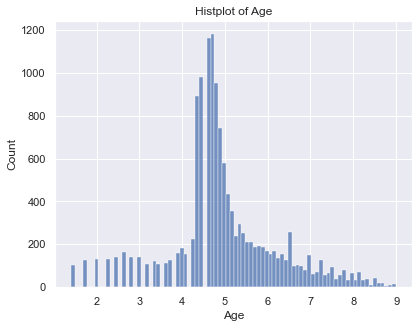

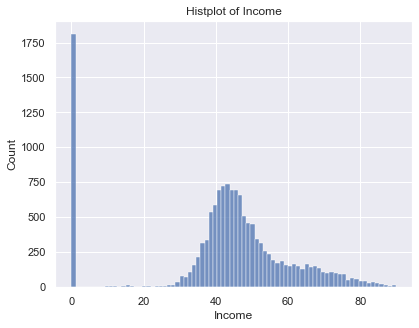

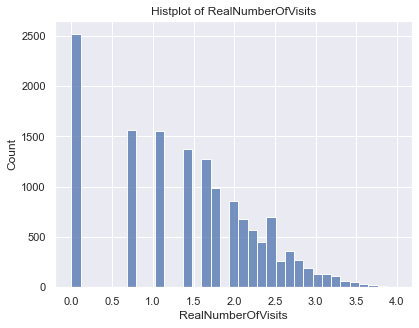

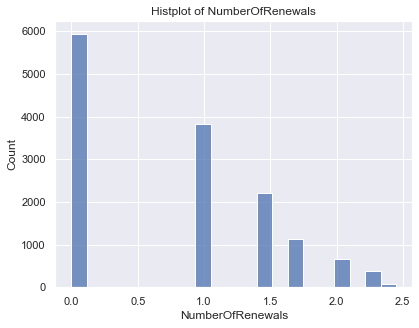

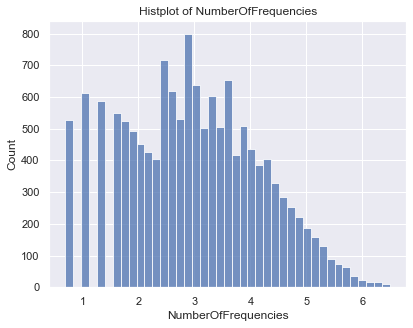

...

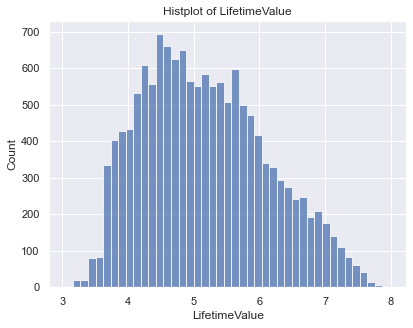

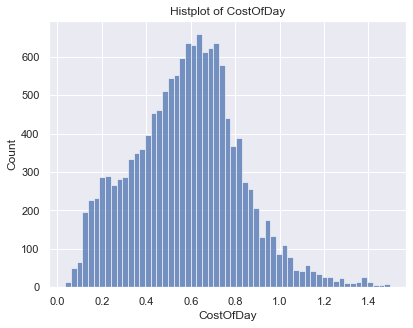

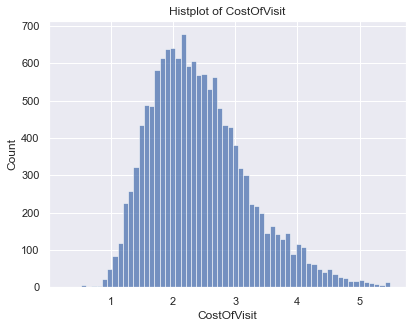

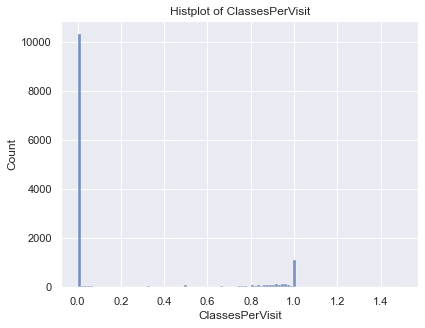

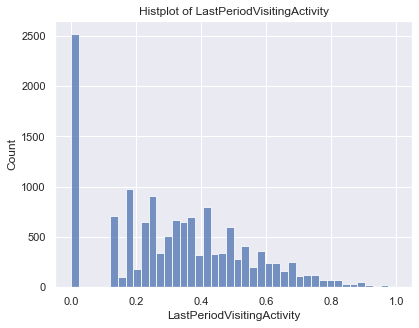

In [436]:
for i in (df_clustering.columns):
    sns.histplot(df_clustering, x = i)
    plt.title('Histplot of ' + str(i))
    plt.show()

### Scaling 

In [437]:
df_clustering.columns

Index(['Age', 'Income', 'RealNumberOfVisits', 'NumberOfRenewals',
       'NumberOfFrequencies', 'EnrollmentDuration', 'Recency',
       'AttendedClasses', 'LifetimeValue', 'CostOfDay', 'CostOfVisit',
       'ClassesPerVisit', 'LastPeriodVisitingActivity'],
      dtype='object')

In [438]:
scaler_final = MinMaxScaler()
df_clustering = pd.DataFrame(scaler_final.fit_transform(df_clustering), columns = df_clustering.columns, index = df_clustering.index)

## Clusterisation

#### Functions

In [81]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [82]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.tight_layout()
    plt.show()

In [83]:
def spider_results(df_r, clusters_t, columns):
    
    angles = np.linspace(0, 2 * np.pi, len(columns), endpoint=False).tolist()
    angles.append(angles[0])
    for i in clusters_t:
        clusters = df_r[i].unique()
        plt.figure(figsize=(12,12))
        for clus in clusters:
            #if(clus!=-1):
            df_v = df_r.loc[df_r[i]==clus]
            df_mean = list(df_v[columns].mean().values)
            df_mean.append(df_mean[0])
            plt.polar(angles, df_mean, marker='o', linestyle='-', linewidth=2, label = str(clus))
        mesaje = 'Spider Plot for Mean Values of each cluster for: ' + i
        plt.xticks(angles[:-1], columns)
        plt.legend(loc='upper right')
        plt.title(mesaje)
        plt.show()

In [84]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss

In [85]:
def get_scores_best(X, combinations, option):
    scores = []
    labels_score = []
    bould = [] 
    silh = []
    var_rat = []
    comb = []

    if option == 'DBSCAN':
        for i,(epsilon, min_sample) in enumerate(combinations):

            model = DBSCAN(eps=epsilon, min_samples=int(min_sample)).fit(X)
            labels = model.labels_
            labels_set = set(labels)
            num_clusters = len(labels_set)
            if -1 in labels_set:
                num_clusters -=1
            #Check how many outliers
            if (num_clusters<2) or (num_clusters>50):
                scores.append(-100)
                labels_score.append('Does not work')
                print('Combination: min sample', min_sample, 'epsilon: ', epsilon, 'score: ', -100, 'Does not work')
            else:
                s = silhouette_score(X, labels)
                v = calinski_harabasz_score(X, labels)
                b = davies_bouldin_score(X, labels)
                comb.append([epsilon, min_sample])
                silh.append(s)
                var_rat.append(v)
                bould.append(b)
                scores.append(s)
                labels_score.append(labels)
                print('Combination: min sample', min_sample, 'epsilon: ', epsilon, 'score: ', s, 'clusters: ', num_clusters)
    if(option == 'average_score'):
        labels = combinations
        s = silhouette_score(X, labels)
        return s
    if option == 'OPTICS':
        for i in combinations:
            model = OPTICS(min_samples=i).fit(X)
            labels = model.labels_
            labels_set = set(labels)
            num_clusters = len(labels_set)
            if (num_clusters<2) or (num_clusters>50):
                scores.append(-100)
                labels_score.append('Does not work')
                print('Min samples', i, 'score: ', -100, 'Does not work')
            else:
                s = silhouette_score(X, labels)
                v = calinski_harabasz_score(X, labels)
                b = davies_bouldin_score(X, labels)
                comb.append(i)
                silh.append(s)
                var_rat.append(v)
                bould.append(b)
                scores.append(s)
                labels_score.append(labels)
                print('Min samples', i, 'score: ', s, 'clusters: ', num_clusters)
    if option == 'SOM':
        sm = sompy.SOMFactory().build(
        X.values, 
        mapsize=[50, 50],  # NEEDS TO BE A LIST
        initialization='random', 
        neighborhood='gaussian',
        training='batch',
        lattice='hexa',
        component_names=X.columns)
        
        sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

        u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

        UMAT = u.show(
            sm, 
            distance=2,
            row_normalized=False,
            show_data=True, 
            contour=True, # Visualize isomorphic curves
            # blob=True
        )
        for j in combinations:
            map_clusters = sm.cluster(j)
            labels = []
            for i in sm.find_bmu(X)[0]:
                labels.append(map_clusters[int(i)])
            s = silhouette_score(X, labels)
            scores.append(s)
            labels_score.append(labels)
            print('Number of clusters: ', j, 'score: ', s)
            
    if option == 'BIRCH':
        for i in combinations:
            b_f = i[0]
            n_c = i[1]
            model = Birch(branching_factor = b_f, n_clusters=n_c).fit(X)
            labels = model.labels_
            labels_set = set(labels)
            num_clusters = len(labels_set)
            if (num_clusters<2) or (num_clusters>50):
                scores.append(-100)
                labels_score.append('Does not work')
                print('Combination: min sample', b_f, 'epsilon: ', n_c, 'score: ', -100, 'Does not work')
            else:
                s = silhouette_score(X, labels)
                v = calinski_harabasz_score(X, labels)
                b = davies_bouldin_score(X, labels)
                comb.append(i)
                silh.append(s)
                var_rat.append(v)
                bould.append(b)
                scores.append(s)
                labels_score.append(labels)
                print('Combination: branching_factor', b_f, 'n_clusters: ',n_c, 'score: ', s, 'clusters: ', num_clusters)
    if option == 'MeanS':
        bandwidth = []
        for i in quantile:
            bandwidth.append(estimate_bandwidth(df_clustering, quantile=i, random_state=1, n_jobs=-1))
        for i in bandwidth:
            model = MeanShift(bandwidth=i, bin_seeding=True, n_jobs=4)
            labels = model.fit_predict(df_clustering)
            labels_set = set(labels)
            num_clusters = len(labels_set)
            if (num_clusters<2) or (num_clusters>50):
                scores.append(-100)
                labels_score.append('Does not work')
                print('Combination: bandwidth', i,'score: ', -100, 'Does not work')
            else:
                s = silhouette_score(X, labels)
                v = calinski_harabasz_score(X, labels)
                b = davies_bouldin_score(X, labels)
                comb.append(i)
                silh.append(s)
                var_rat.append(v)
                bould.append(b)
                scores.append(s)
                labels_score.append(labels)
                print('Combination: bandwidth', i, 'score: ', s, 'clusters: ', num_clusters)
                
    best_index = np.argmax(scores)
    return scores[best_index], labels_score[best_index], combinations[best_index], [silh, var_rat, bould], comb


#### K-means

100%|███████████████████████████████████████████| 13/13 [00:18<00:00,  1.39s/it]


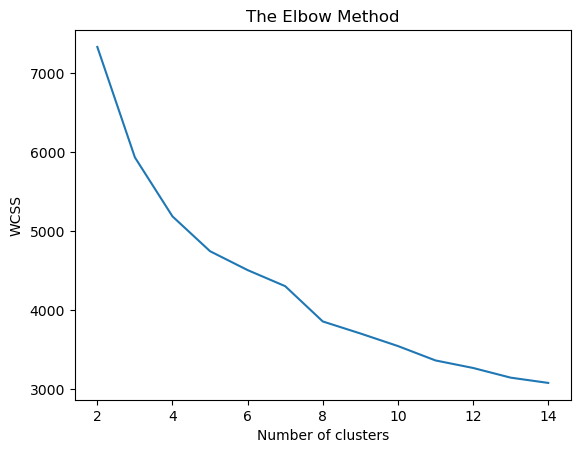

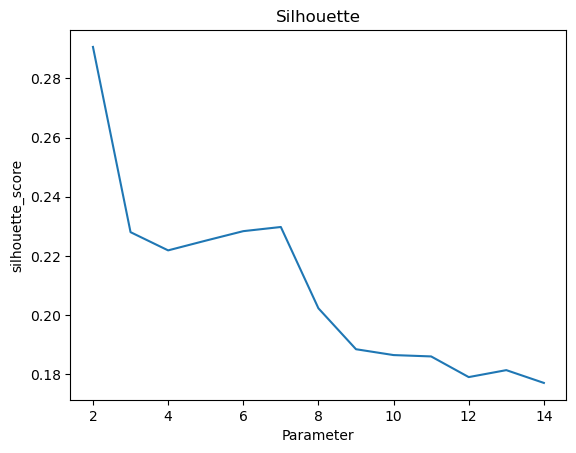

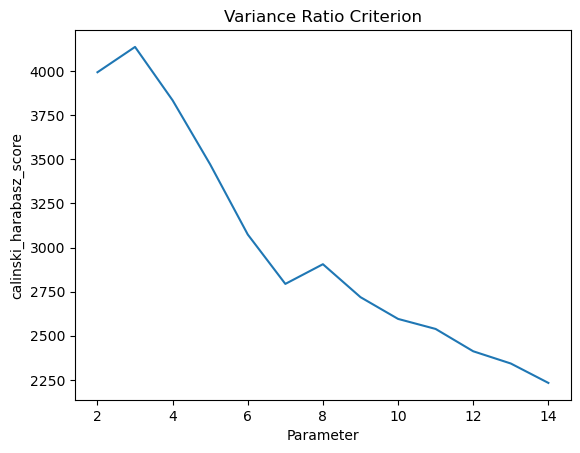

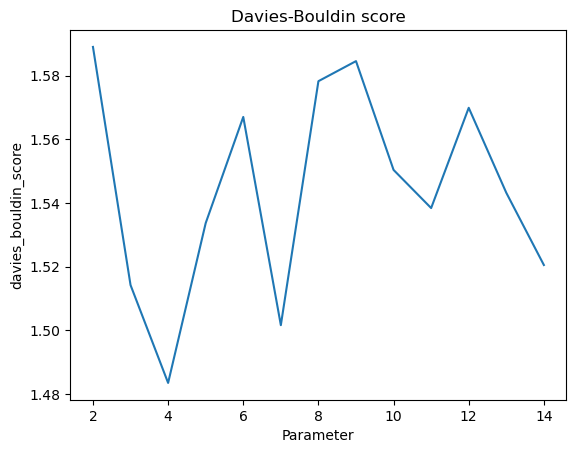

In [86]:
wcss = []
bould = [] 
silh = []
var_rat = []

for i in tqdm(range(2, 15)):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42, n_init = 'auto')
    kmeans.fit(df_clustering)
    kmeans_labels = kmeans.fit_predict(df_clustering) 
    wcss.append(kmeans.inertia_) # atribute of kmeans that gives as the wcss of each n_clusters
    silh.append(silhouette_score(df_clustering, kmeans_labels))
    var_rat.append(calinski_harabasz_score(df_clustering, kmeans_labels))
    bould.append(davies_bouldin_score(df_clustering, kmeans_labels))
plt.plot(range(2, 15), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()
plt.plot(range(2, 15), silh)
plt.title('Silhouette')
plt.xlabel('Parameter')
plt.ylabel('silhouette_score')
plt.show()
plt.plot(range(2, 15), var_rat)
plt.title('Variance Ratio Criterion')
plt.xlabel('Parameter')
plt.ylabel('calinski_harabasz_score')
plt.show()
plt.plot(range(2, 15), bould)
plt.title('Davies-Bouldin score')
plt.xlabel('Parameter')
plt.ylabel('davies_bouldin_score')
plt.show()

In [87]:
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42, n_init = 'auto')
y_kmeans_labels = kmeans.fit_predict(df_clustering) 
silhouette_score(df_clustering, y_kmeans_labels)

0.22512616767587343

In [88]:
df_clustering['Clusters_MeanS']= y_kmeans_labels
sst = get_ss(df_clustering)  # get total sum of squares
ssw_labels = df_clustering.groupby(by='Clusters_MeanS').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)
df_clustering = df_clustering.drop('Clusters_MeanS', axis=1)

Cluster solution with R^2 of 0.8539


#### OPTICS

In [89]:
a,b,c,d, e = get_scores_best(df_clustering, np.arange(20,30,1), 'OPTICS')

Min samples 20 score:  -0.07689797707758252 clusters:  4
Min samples 21 score:  -0.07682628166699204 clusters:  4
Min samples 22 score:  -0.1292219112269982 clusters:  4
Min samples 23 score:  0.006134686913423962 clusters:  2
Min samples 24 score:  -0.04209271793999818 clusters:  3
Min samples 25 score:  -0.23328129006545786 clusters:  3
Min samples 26 score:  0.1663338079331964 clusters:  2
Min samples 27 score:  0.008427783344626611 clusters:  2
Min samples 28 score:  0.00888201592598343 clusters:  2
Min samples 29 score:  -100 Does not work


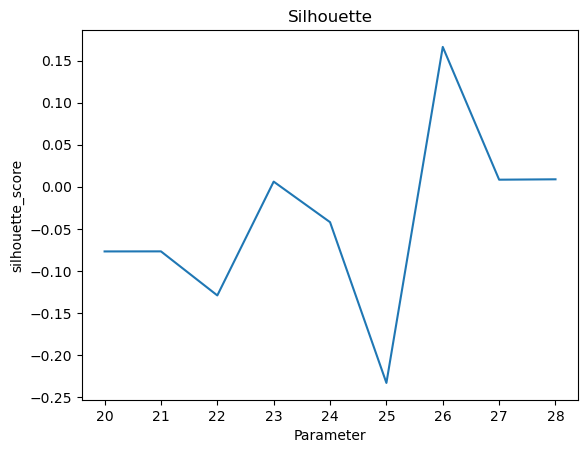

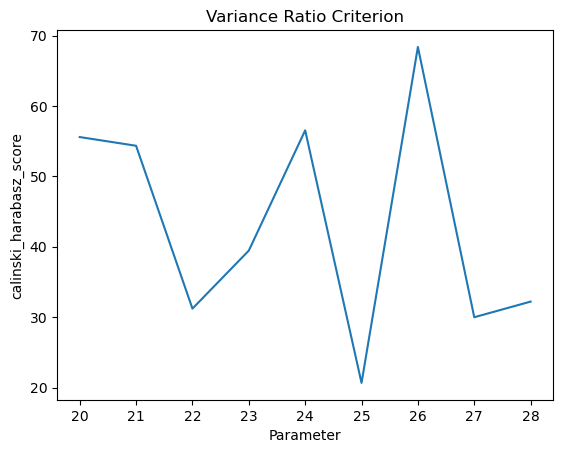

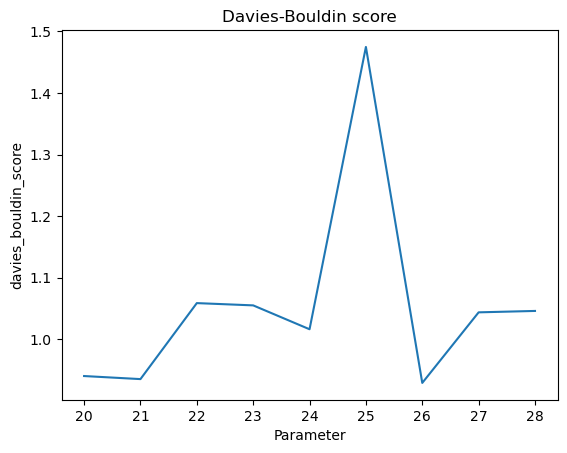

In [90]:
plt.plot(e, d[0])
plt.title('Silhouette')
plt.xlabel('Parameter')
plt.ylabel('silhouette_score')
plt.show()
plt.plot(e, d[1])
plt.title('Variance Ratio Criterion')
plt.xlabel('Parameter')
plt.ylabel('calinski_harabasz_score')
plt.show()
plt.plot(e, d[2])
plt.title('Davies-Bouldin score')
plt.xlabel('Parameter')
plt.ylabel('davies_bouldin_score')
plt.show()

In [91]:
model = OPTICS(min_samples=26).fit(df_clustering)
optics_labels = model.labels_
silhouette_score(df_clustering, optics_labels)

0.1663338079331964

#### Mean-shift

In [92]:
bandwidth = []
quantile = [0.05,0.06,0.07,0.08,0.09,0.1,0.2,0.3,0.4,0.5,0.6]


In [93]:
a,b,c,d, e = get_scores_best(df_clustering,quantile, 'MeanS')


Combination: bandwidth 0.5828778441351705 score:  0.2169254234552718 clusters:  6
Combination: bandwidth 0.6098563320036078 score:  0.20041843715067517 clusters:  7
Combination: bandwidth 0.6338731093449002 score:  0.18231166977756189 clusters:  5
Combination: bandwidth 0.6556355427982944 score:  0.20283574746624525 clusters:  4
Combination: bandwidth 0.675541113092521 score:  0.20386397426753064 clusters:  4
Combination: bandwidth 0.6939550401011249 score:  0.23260486189645235 clusters:  3
Combination: bandwidth 0.8311614908427726 score:  0.2930890675100517 clusters:  2
Combination: bandwidth 0.9298904381146186 score:  -100 Does not work
Combination: bandwidth 1.0139778901661058 score:  -100 Does not work
Combination: bandwidth 1.0911640329079497 score:  -100 Does not work
Combination: bandwidth 1.1685847206221072 score:  -100 Does not work


In [94]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
for i in quantile:
    bandwidth.append(estimate_bandwidth(df_clustering, quantile=i, random_state=1, n_jobs=-1))
labels = []
num_clusters = []
n_job = [4]
for i in bandwidth:
    for j in n_job:
        ms = MeanShift(bandwidth=i, bin_seeding=True, n_jobs=j)
        ms_labels = ms.fit_predict(df_clustering)
        ms_n_clusters = len(np.unique(ms_labels))
        print("n_job of:",j," Bandwidth of:", i, "Number of estimated clusters : %d" % ms_n_clusters, )
        labels.append(ms_labels)
        num_clusters.append(ms_n_clusters)
r2_results = []
for ms_labels in labels:
    df_clustering['Clusters_MeanS']= ms_labels
    sst = get_ss(df_clustering)  # get total sum of squares
    ssw_labels = df_clustering.groupby(by='Clusters_MeanS').apply(get_ss)  # compute ssw for each cluster labels
    ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
    r2 = ssb / sst
    print("Cluster solution with R^2 of %0.4f" % r2)
    r2_results.append(r2)
    

n_job of: 4  Bandwidth of: 0.5828778441351705 Number of estimated clusters : 6
n_job of: 4  Bandwidth of: 0.6098563320036078 Number of estimated clusters : 7
n_job of: 4  Bandwidth of: 0.6338731093449002 Number of estimated clusters : 5
n_job of: 4  Bandwidth of: 0.6556355427982944 Number of estimated clusters : 4
n_job of: 4  Bandwidth of: 0.675541113092521 Number of estimated clusters : 4
n_job of: 4  Bandwidth of: 0.6939550401011249 Number of estimated clusters : 3
n_job of: 4  Bandwidth of: 0.8311614908427726 Number of estimated clusters : 2
n_job of: 4  Bandwidth of: 0.9298904381146186 Number of estimated clusters : 1
n_job of: 4  Bandwidth of: 1.0139778901661058 Number of estimated clusters : 1
n_job of: 4  Bandwidth of: 1.0911640329079497 Number of estimated clusters : 1
n_job of: 4  Bandwidth of: 1.1685847206221072 Number of estimated clusters : 1
Cluster solution with R^2 of 0.8799
Cluster solution with R^2 of 0.8289
Cluster solution with R^2 of 0.7803
Cluster solution with R^

[0.5828778441351705, 0.6098563320036078, 0.6338731093449002, 0.6556355427982944, 0.675541113092521, 0.6939550401011249, 0.8311614908427726]


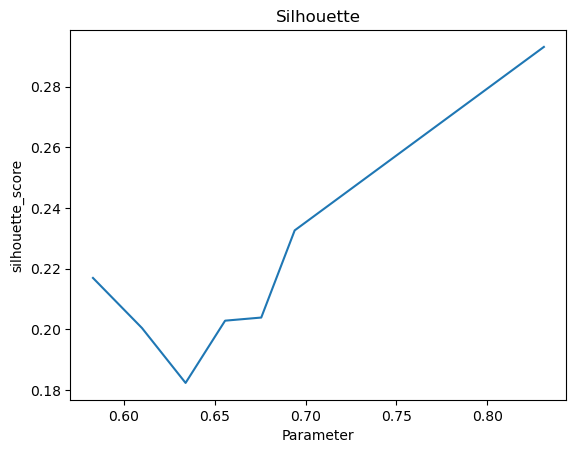

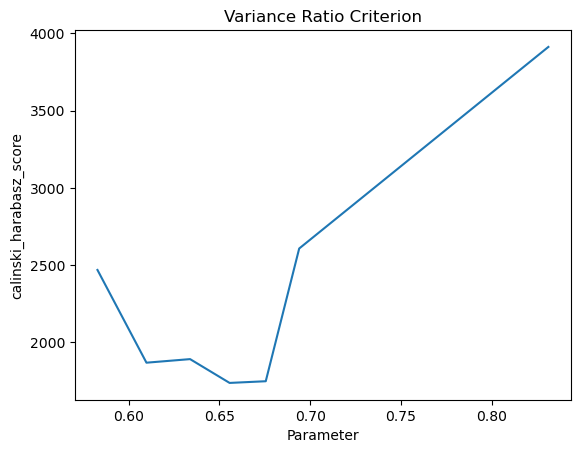

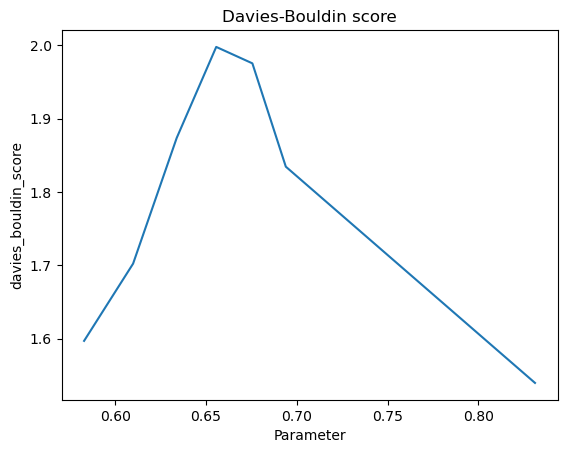

In [95]:
print(e)
plt.plot(e, d[0])
plt.title('Silhouette')
plt.xlabel('Parameter')
plt.ylabel('silhouette_score')
plt.show()
plt.plot(e, d[1])
plt.title('Variance Ratio Criterion')
plt.xlabel('Parameter')
plt.ylabel('calinski_harabasz_score')
plt.show()
plt.plot(e, d[2])
plt.title('Davies-Bouldin score')
plt.xlabel('Parameter')
plt.ylabel('davies_bouldin_score')
plt.show()



In [258]:
ms = MeanShift(bandwidth=0.8311614908427726, bin_seeding=True, n_jobs=j)
ms_labels = ms.fit_predict(df_clustering)
df_clustering['Clusters_MeanS']= ms_labels

In [259]:
sst = get_ss(df_clustering)  # get total sum of squares
ssw_labels = df_clustering.groupby(by='Clusters_MeanS').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3717


In [260]:
df_clustering = df_clustering.drop('Clusters_MeanS', axis=1)

#### DBSCAN

In [99]:
dbscan = DBSCAN(eps=0.4, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_clustering)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 4


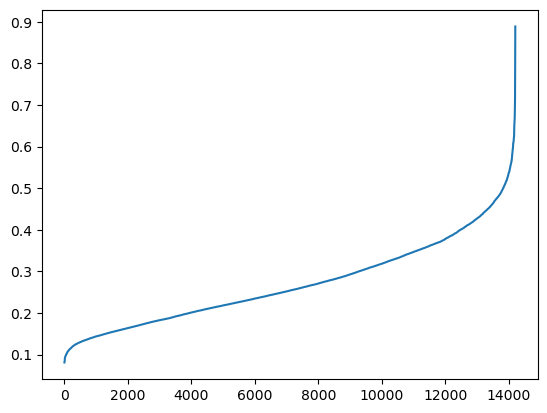

In [100]:
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df_clustering)
distances, _ = neigh.kneighbors(df_clustering)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [101]:
epsilons = np.linspace(0.35, 0.5, num= 6)
min_samples = np.arange(2,25,2)
print(epsilons)

[0.35 0.38 0.41 0.44 0.47 0.5 ]


In [102]:
combinations = list(itertools.product(epsilons, min_samples))

In [103]:
sc, lb, comb, d, e = get_scores_best(df_clustering,combinations,'DBSCAN')

Combination: min sample 2 epsilon:  0.35 score:  -0.22780171913723274 clusters:  39
Combination: min sample 4 epsilon:  0.35 score:  0.11713652944932317 clusters:  3
Combination: min sample 6 epsilon:  0.35 score:  0.1059979174489965 clusters:  3
Combination: min sample 8 epsilon:  0.35 score:  0.15563293317309945 clusters:  2
Combination: min sample 10 epsilon:  0.35 score:  0.07782702404029748 clusters:  3
Combination: min sample 12 epsilon:  0.35 score:  0.06671924923513006 clusters:  3
Combination: min sample 14 epsilon:  0.35 score:  0.12677085037522487 clusters:  4
Combination: min sample 16 epsilon:  0.35 score:  0.1971143189540978 clusters:  4
Combination: min sample 18 epsilon:  0.35 score:  0.19591139723852968 clusters:  4
Combination: min sample 20 epsilon:  0.35 score:  0.1558008152442203 clusters:  5
Combination: min sample 22 epsilon:  0.35 score:  0.19212034396747663 clusters:  4
Combination: min sample 24 epsilon:  0.35 score:  0.18992058260946834 clusters:  4
Combinati

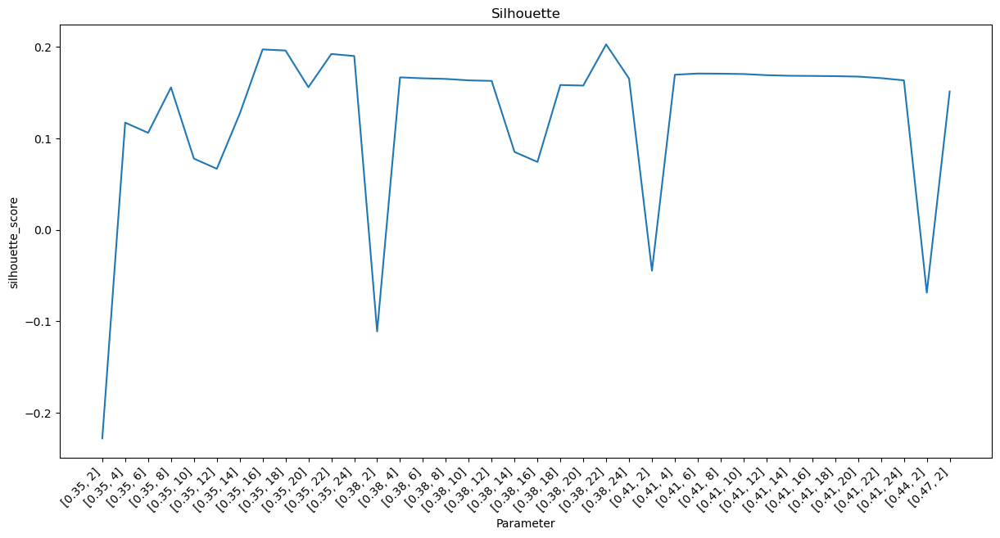

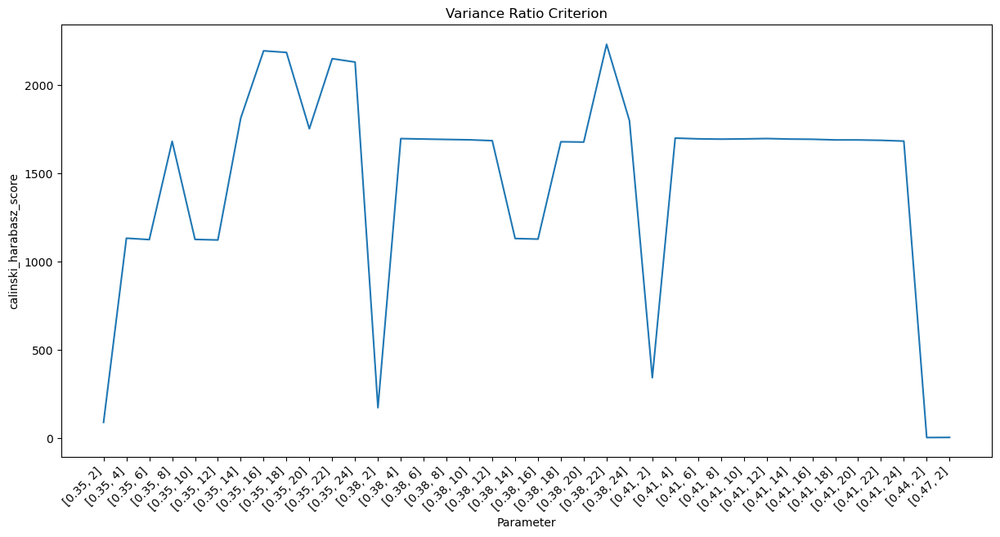

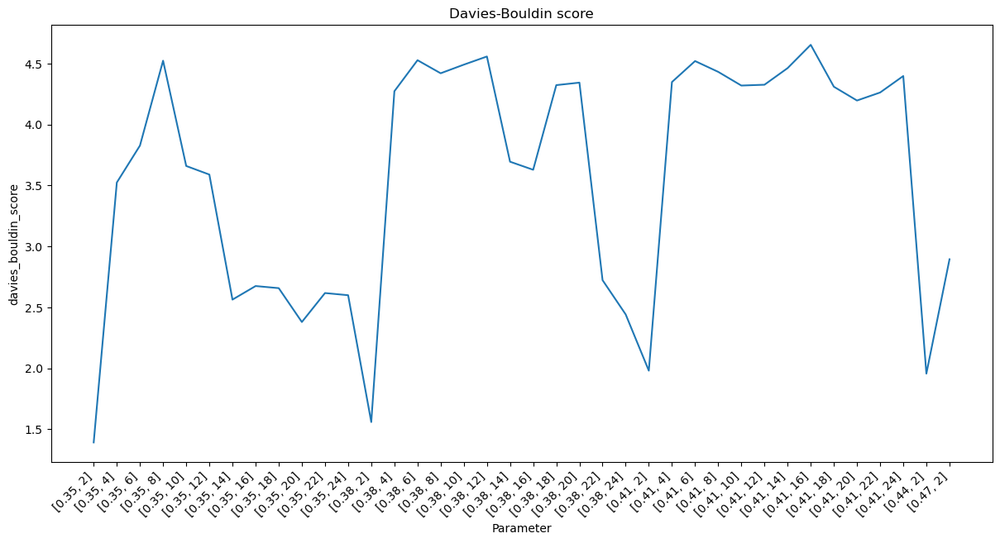

In [104]:
plt.figure(figsize=(12,6))
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.plot([str(param) for param in e], d[0])
plt.title('Silhouette')
plt.xlabel('Parameter')
plt.ylabel('silhouette_score')
plt.show()
plt.figure(figsize=(12,6))
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.plot([str(param) for param in e], d[1])
plt.title('Variance Ratio Criterion')
plt.xlabel('Parameter')
plt.ylabel('calinski_harabasz_score')
plt.show()
plt.figure(figsize=(12,6))
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.plot([str(param) for param in e], d[2])
plt.title('Davies-Bouldin score')
plt.xlabel('Parameter')
plt.ylabel('davies_bouldin_score')
plt.show()

In [105]:
model = DBSCAN(eps=0.38, min_samples=22).fit(df_clustering)
dbscan_labels = model.labels_
silhouette_score(df_clustering, dbscan_labels)

0.202609838376407

#### GMM

In [106]:
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_clustering)
labels_proba = gmm.predict_proba(df_clustering)

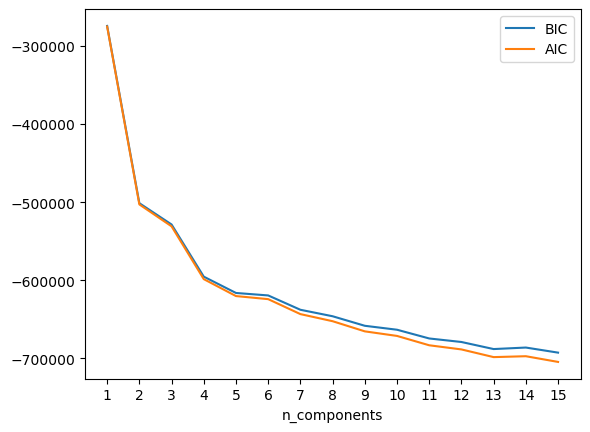

In [107]:
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_clustering)
          for n in n_components]

bic_values = [m.bic(df_clustering) for m in models]
aic_values = [m.aic(df_clustering) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

100%|███████████████████████████████████████████| 13/13 [02:24<00:00, 11.10s/it]


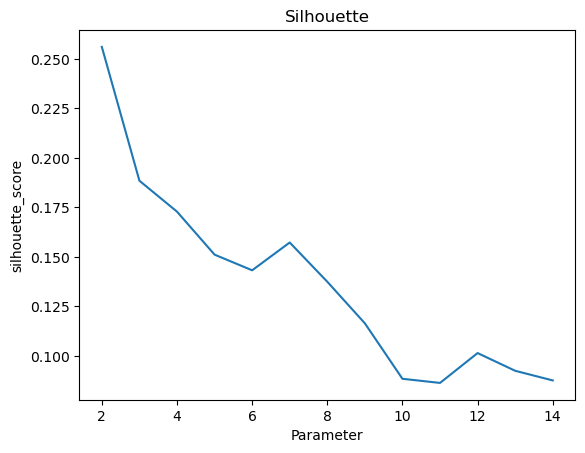

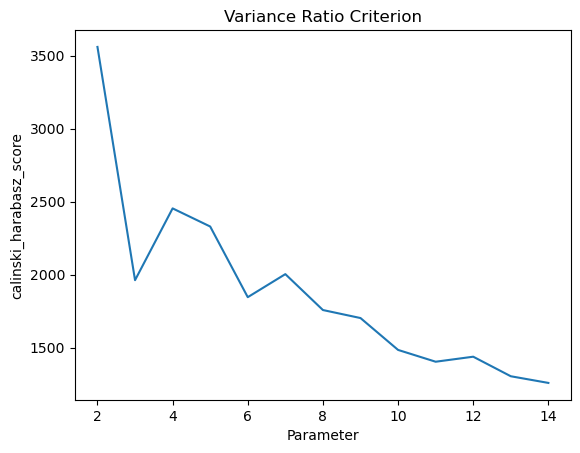

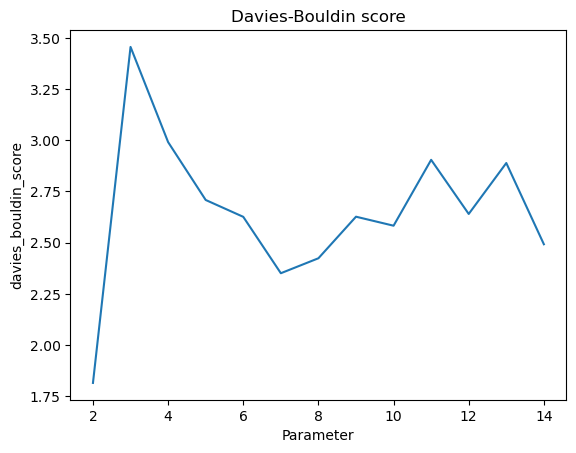

In [108]:
bould = [] 
silh = []
var_rat = []

for i in tqdm(range(2, 15)):
    gmm = GaussianMixture(n_components=i, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
    gmm_labels = gmm.fit_predict(df_clustering)
    labels_proba = gmm.predict_proba(df_clustering)
    silh.append(silhouette_score(df_clustering, gmm_labels))
    var_rat.append(calinski_harabasz_score(df_clustering, gmm_labels))
    bould.append(davies_bouldin_score(df_clustering, gmm_labels))

plt.plot(range(2, 15), silh)
plt.title('Silhouette')
plt.xlabel('Parameter')
plt.ylabel('silhouette_score')
plt.show()
plt.plot(range(2, 15), var_rat)
plt.title('Variance Ratio Criterion')
plt.xlabel('Parameter')
plt.ylabel('calinski_harabasz_score')
plt.show()
plt.plot(range(2, 15), bould)
plt.title('Davies-Bouldin score')
plt.xlabel('Parameter')
plt.ylabel('davies_bouldin_score')
plt.show()

4 or 7 is okay, but 7 is too much

In [109]:
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_clustering)
silhouette_score(df_clustering, gmm_labels)

0.17283700194240703

#### BIRCH

In [110]:
branch =[2,5,50,100,150,200]
n_clust = [2,3,4,5,6,None]
combinations = list(itertools.product(branch, n_clust))


In [111]:
sc, lb, comb, d, e = get_scores_best(df_clustering,combinations,'BIRCH')

Combination: branching_factor 2 n_clusters:  2 score:  0.28712129810897297 clusters:  2
Combination: branching_factor 2 n_clusters:  3 score:  0.21851398757497958 clusters:  3
Combination: branching_factor 2 n_clusters:  4 score:  0.19135370665325754 clusters:  4
Combination: branching_factor 2 n_clusters:  5 score:  0.20669876451475433 clusters:  5
Combination: branching_factor 2 n_clusters:  6 score:  0.2022398032295793 clusters:  6
Combination: min sample 2 epsilon:  None score:  -100 Does not work
Combination: branching_factor 5 n_clusters:  2 score:  0.27832039335493797 clusters:  2
Combination: branching_factor 5 n_clusters:  3 score:  0.22529236950648526 clusters:  3
Combination: branching_factor 5 n_clusters:  4 score:  0.19289171315672704 clusters:  4
Combination: branching_factor 5 n_clusters:  5 score:  0.16481431703934943 clusters:  5
Combination: branching_factor 5 n_clusters:  6 score:  0.16029444336700563 clusters:  6
Combination: min sample 5 epsilon:  None score:  -100

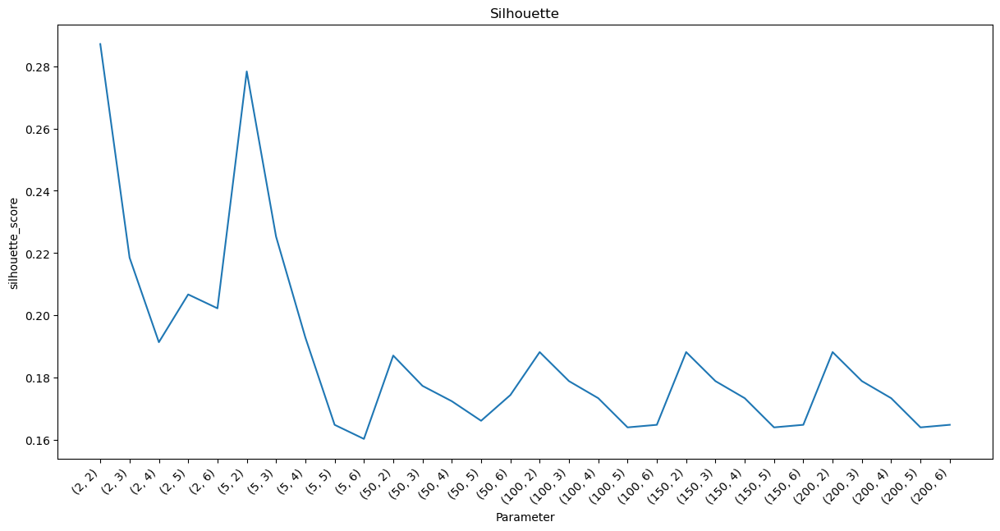

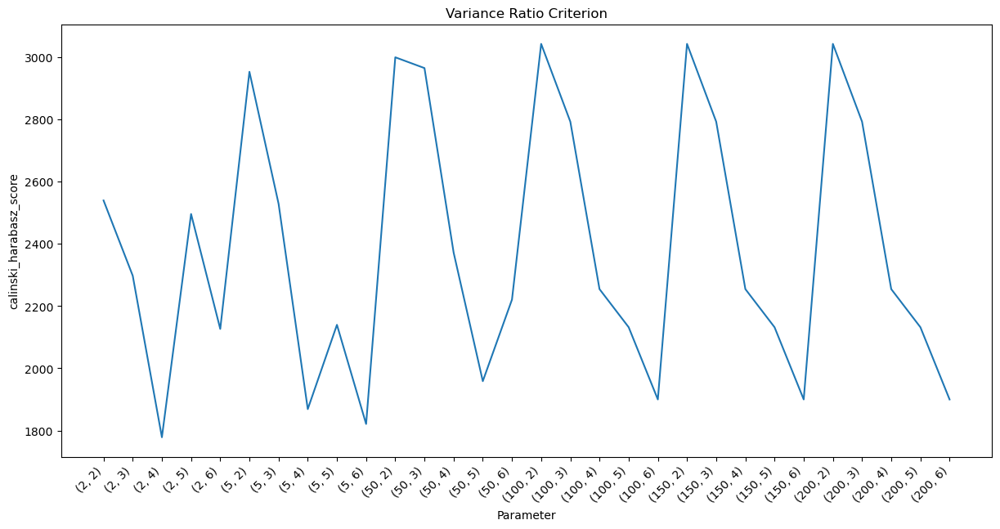

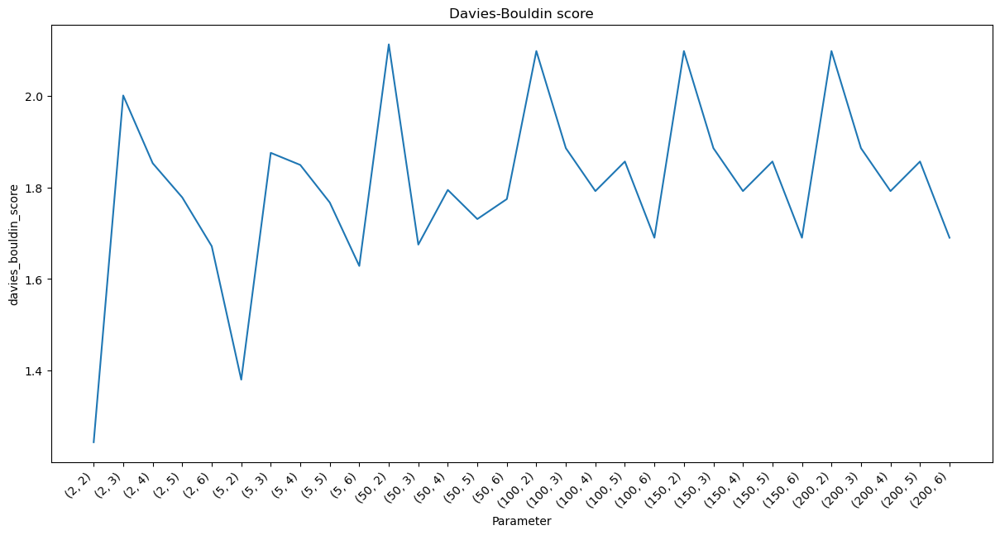

In [112]:
plt.figure(figsize=(12,6))
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.plot([str(param) for param in e], d[0])
plt.title('Silhouette')
plt.xlabel('Parameter')
plt.ylabel('silhouette_score')
plt.show()
plt.figure(figsize=(12,6))
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.plot([str(param) for param in e], d[1])
plt.title('Variance Ratio Criterion')
plt.xlabel('Parameter')
plt.ylabel('calinski_harabasz_score')
plt.show()
plt.figure(figsize=(12,6))
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.plot([str(param) for param in e], d[2])
plt.title('Davies-Bouldin score')
plt.xlabel('Parameter')
plt.ylabel('davies_bouldin_score')
plt.show()

In [113]:
model = Birch(branching_factor = 5, n_clusters=2).fit(df_clustering)
birch_labels = model.labels_

#### SOM

In [114]:
np.random.seed(42)

sm = sompy.SOMFactory().build(
    df_clustering.values, 
    mapsize=[20, 20],  # NEEDS TO BE A LIST
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=df_clustering.columns
)
sm.train(n_job=4, verbose='info', train_rough_len=200, train_finetune_len=200)

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 200

 epoch: 1 ---> elapsed time:  0.292000, quantization error: 3.457213

 epoch: 2 ---> elapsed time:  0.294000, quantization error: 3.424042

 epoch: 3 ---> elapsed time:  0.276000, quantization error: 3.377147

 epoch: 4 ---> elapsed time:  0.292000, quantization error: 3.348971

 epoch: 5 ---> elapsed time:  0.260000, quantization error: 3.338207

 epoch: 6 ---> elapsed time:  0.270000, quantization error: 3.331166

 epoch: 7 ---> elapsed time:  0.241000, quantization error: 3.325870

 epoch: 8 ---> elapsed time:  0.366000, quantization error: 3.320953

 epoch: 9 ---> elapsed time:  0.270000, quantization error: 3.315378

 epoch: 10 ---> elapsed time:  0.263000, quantization error: 3.309945

 epoch: 11 ---> elapsed time:  0.384000, quantization error: 3.305854

 epoch: 12 ---> elapsed time:  0.328000, quantization error: 3.303871

 epoch: 13 ---> 

 epoch: 29 ---> elapsed time:  0.145000, quantization error: 2.066570

 epoch: 30 ---> elapsed time:  0.132000, quantization error: 2.064220

 epoch: 31 ---> elapsed time:  0.113000, quantization error: 2.061937

 epoch: 32 ---> elapsed time:  0.106000, quantization error: 2.059675

 epoch: 33 ---> elapsed time:  0.103000, quantization error: 2.057346

 epoch: 34 ---> elapsed time:  0.110000, quantization error: 2.055013

 epoch: 35 ---> elapsed time:  0.113000, quantization error: 2.052708

 epoch: 36 ---> elapsed time:  0.102000, quantization error: 2.050414

 epoch: 37 ---> elapsed time:  0.101000, quantization error: 2.048089

 epoch: 38 ---> elapsed time:  0.120000, quantization error: 2.045810

 epoch: 39 ---> elapsed time:  0.116000, quantization error: 2.043473

 epoch: 40 ---> elapsed time:  0.124000, quantization error: 2.041143

 epoch: 41 ---> elapsed time:  0.116000, quantization error: 2.038742

 epoch: 42 ---> elapsed time:  0.110000, quantization error: 2.036404

 epoch

 epoch: 144 ---> elapsed time:  0.159000, quantization error: 1.770933

 epoch: 145 ---> elapsed time:  0.129000, quantization error: 1.768041

 epoch: 146 ---> elapsed time:  0.133000, quantization error: 1.764876

 epoch: 147 ---> elapsed time:  0.113000, quantization error: 1.761549

 epoch: 148 ---> elapsed time:  0.109000, quantization error: 1.758437

 epoch: 149 ---> elapsed time:  0.122000, quantization error: 1.755395

 epoch: 150 ---> elapsed time:  0.150000, quantization error: 1.752509

 epoch: 151 ---> elapsed time:  0.132000, quantization error: 1.749715

 epoch: 152 ---> elapsed time:  0.131000, quantization error: 1.746924

 epoch: 153 ---> elapsed time:  0.130000, quantization error: 1.744077

 epoch: 154 ---> elapsed time:  0.125000, quantization error: 1.741355

 epoch: 155 ---> elapsed time:  0.132000, quantization error: 1.738567

 epoch: 156 ---> elapsed time:  0.123000, quantization error: 1.735804

 epoch: 157 ---> elapsed time:  0.131000, quantization error: 1.

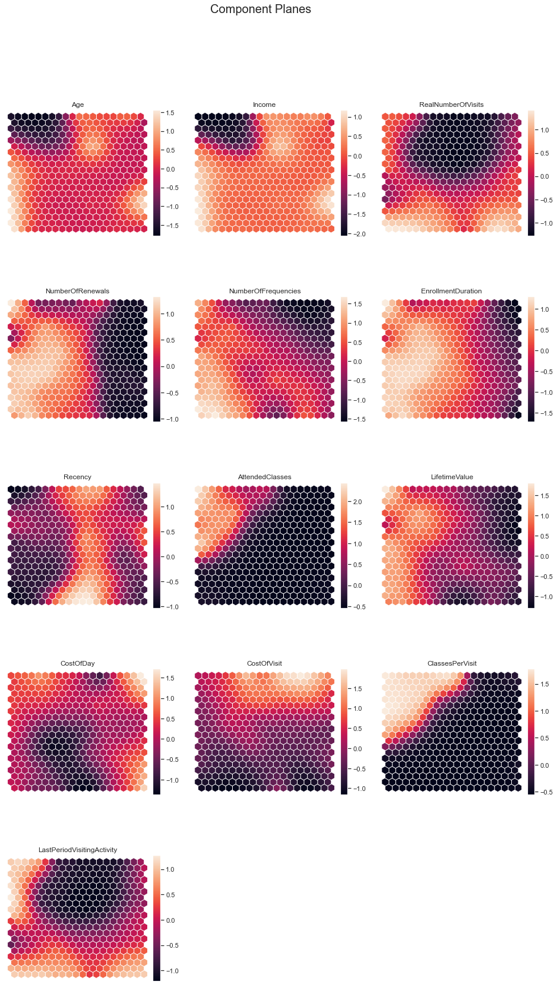

In [115]:

plt.rcParams['figure.dpi'] = 72


# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sompy/visualization/umatrix.py:60: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X, Y, s=2, alpha=1., c='Gray',


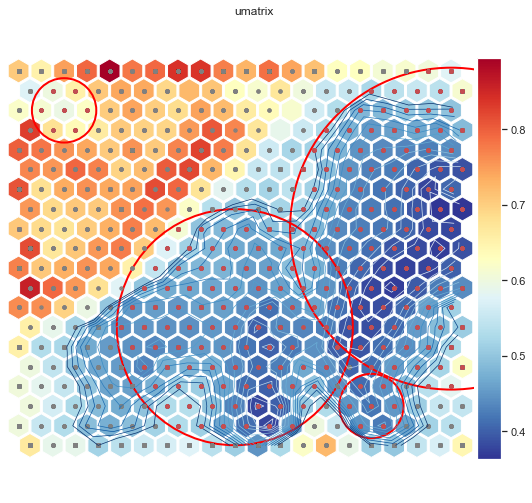

array([[0.70572432, 0.65085075, 0.74584234, 0.79448724, 0.8948288 ,
        0.77876954, 0.79207459, 0.83941508, 0.83721409, 0.77346891,
        0.72811791, 0.78489453, 0.74189356, 0.71439689, 0.62908446,
        0.62879306, 0.60993625, 0.61512964, 0.60416838, 0.57820976],
       [0.57327284, 0.59915675, 0.65290628, 0.70634323, 0.73929265,
        0.73789707, 0.69051682, 0.7236717 , 0.71203647, 0.62750372,
        0.61577183, 0.66927002, 0.601792  , 0.55096774, 0.55158226,
        0.52209632, 0.53948953, 0.55132004, 0.53882009, 0.61418771],
       [0.61991879, 0.61083382, 0.59395807, 0.62380121, 0.70206677,
        0.74271115, 0.70132831, 0.68471556, 0.74512809, 0.72109156,
        0.66137074, 0.63736478, 0.61580753, 0.56187512, 0.53052543,
        0.48187293, 0.48506403, 0.50163061, 0.50216001, 0.4967017 ],
       [0.82848294, 0.67759604, 0.63799098, 0.66445911, 0.70466839,
        0.69738464, 0.69183327, 0.74963753, 0.80581715, 0.76624896,
        0.66901431, 0.58786402, 0.55553137, 0

In [116]:
u = sompy.umatrix.UMatrixView(8, 8, 'umatrix', show_axis=True, text_size=10, show_text=True)

UMAT = u.show(
    sm, 
    distance=2,
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

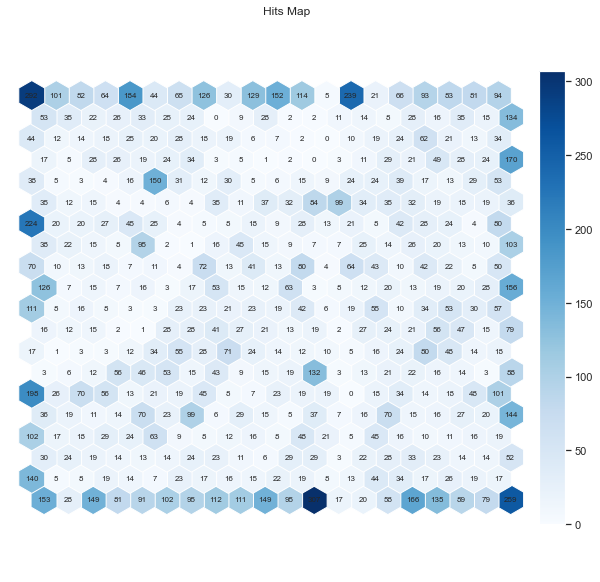

In [117]:
vhts  = BmuHitsView(10,10,"Hits Map")
vhts.show(sm,
          anotate=True, onlyzeros=False, labelsize=8, cmap="Blues"
         )
# plt.show()

In [118]:
hierclust = AgglomerativeClustering(n_clusters=3, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels

100%|█████████████████████████████████████████████| 9/9 [00:15<00:00,  1.73s/it]


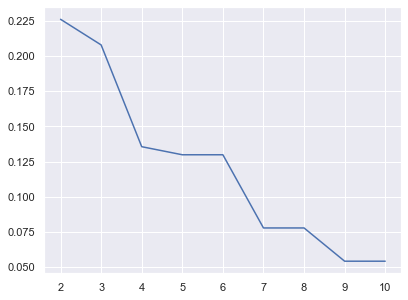

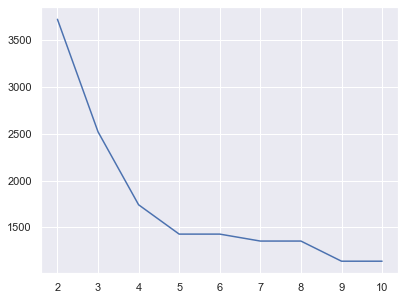

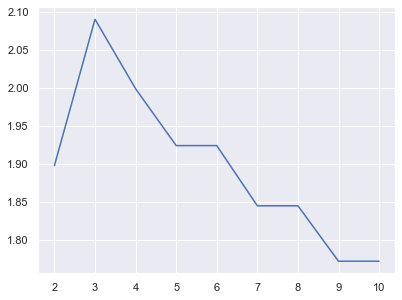

In [119]:
bould = [] 
silh = []
var_rat = []

for j in tqdm(range(2,11)):
    hierclust = AgglomerativeClustering(n_clusters=j, linkage='ward')
    nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
    sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy
    map_clusters = nodeclus_labels
    som_clusters = []
    for i in sm.find_bmu(df_clustering)[0]:
        som_clusters.append(map_clusters[int(i)])
    silh.append(silhouette_score(df_clustering, som_clusters))
    var_rat.append(calinski_harabasz_score(df_clustering, som_clusters))
    bould.append(davies_bouldin_score(df_clustering, som_clusters))
    # df_clustering['som_clusters'] = som_clusters
    # spider_results(df_clustering, ['som_clusters'], df_clustering.columns.drop('som_clusters'))
    # df_clustering.drop(columns = ['som_clusters'], inplace = True)
    
    
    
    # hits  = HitMapView(12, 12,"Clustering",text_size=10)
    # hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
    
    # plt.show()
    
plt.plot(range(2, 11), silh)
plt.show()
plt.plot(range(2, 11), var_rat)
plt.show()
plt.plot(range(2, 11), bould)
plt.show()

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  war

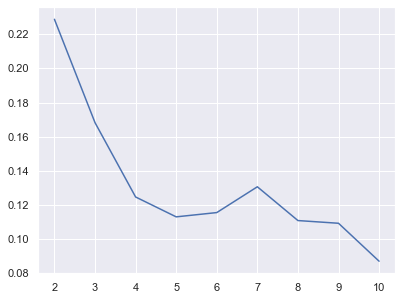

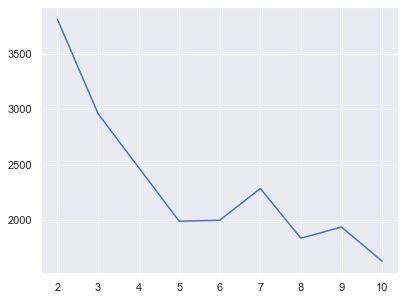

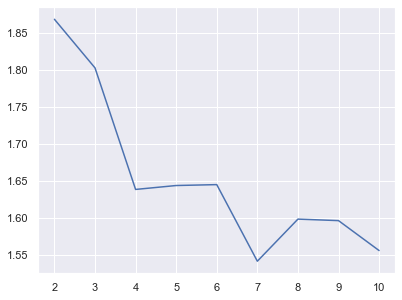

In [120]:

bould = [] 
silh = []
var_rat = []

for j in range (2,11):
    map_clusters = sm.cluster(j)
    som_clusters = []
    for i in sm.find_bmu(df_clustering)[0]:
        som_clusters.append(map_clusters[int(i)])
    silh.append(silhouette_score(df_clustering, som_clusters))
    var_rat.append(calinski_harabasz_score(df_clustering, som_clusters))
    bould.append(davies_bouldin_score(df_clustering, som_clusters))
    # df_clustering['som_clusters'] = som_clusters
    # spider_results(df_clustering, ['som_clusters'], df_clustering.columns.drop('som_clusters'))
    # df_clustering.drop(columns = ['som_clusters'], inplace = True)
    
plt.plot(range(2, 11), silh)
plt.show()
plt.plot(range(2, 11), var_rat)
plt.show()
plt.plot(range(2, 11), bould)
plt.show()

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


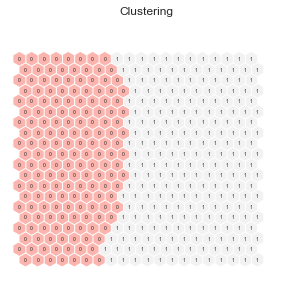

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


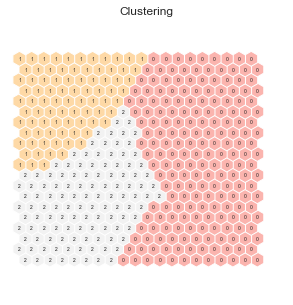

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


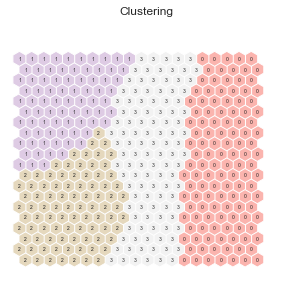

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


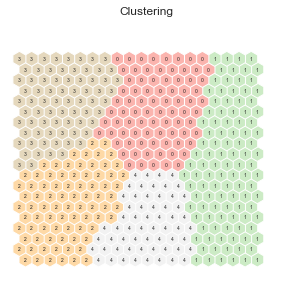

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


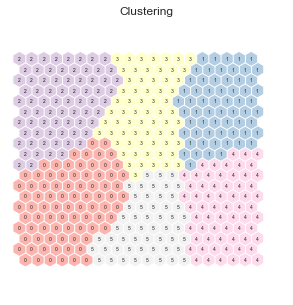

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


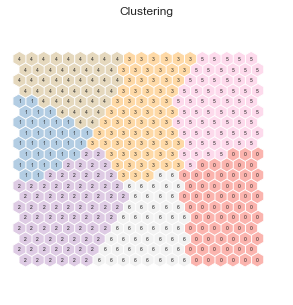

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


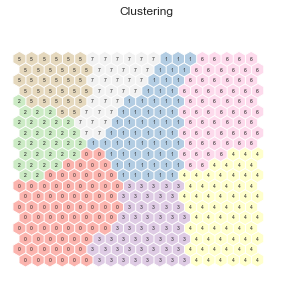

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


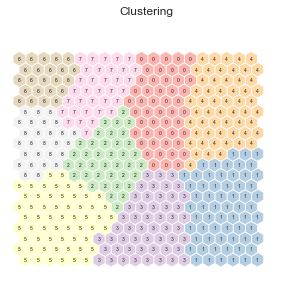

/Users/antonkutsenko/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


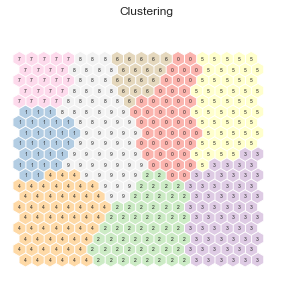

In [121]:
# Perform K-Means clustering on top of the 2500 units (sm.get_node_vectors() output)
# kmeans = KMeans(n_clusters=5, init='k-means++', n_init=20, random_state=42)
# nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
# sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy
for j in range (2,11):
    hierclust = AgglomerativeClustering(n_clusters=j, linkage='ward')
    nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
    sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy
    map_clusters = nodeclus_labels
    som_clusters = []
    for i in sm.find_bmu(df_clustering)[0]:
        som_clusters.append(map_clusters[int(i)])
    sm.cluster(j)
    hits = HitMapView(5, 5,"Clustering", text_size=10)
    hits.show(sm, anotate=True, onlyzeros=False, labelsize=5, cmap="Pastel1")
    
    plt.show()

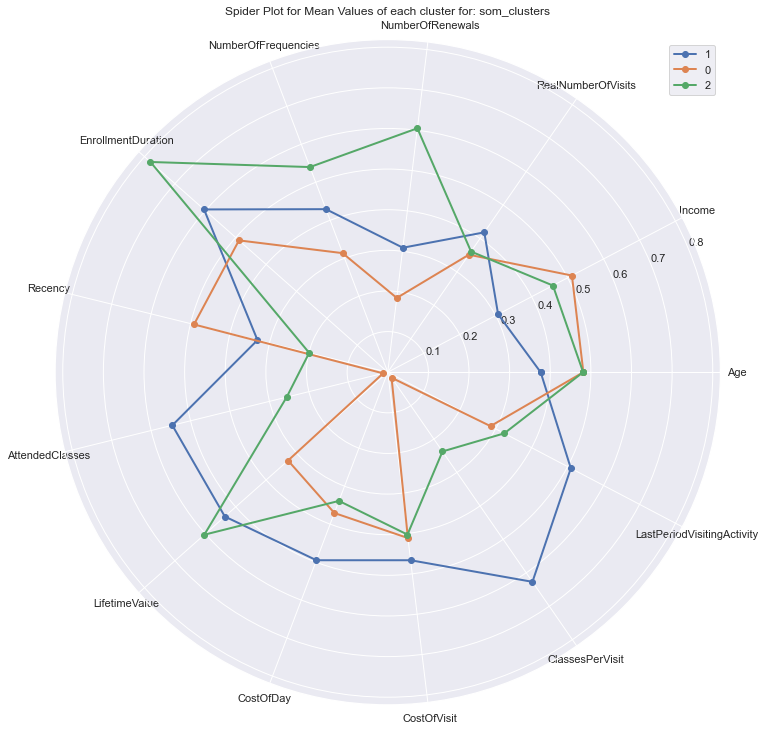

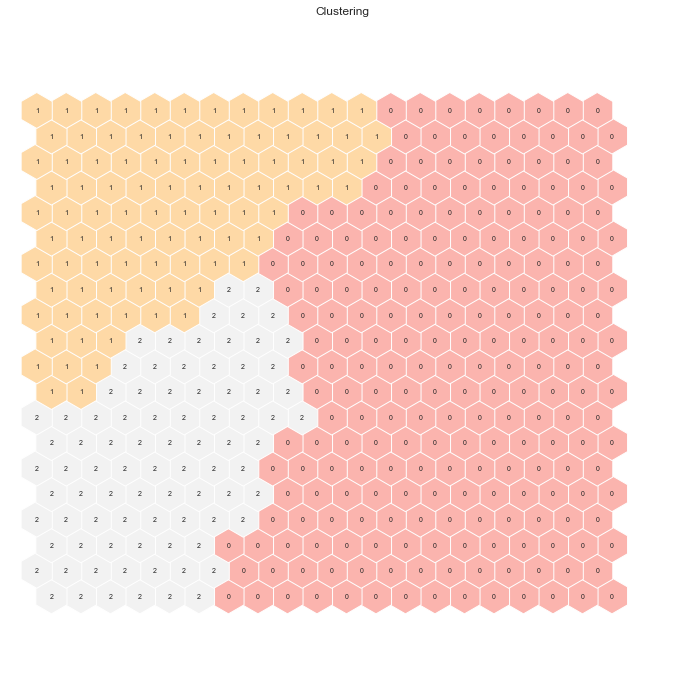

In [122]:
hierclust = AgglomerativeClustering(n_clusters=3, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy
map_clusters = nodeclus_labels
som_clusters = []
for i in sm.find_bmu(df_clustering)[0]:
    som_clusters.append(map_clusters[int(i)])

df_clustering['som_clusters'] = som_clusters
spider_results(df_clustering, ['som_clusters'], df_clustering.columns.drop('som_clusters'))
df_clustering.drop(columns = ['som_clusters'], inplace = True)



hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

Best solution here is 3 clusters with hierarcical clustering on top

#### Different Perspectives Approach

In [123]:
visit = ['RealNumberOfVisits', 'NumberOfRenewals',
'NumberOfFrequencies', 'AttendedClasses',
'EnrollmentDuration',  'Recency',
'ClassesPerVisit', 'LastPeriodVisitingActivity']

dem_spend = ['Age', 'Income', 'LifetimeValue', 
'CostOfDay', 'CostOfVisit']


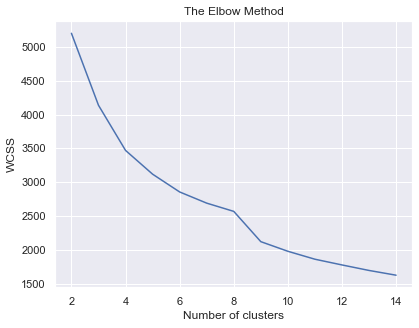

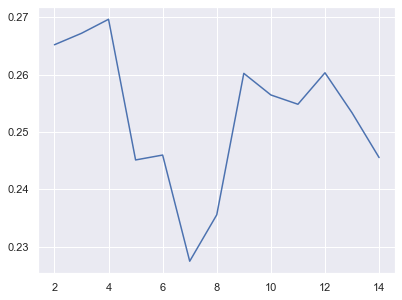

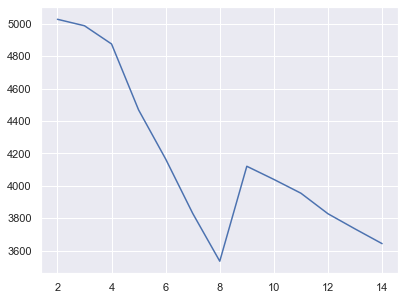

In [124]:
wcss = []
silh = []
var_rat = []
for i in range(2, 15):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42, n_init = 'auto')
    kmeans.fit(df_clustering[visit])
    kmeans_labels = kmeans.fit_predict(df_clustering[visit]) 
    silh.append(silhouette_score(df_clustering[visit], kmeans_labels))
    var_rat.append(calinski_harabasz_score(df_clustering[visit], kmeans_labels))
    wcss.append(kmeans.inertia_) # atribute of kmeans that gives as the wcss of each n_clusters
plt.plot(range(2, 15), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()
plt.plot(range(2, 15), silh)
plt.show()
plt.plot(range(2, 15), var_rat)
plt.show()

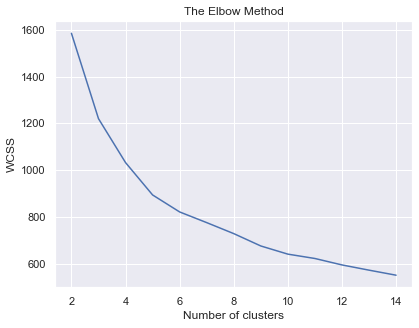

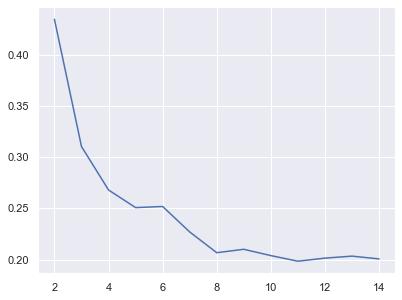

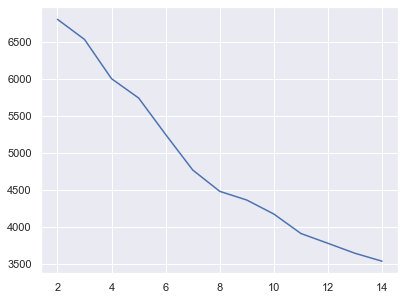

In [125]:
wcss = []
silh = []
var_rat = []
for i in range(2, 15):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42, n_init = 'auto')
    kmeans.fit(df_clustering[dem_spend])
    kmeans_labels = kmeans.fit_predict(df_clustering[dem_spend]) 
    silh.append(silhouette_score(df_clustering[dem_spend], kmeans_labels))
    var_rat.append(calinski_harabasz_score(df_clustering[dem_spend], kmeans_labels))
    wcss.append(kmeans.inertia_) # atribute of kmeans that gives as the wcss of each n_clusters
plt.plot(range(2, 15), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()
plt.plot(range(2, 15), silh)
plt.show()
plt.plot(range(2, 15), var_rat)
plt.show()

In [126]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42, n_init = 'auto')
kmeans_labels = kmeans.fit_predict(df_clustering[visit]) 
print(silhouette_score(df_clustering[visit], kmeans_labels))
df_clustering['visit_labels'] = kmeans_labels

kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42, n_init = 'auto')
kmeans_labels = kmeans.fit_predict(df_clustering[dem_spend]) 
print(silhouette_score(df_clustering[dem_spend], kmeans_labels))
df_clustering['dem_spend_labels'] = kmeans_labels

0.26968354650243953
0.2679883495934919


In [127]:
pd.crosstab(df_clustering['visit_labels'],
            df_clustering['dem_spend_labels'])

dem_spend_labels,0,1,2,3
visit_labels,,,,
0,1175,62,83,1801
1,610,2741,288,1743
2,679,176,1452,414
3,476,324,147,2031


In [128]:
df_centroids = df_clustering.groupby(['visit_labels', 'dem_spend_labels'])\
    [visit + dem_spend].mean()

linkage = 'ward'
hclust = AgglomerativeClustering(
    linkage=linkage, 
    metric='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

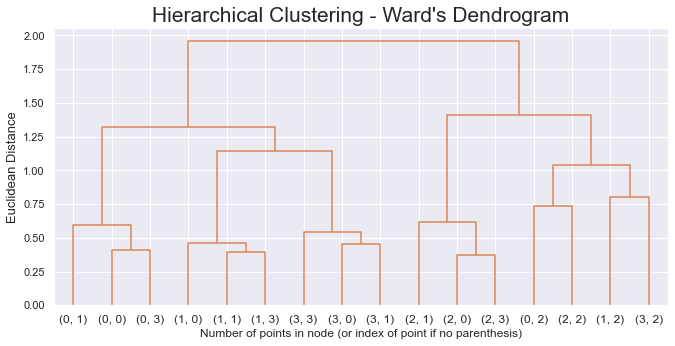

In [129]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 10.15
dendrogram(linkage_matrix, 
           truncate_mode='level', 
           labels=df_centroids.index, p=5, 
           color_threshold=y_threshold, 
           above_threshold_color='k')

# plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

Based on dendrogram its hard to define but around 6 clusters looks fine

100%|███████████████████████████████████████████| 15/15 [00:20<00:00,  1.34s/it]


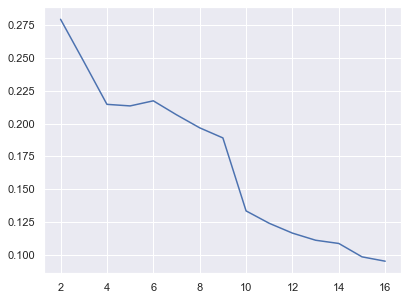

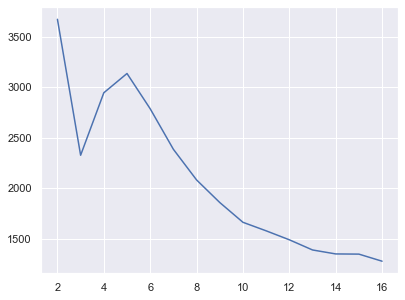

In [130]:
silh = []
var_rat = []
for i in tqdm(range(2, len(df_centroids)+1)):
    hclust = AgglomerativeClustering(
        linkage='ward', 
        metric='euclidean', 
        n_clusters= i
    )
    hclust_labels = hclust.fit_predict(df_centroids)
    df_centroids['hclust_labels'] = hclust_labels
    
    # Mapper between concatenated clusters and hierarchical clusters
    cluster_mapper = df_centroids['hclust_labels'].to_dict()
    
    df_1 = df_clustering.copy()
    
    # Mapping the hierarchical clusters on the centroids to the observations
    df_1['merged_labels'] = df_1.apply(
        lambda row: cluster_mapper[
            (row['visit_labels'], row['dem_spend_labels'])
        ], axis=1
    )
    silh.append(silhouette_score(df_1[visit + dem_spend], df_1['merged_labels']))
    var_rat.append(calinski_harabasz_score(df_1[visit + dem_spend], df_1['merged_labels']))
plt.plot(range(2, len(df_centroids)+1), silh)
plt.show()
plt.plot(range(2, len(df_centroids)+1), var_rat)
plt.show()

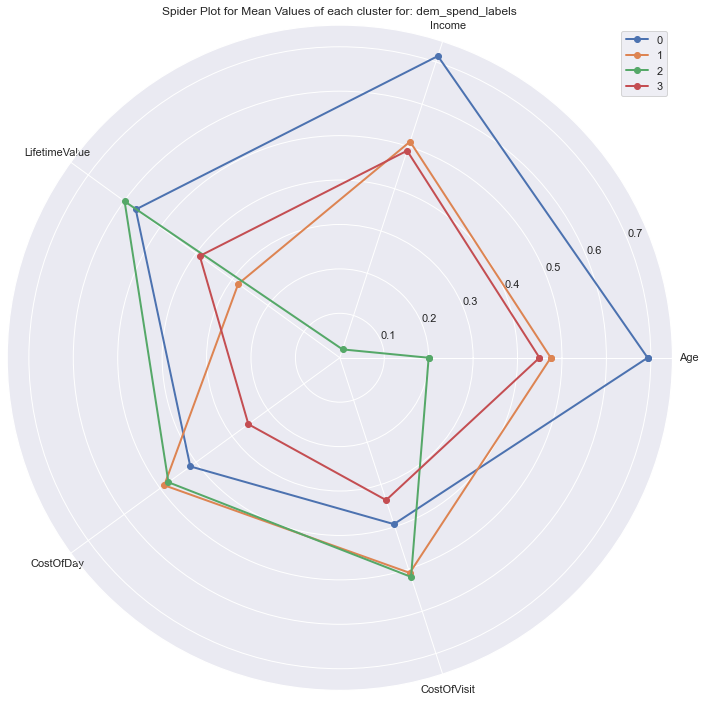

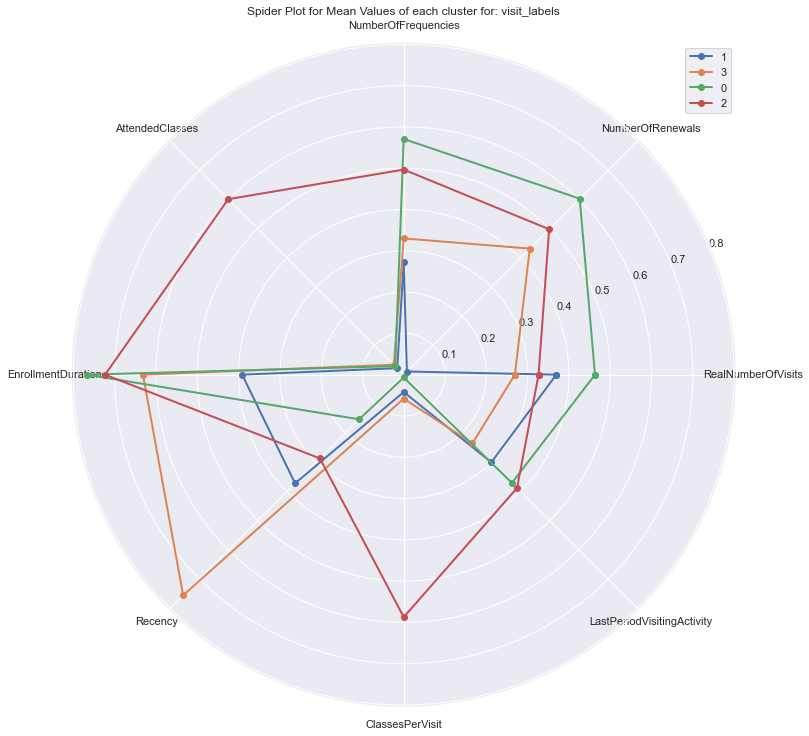

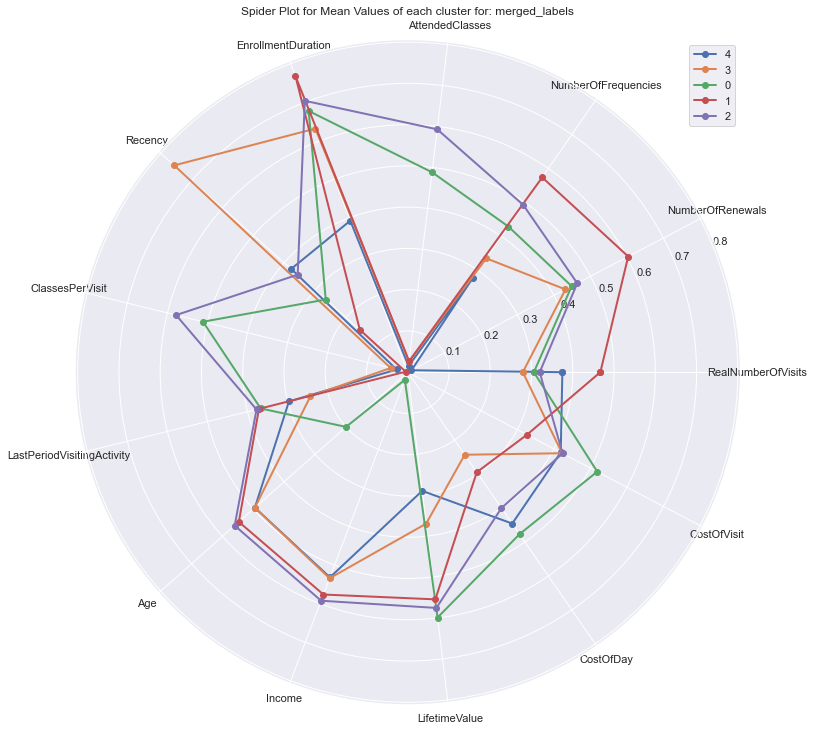

In [131]:
df_centroids = df_clustering.groupby(['visit_labels', 'dem_spend_labels'])\
    [visit + dem_spend].mean()


hclust = AgglomerativeClustering(
    linkage='ward', 
    metric='euclidean', 
    n_clusters= 5
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_1 = df_clustering.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_1['merged_labels'] = df_1.apply(
    lambda row: cluster_mapper[
        (row['visit_labels'], row['dem_spend_labels'])
    ], axis=1
)

spider_results(df_1, ['dem_spend_labels'], dem_spend)
spider_results(df_1, ['visit_labels'], visit )
spider_results(df_1, ['merged_labels'], visit + dem_spend)

In [132]:
df_1

,Age,Income,RealNumberOfVisits,NumberOfRenewals,NumberOfFrequencies,EnrollmentDuration,Recency,AttendedClasses,LifetimeValue,CostOfDay,CostOfVisit,ClassesPerVisit,LastPeriodVisitingActivity,visit_labels,dem_spend_labels,merged_labels
ID,,,,,,,,,,,,,,,,
10000,0.834686,0.824531,0.275412,0.000000,0.277460,0.301080,0.000514,0.365000,0.295284,0.613886,0.406444,0.518519,0.564395,1,0,4
10001,0.523473,0.570169,0.173765,0.577350,0.428387,0.681547,0.805755,0.121667,0.633337,0.516662,0.539063,0.028986,0.239621,3,0,3
10002,0.445783,0.494719,0.487821,0.000000,0.215971,0.172981,0.456835,0.000000,0.123185,0.531803,0.328273,0.000000,0.447040,1,1,4
10003,0.209047,0.000000,0.347531,0.000000,0.405367,0.500899,0.145427,0.192837,0.406327,0.440288,0.364300,0.066667,0.411507,1,2,0
10004,0.593461,0.730748,0.000000,0.707107,0.524863,0.814721,0.370504,0.000000,0.582864,0.244017,0.391398,0.000000,0.000000,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,0.306816,0.000000,0.550823,0.707107,0.695486,0.891732,0.001028,0.802990,0.858565,0.538168,0.454454,0.571429,0.479241,2,2,0
24938,0.636821,0.660468,0.347531,0.000000,0.580508,0.597824,0.658787,0.000000,0.566335,0.550997,0.321997,0.000000,0.221846,1,0,4
24939,0.403112,0.473004,0.550823,0.000000,0.215971,0.172981,0.486125,0.000000,0.152423,0.589991,0.352976,0.000000,0.516197,1,1,4


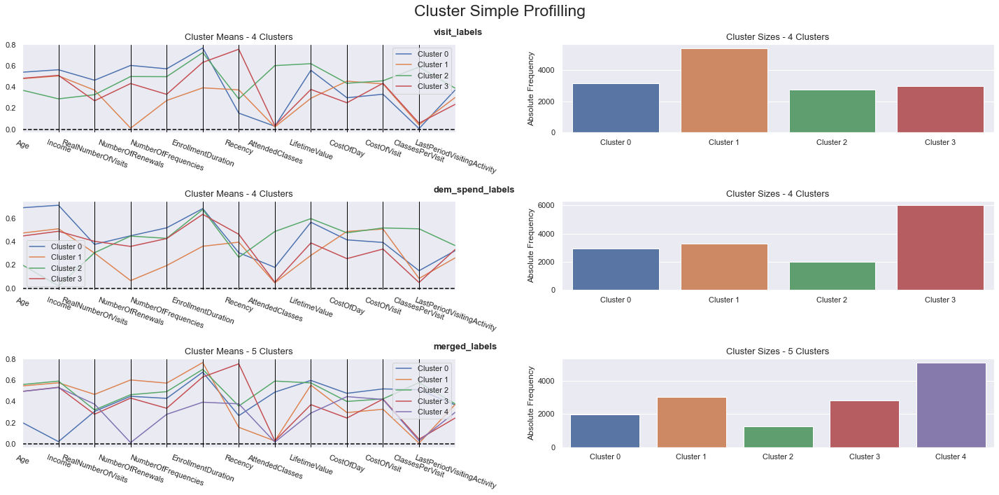

In [133]:
cluster_profiles(df_1, ['visit_labels', 'dem_spend_labels', 'merged_labels'], 
                 (20,10), 
                 compar_titles=['visit_labels', 'dem_spend_labels', 'merged_labels'])

In [134]:
df_counts = df_1.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the product and behavior labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['visit_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['dem_spend_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])

df_counts.pivot(values=0, index='visit_labels', columns='dem_spend_labels')

dem_spend_labels,2,3
visit_labels,,
0,NaN,3038.0
1,NaN,5094.0
2,NaN,1269.0
3,1970.0,2831.0


In [135]:
r2_variables(df_1[visit + dem_spend + ['merged_labels']], 'merged_labels').sort_values(ascending = False).drop('merged_labels')

AttendedClasses               0.743252
ClassesPerVisit               0.720736
Income                        0.694897
NumberOfRenewals              0.647186
EnrollmentDuration            0.535090
LifetimeValue                 0.458538
Recency                       0.447049
Age                           0.433871
NumberOfFrequencies           0.315951
CostOfDay                     0.296829
CostOfVisit                   0.139435
RealNumberOfVisits            0.082180
LastPeriodVisitingActivity    0.052453
dtype: float64

In [136]:
silhouette_score(df_1[visit + dem_spend], df_1['merged_labels'])

0.21342434661807022

### Results

#### Clusters 

In [148]:
df_clustering.drop(columns = ['visit_labels', 'dem_spend_labels'], inplace = True)

In [439]:
df_clustering['Clusters_two_perspectives'] = df_1['merged_labels']

In [440]:
df_clustering['Clusters_Birch'] = birch_labels

In [441]:
df_clustering['Clusters_DBSCAN']= dbscan_labels

In [442]:
df_clustering['Clusters_MeanS']= ms_labels

In [443]:
df_clustering['Clusters_Gauss'] = gmm_labels

In [444]:
df_clustering['Clusters_KMeans'] = y_kmeans_labels

In [445]:
df_clustering['Clusters_SOM'] = som_clusters

In [446]:
df_results = df_clustering.copy()
columns = ['Age', 'Income', 'RealNumberOfVisits', 'NumberOfRenewals',
       'NumberOfFrequencies', 'EnrollmentDuration', 'Recency',
       'AttendedClasses', 'LifetimeValue', 'CostOfDay', 'CostOfVisit',
       'ClassesPerVisit', 'LastPeriodVisitingActivity']
df_results[columns].mean()
clusters_name = ['Clusters_DBSCAN',
                 'Clusters_MeanS',
                 'Clusters_Gauss', 
                 'Clusters_KMeans',
                 'Clusters_Birch',
                 'Clusters_KMeans',
                 'Clusters_SOM',
                 'Clusters_two_perspectives'
                ]

#### TSNE

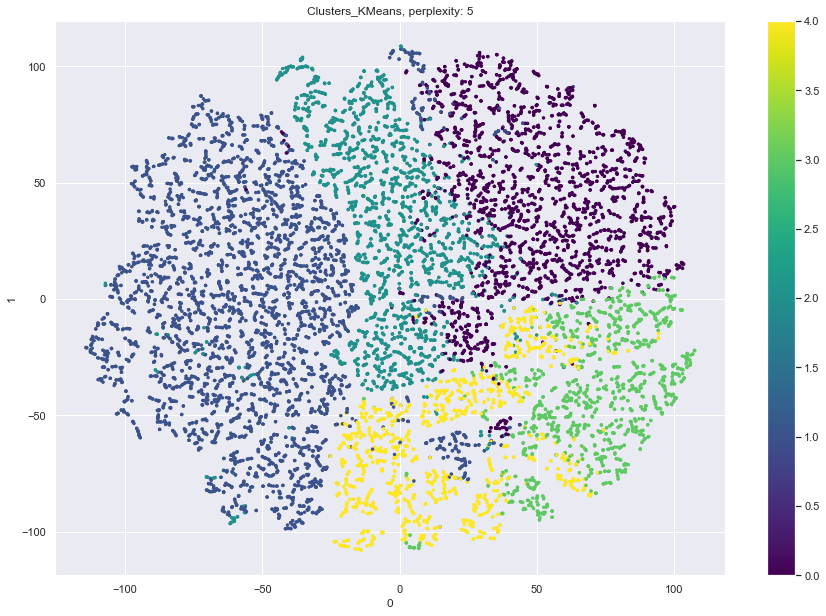

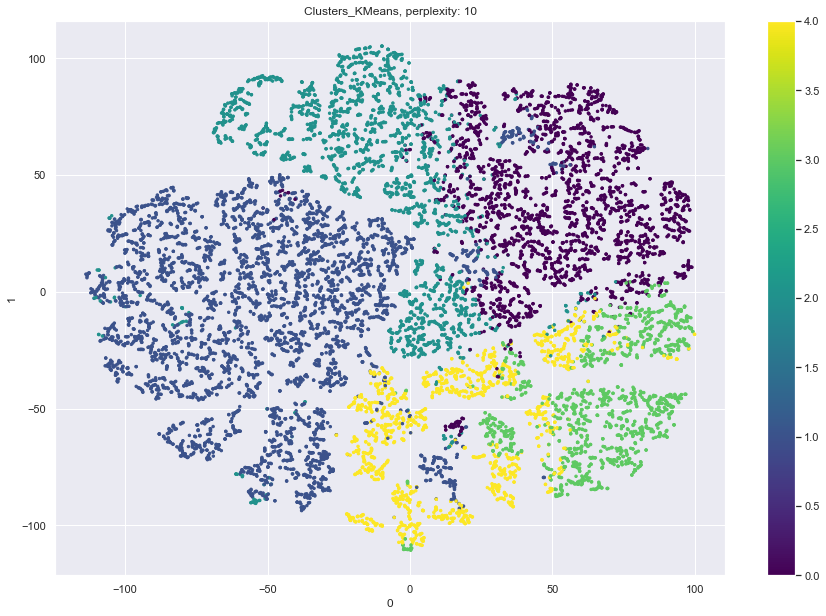

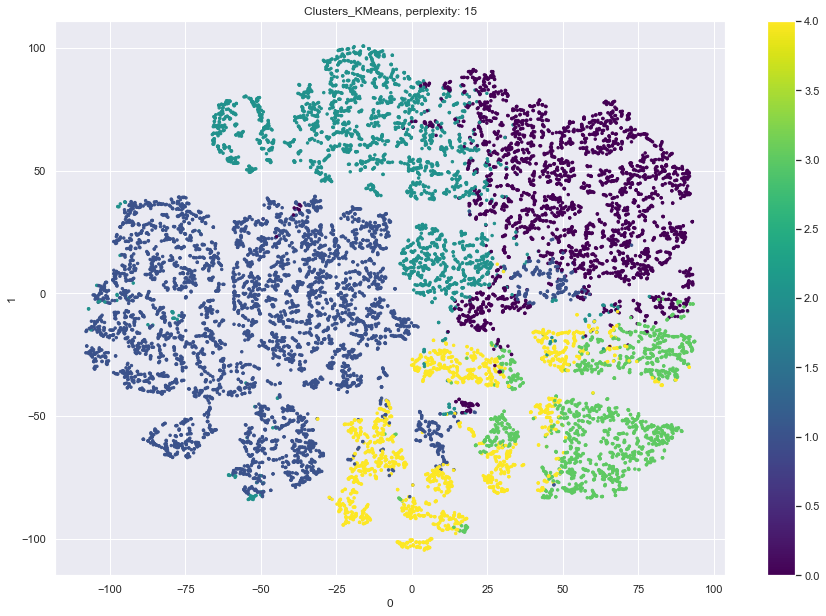

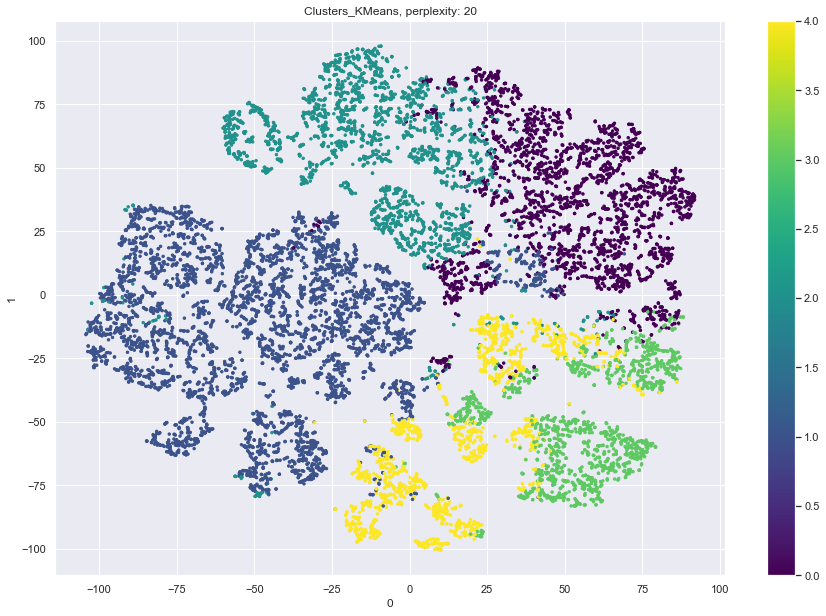

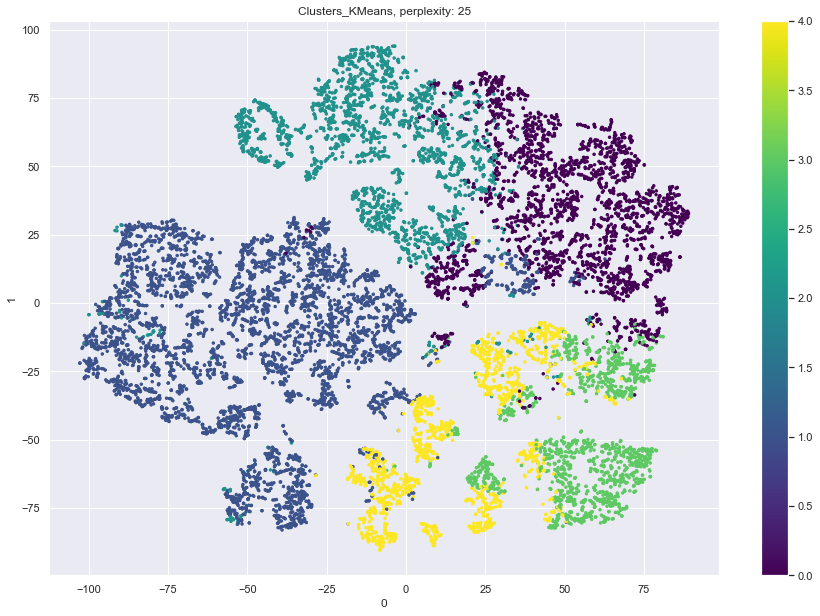

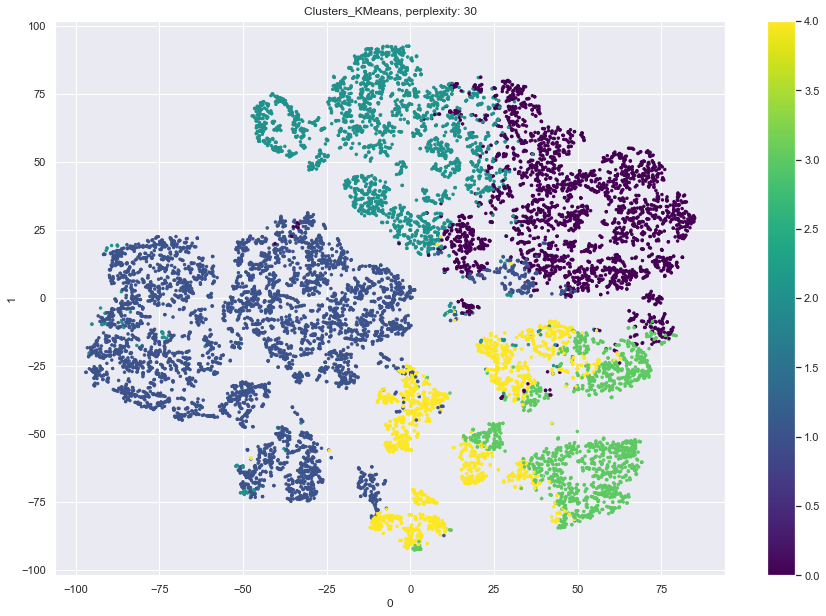

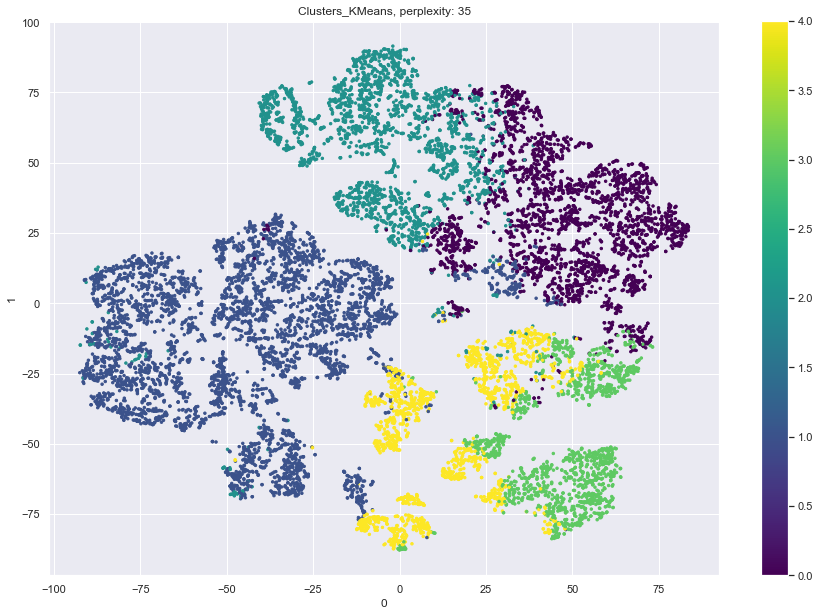

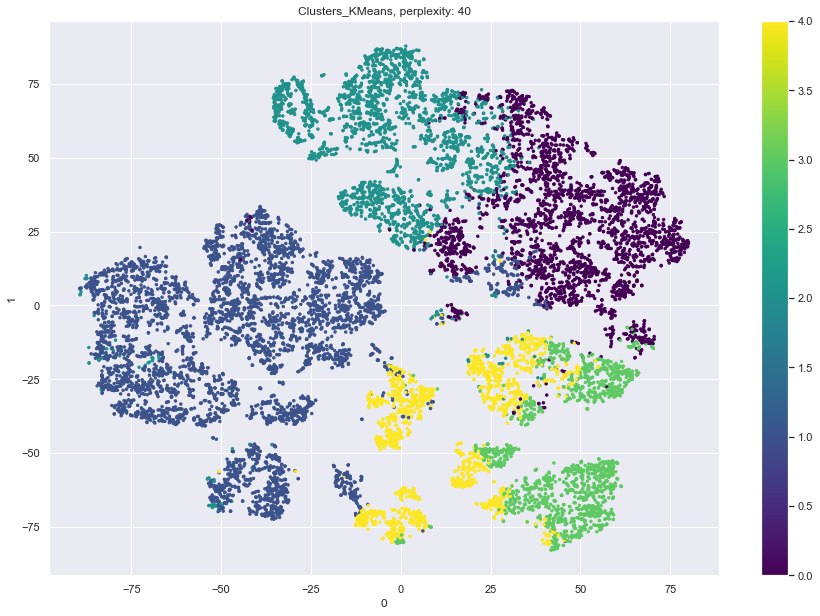

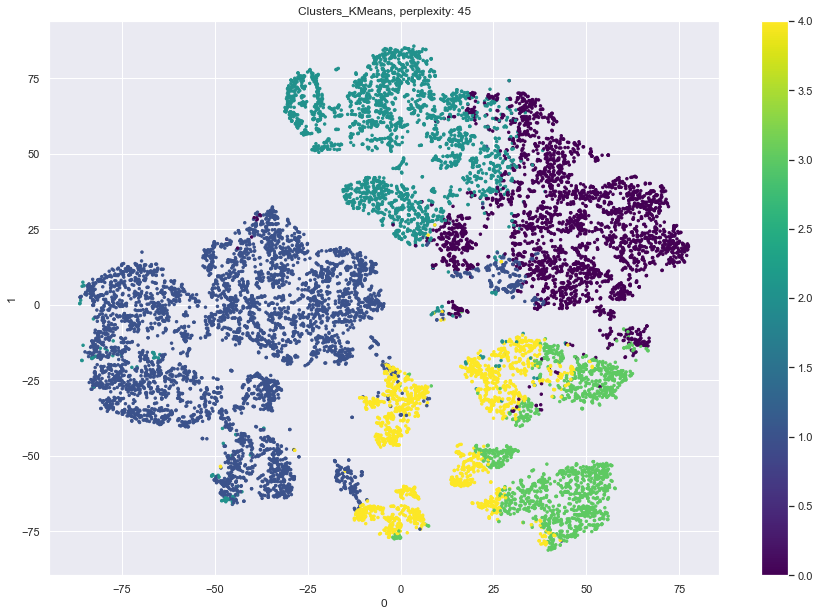

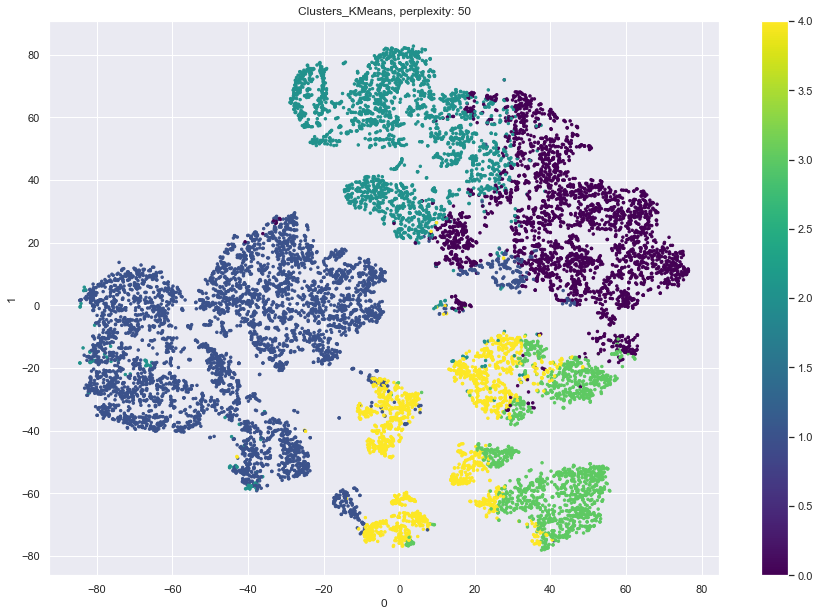

In [447]:
for i in range(5,51,5):
    two_dim = TSNE(random_state=42, perplexity = i).fit_transform(df_clustering.drop(columns = clusters_name))
    pd.DataFrame(two_dim).plot.scatter(x=0, y=1, s = 6,
                                       c=df_clustering['Clusters_KMeans'].astype(int), colormap='viridis', figsize=(15,10))
    plt.title('Clusters_KMeans' + ', perplexity: ' + str(i))
    plt.show()

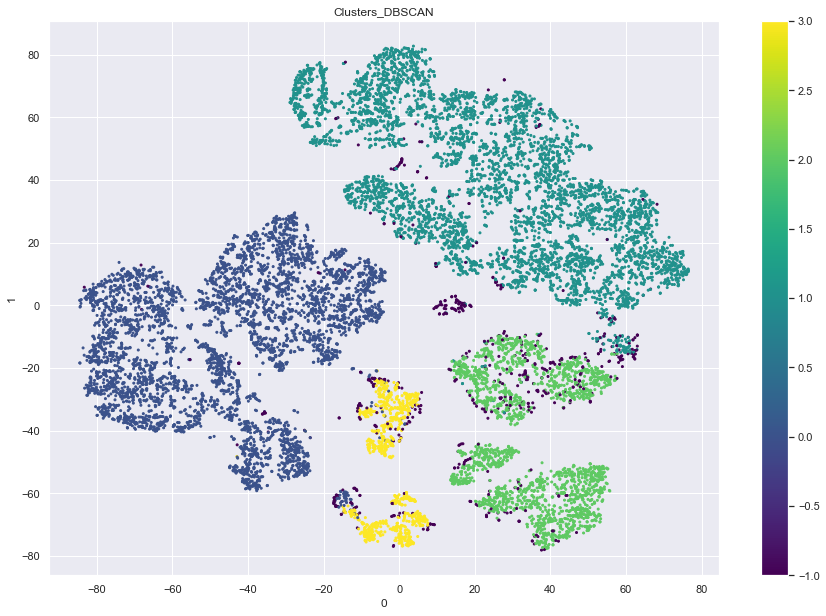

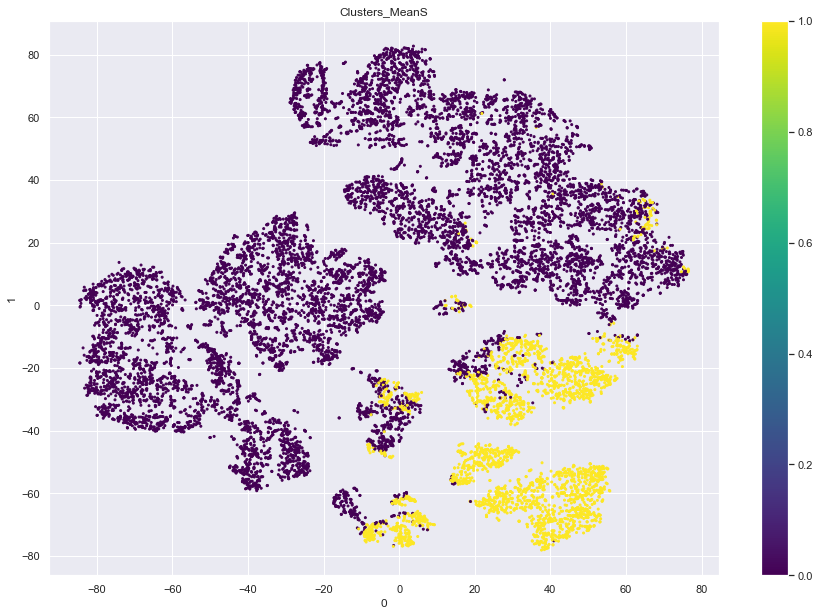

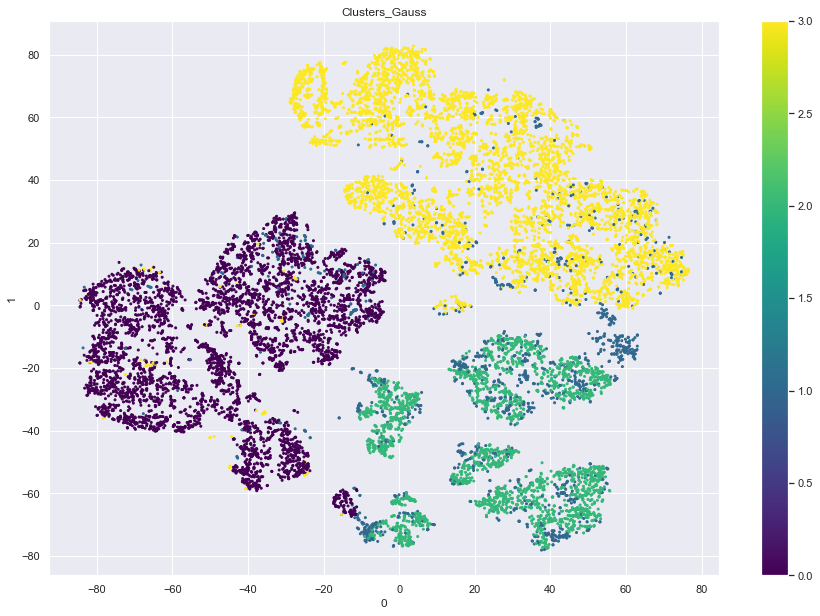

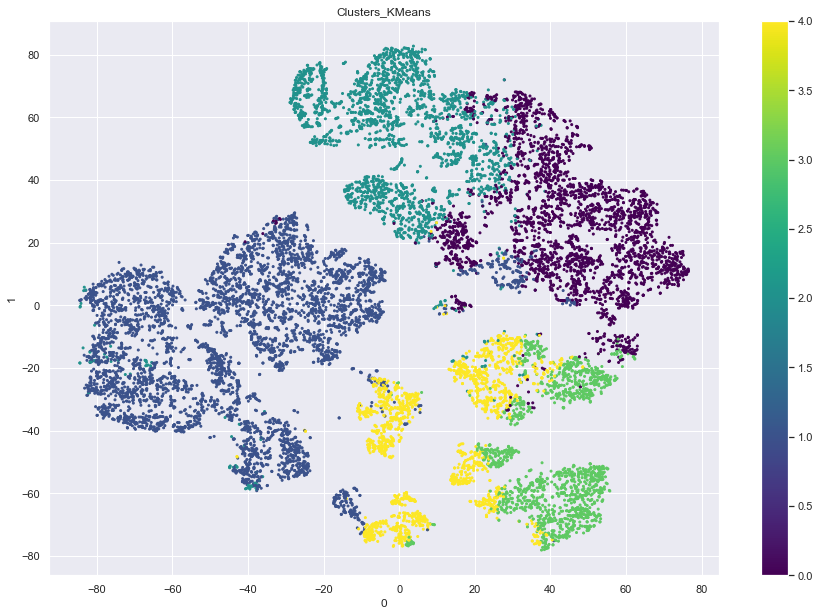

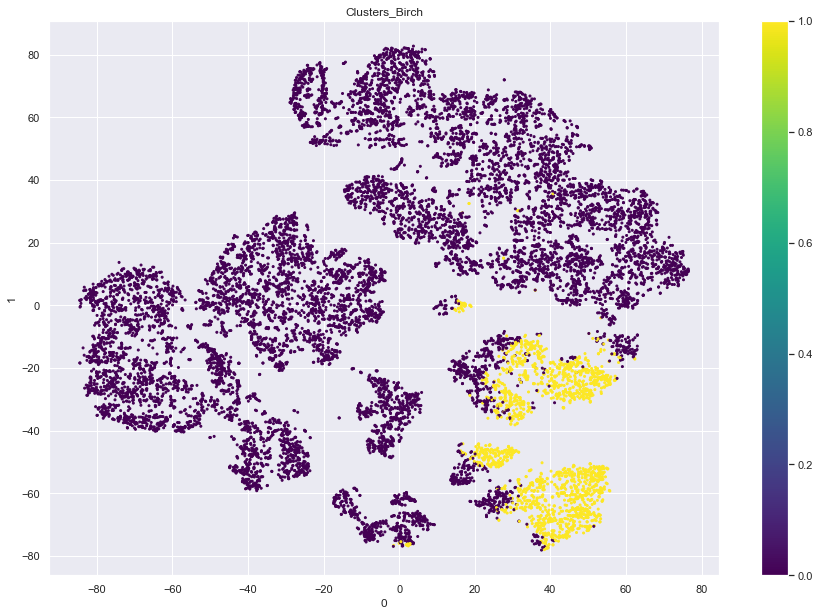

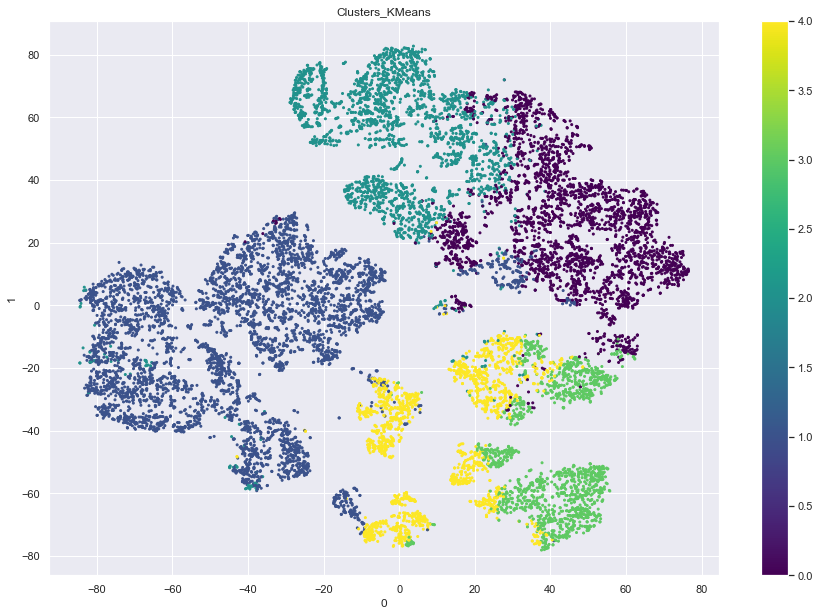

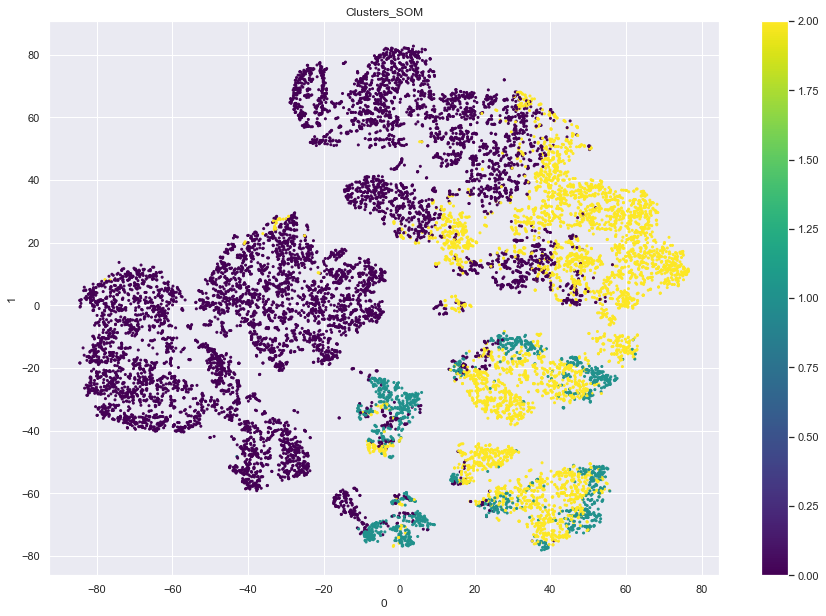

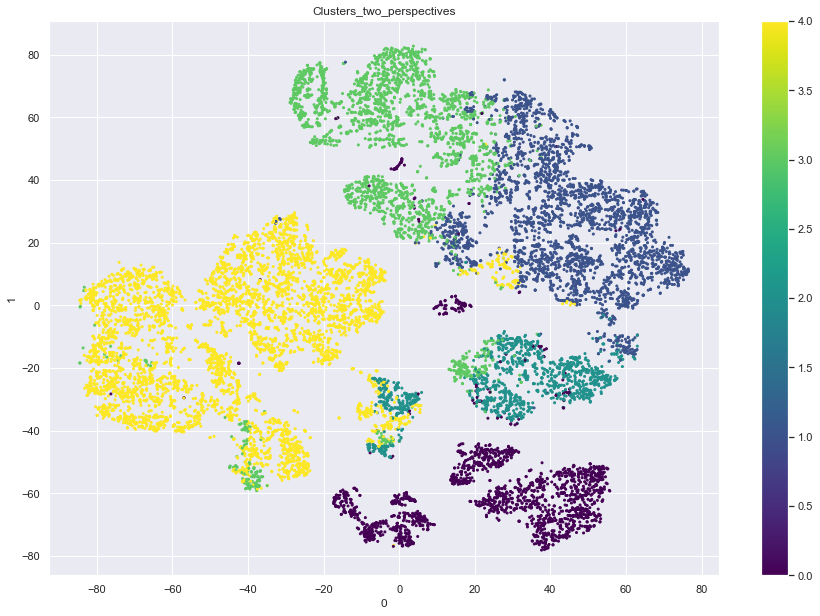

In [448]:
two_dim = TSNE(random_state=42, perplexity = 50).fit_transform(df_clustering.drop(columns = clusters_name))

for i in clusters_name:
    pd.DataFrame(two_dim).plot.scatter(x=0, y=1, s = 4,
                                       c=df_clustering[i].astype(int), colormap='viridis', figsize=(15,10))
    plt.title(i)
    plt.show()

#### UMAP

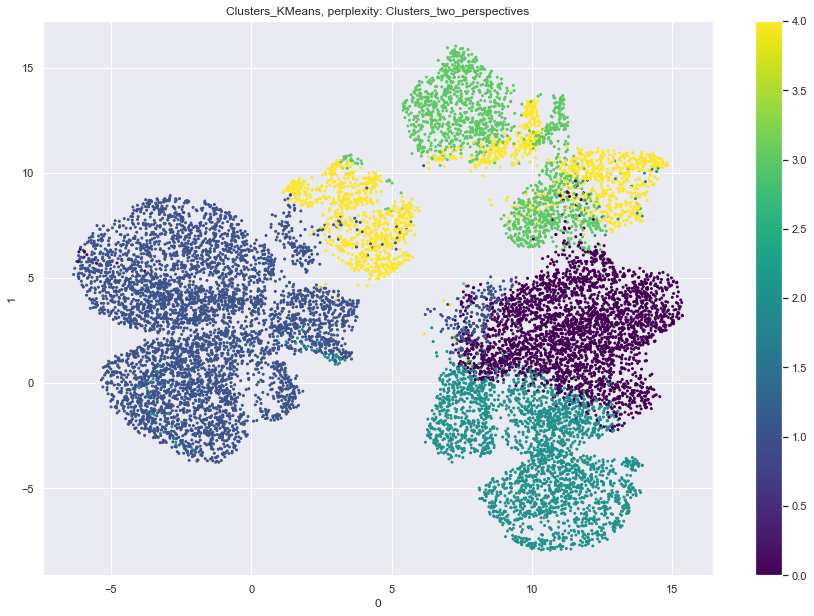

In [450]:
umap_model = umap.UMAP(n_neighbors=50, min_dist=0.7, n_components=2)
umap_result = umap_model.fit_transform(df_results[columns])

pd.DataFrame(umap_result).plot.scatter(x=0, y=1, s = 4,
                                       c=df_clustering['Clusters_KMeans'].astype(int), colormap='viridis', figsize=(15,10))
plt.title('Clusters_KMeans' + ', perplexity: ' + str(i))
plt.show()

#### Metrics and profiling

100%|█████████████████████████████████████████████| 7/7 [00:10<00:00,  1.45s/it]


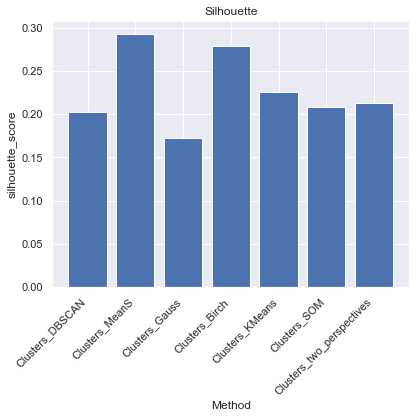

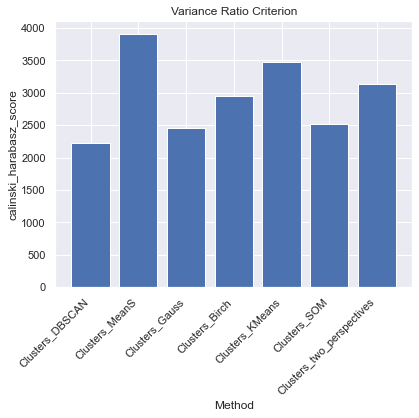

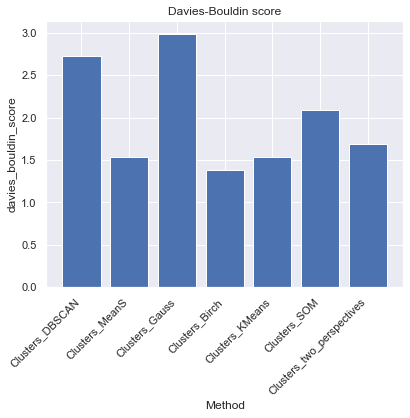

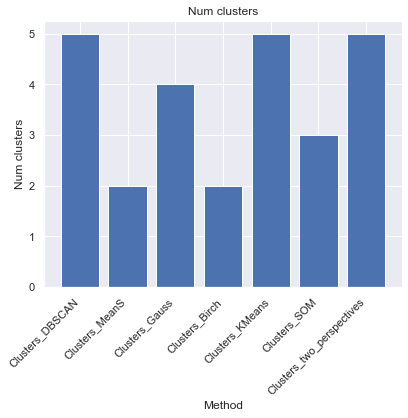

In [296]:
bould = [] 
silh = []
var_rat = []
num_clusters = []

for i in tqdm(clusters_name):
    silh.append(silhouette_score(df_results.drop(columns = clusters_name), df_results[i]))
    var_rat.append(calinski_harabasz_score(df_results.drop(columns = clusters_name), df_results[i]))
    bould.append(davies_bouldin_score(df_results.drop(columns = clusters_name), df_results[i]))
    num_clusters.append(df_results[i].nunique())
    

plt.bar(clusters_name, silh)
plt.xticks(rotation=45, ha='right')
plt.title('Silhouette')
plt.xlabel('Method')
plt.ylabel('silhouette_score')
plt.show()
plt.bar(clusters_name, var_rat)
plt.xticks(rotation=45, ha='right')
plt.title('Variance Ratio Criterion')
plt.xlabel('Method')
plt.ylabel('calinski_harabasz_score')
plt.show()
plt.bar(clusters_name, bould)
plt.xticks(rotation=45, ha='right')
plt.title('Davies-Bouldin score')
plt.xlabel('Method')
plt.ylabel('davies_bouldin_score')
plt.show()
plt.bar(clusters_name, num_clusters)
plt.xticks(rotation=45, ha='right')
plt.title('Num clusters')
plt.xlabel('Method')
plt.ylabel('Num clusters')
plt.show()

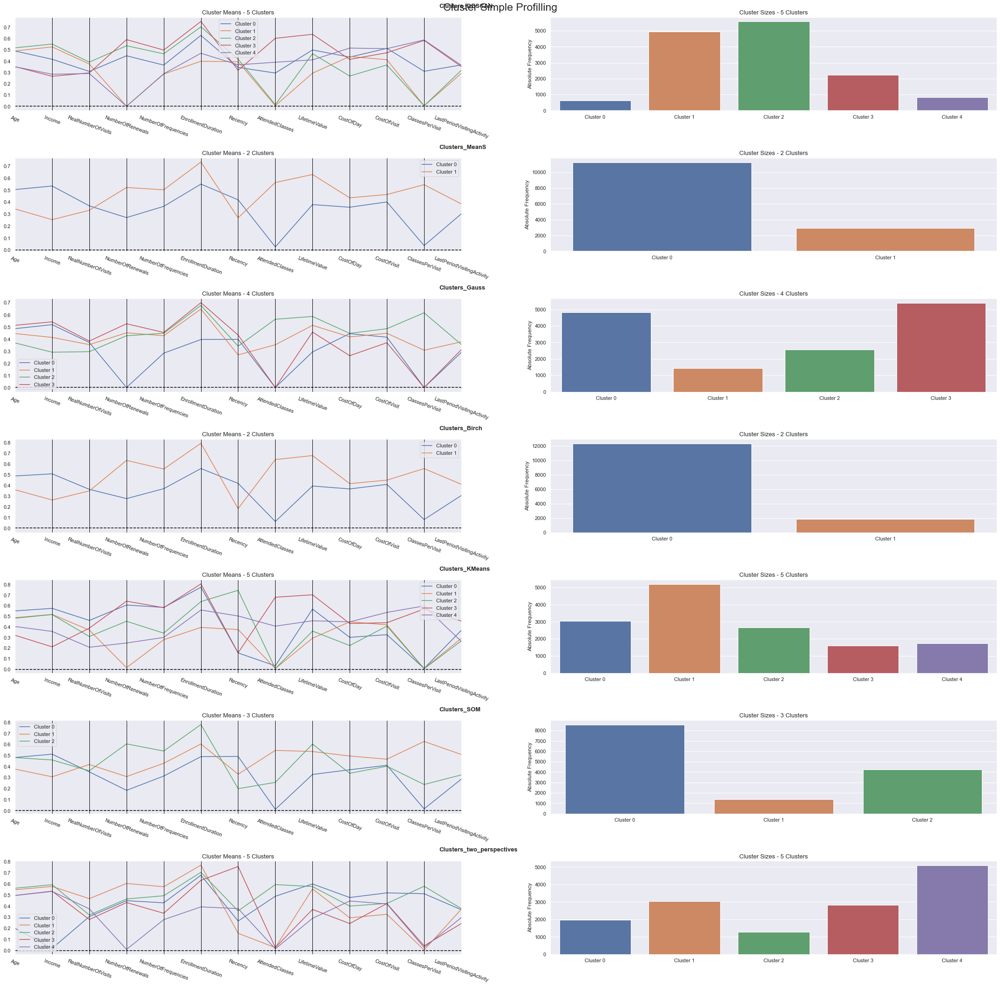

In [297]:
cluster_profiles(df_results, clusters_name, 
                 (30,30), 
                 compar_titles=clusters_name)

In [298]:
pd.crosstab(df_clustering['Clusters_KMeans'],
            df_clustering['Clusters_two_perspectives'])

Clusters_two_perspectives,0,1,2,3,4
Clusters_KMeans,,,,,
0,45,2881,46,61,6
1,143,52,3,99,4896
2,51,99,5,2483,15
3,1054,4,536,0,0
4,677,2,679,188,177


In [299]:
r2_variables(df_clustering[columns + ['Clusters_two_perspectives']], 'Clusters_two_perspectives').sort_values(ascending = False).drop('Clusters_two_perspectives')

AttendedClasses               0.743252
ClassesPerVisit               0.720736
Income                        0.694897
NumberOfRenewals              0.647186
EnrollmentDuration            0.535090
LifetimeValue                 0.458538
Recency                       0.447049
Age                           0.433871
NumberOfFrequencies           0.315951
CostOfDay                     0.296829
CostOfVisit                   0.139435
RealNumberOfVisits            0.082180
LastPeriodVisitingActivity    0.052453
dtype: float64

In [300]:
r2_variables(df_clustering[columns + ['Clusters_KMeans']], 'Clusters_KMeans').sort_values(ascending = False).drop('Clusters_KMeans')

ClassesPerVisit               0.921536
AttendedClasses               0.863523
NumberOfRenewals              0.744908
EnrollmentDuration            0.618762
LifetimeValue                 0.547602
Recency                       0.473857
NumberOfFrequencies           0.422681
CostOfDay                     0.303679
Income                        0.256779
Age                           0.157658
CostOfVisit                   0.154764
RealNumberOfVisits            0.104720
LastPeriodVisitingActivity    0.076255
dtype: float64

First 3 clusters among 2 best approaches are very similar

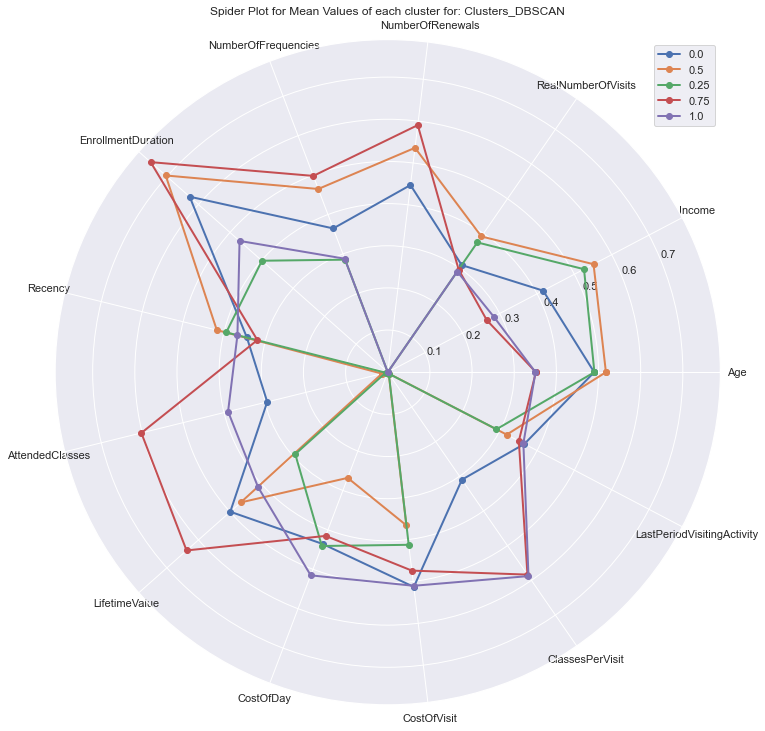

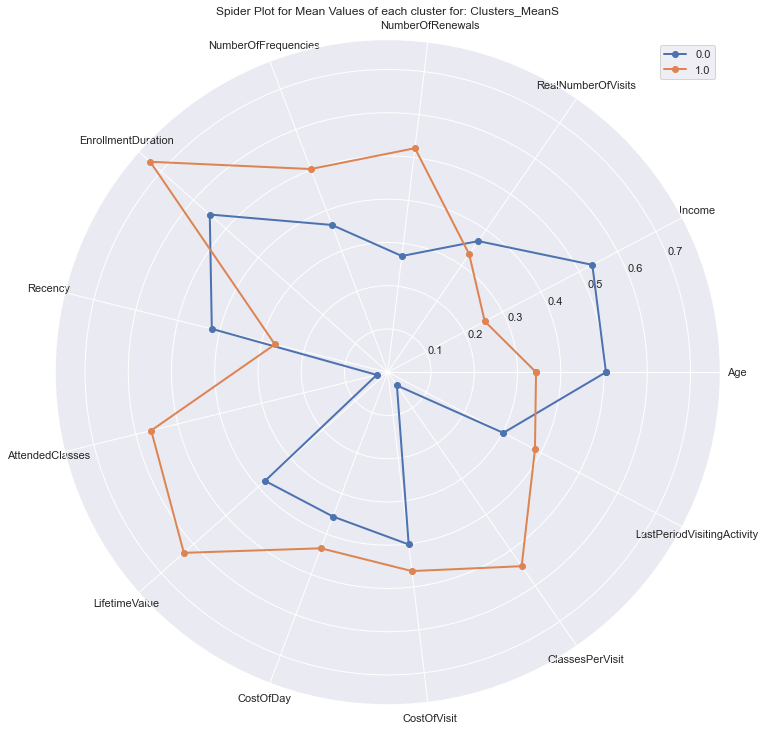

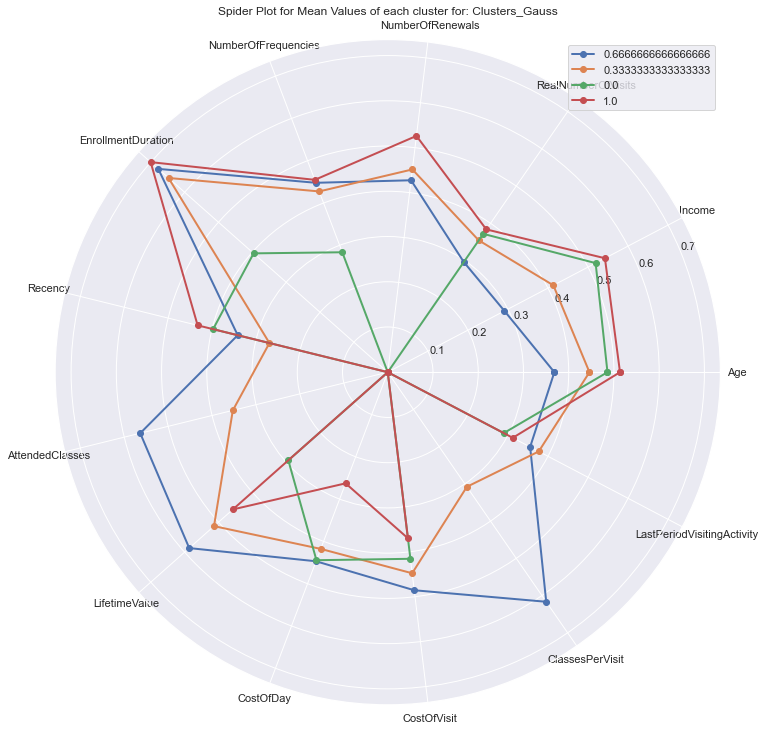

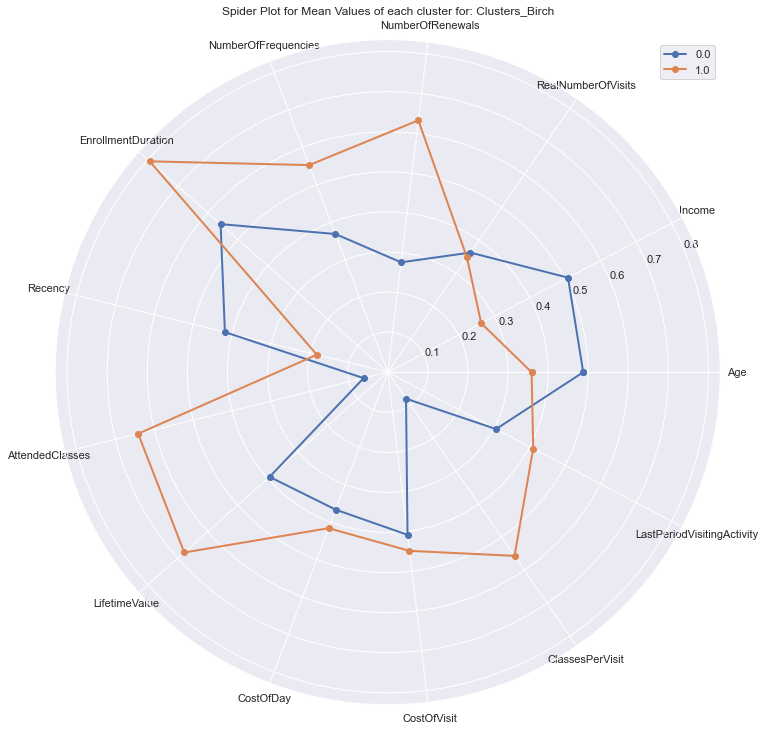

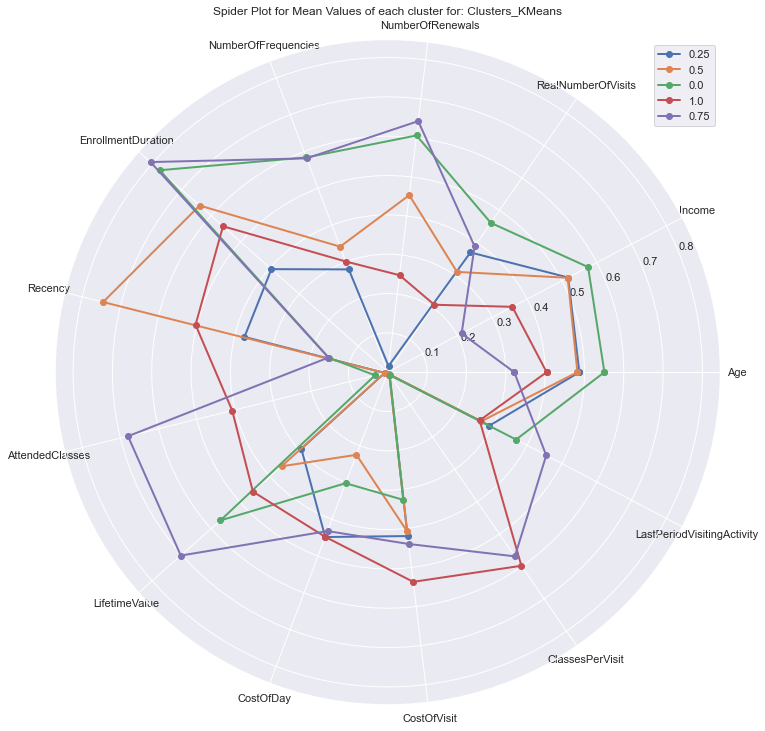

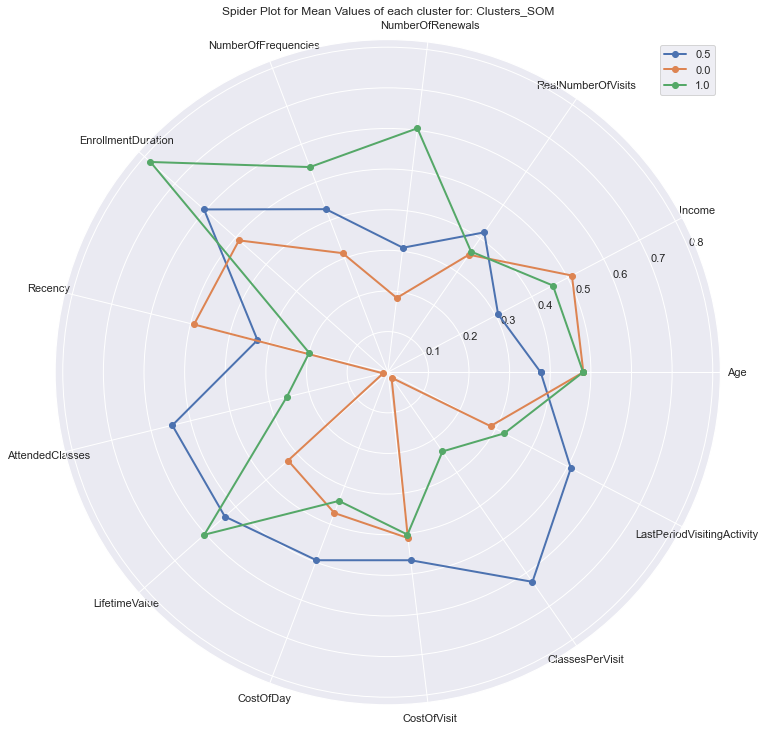

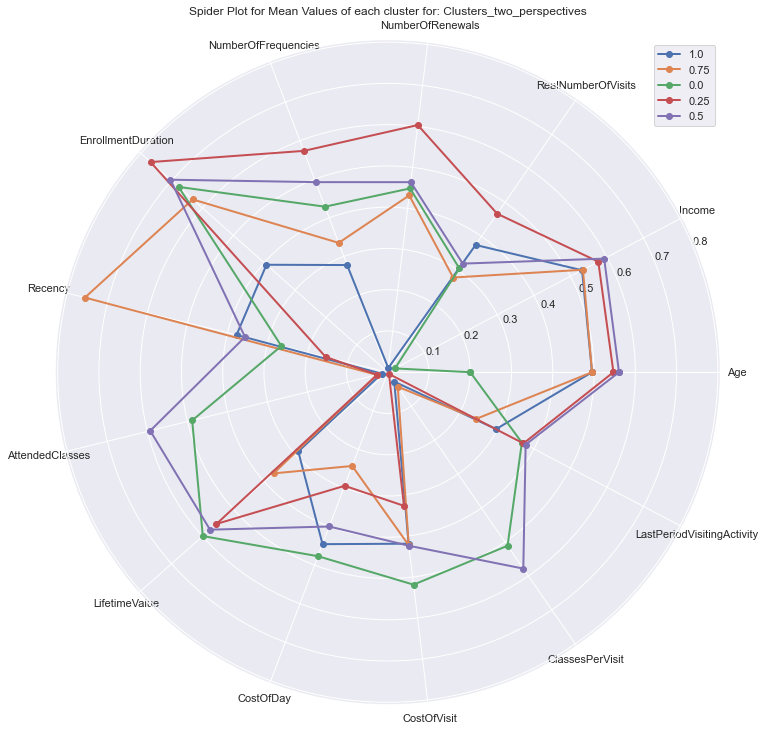

In [301]:
scaler_plot = MinMaxScaler()
spider_results(pd.DataFrame(scaler_plot.fit_transform(df_clustering), 
                                            columns = df_clustering.columns, 
                                            index = df_clustering.index), clusters_name, columns )

#### Merging solutions

In [186]:
df_centroids = df_results.groupby(clusters_name).mean()

linkage = 'ward'
hclust = AgglomerativeClustering(
    linkage=linkage, 
    metric='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

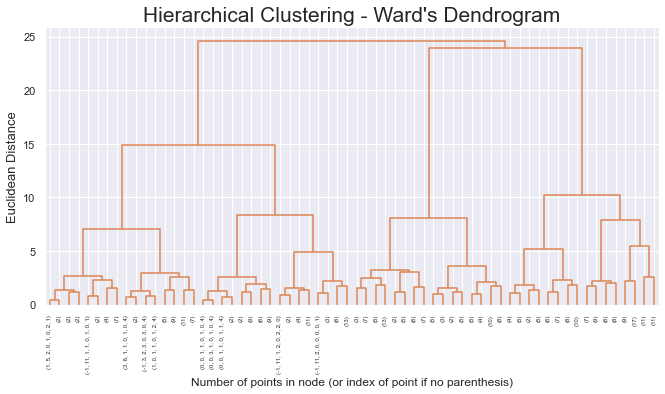

In [187]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 10000.15
dendrogram(linkage_matrix, 
           truncate_mode='level', 
           labels=df_centroids.index, p=5, 
           color_threshold=y_threshold, 
           above_threshold_color='k')

# plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

100%|██████████| 8/8 [00:42<00:00,  5.31s/it]


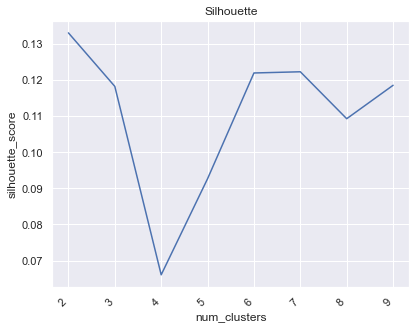

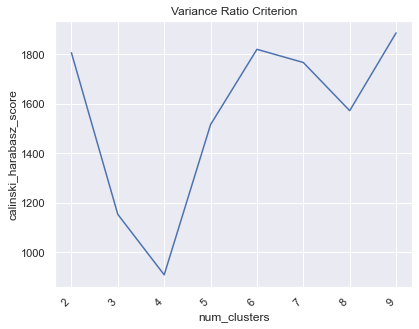

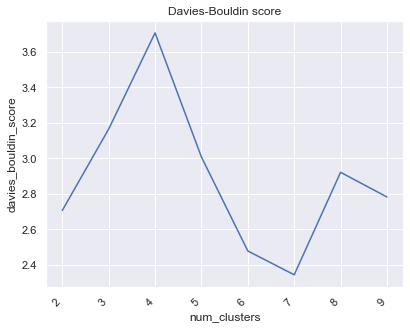

In [188]:
silh = []
var_rat = []
bould = [] 
for i in tqdm(range(2, 10)):
    hclust = AgglomerativeClustering(
        linkage='ward', 
        metric='euclidean', 
        n_clusters= i
    )
    hclust_labels = hclust.fit_predict(df_centroids)
    df_centroids['hclust_labels'] = hclust_labels
    
    # Mapper between concatenated clusters and hierarchical clusters
    cluster_mapper = df_centroids['hclust_labels'].to_dict()
    
    df_ = df_clustering.copy()
    
    # Mapping the hierarchical clusters on the centroids to the observations
    df_['merged_labels'] = df_.apply(
        lambda row: cluster_mapper[
            (row['Clusters_DBSCAN'],
                 row['Clusters_MeanS'],
                 row['Clusters_Gauss'], 
                 row['Clusters_KMeans'],
                 row['Clusters_Birch'],
                 row['Clusters_KMeans'],
                 row['Clusters_SOM'],
                 row['Clusters_two_perspectives']
                )
        ], axis=1
    )
    silh.append(silhouette_score(df_[columns], df_['merged_labels']))
    var_rat.append(calinski_harabasz_score(df_[columns], df_['merged_labels']))
    bould.append(davies_bouldin_score(df_[columns], df_['merged_labels']))
    

plt.plot(range(2, 10), silh)
plt.xticks(rotation=45, ha='right')
plt.title('Silhouette')
plt.xlabel('num_clusters')
plt.ylabel('silhouette_score')
plt.show()
plt.plot(range(2, 10), var_rat)
plt.xticks(rotation=45, ha='right')
plt.title('Variance Ratio Criterion')
plt.xlabel('num_clusters')
plt.ylabel('calinski_harabasz_score')
plt.show()
plt.plot(range(2, 10), bould)
plt.xticks(rotation=45, ha='right')
plt.title('Davies-Bouldin score')
plt.xlabel('num_clusters')
plt.ylabel('davies_bouldin_score')
plt.show()

It doesnt help

#### Interpretations

For plot and interpretations with absolute values we need inverse transformations and scaling

In [302]:
df_clustering[['Age', 'Income', 'RealNumberOfVisits', 'NumberOfRenewals',
       'NumberOfFrequencies', 'EnrollmentDuration', 'Recency',
       'AttendedClasses', 'LifetimeValue', 'CostOfDay', 'CostOfVisit',
       'ClassesPerVisit', 'LastPeriodVisitingActivity']] = scaler_final.inverse_transform(df_clustering[['Age', 'Income', 'RealNumberOfVisits', 'NumberOfRenewals',
       'NumberOfFrequencies', 'EnrollmentDuration', 'Recency',
       'AttendedClasses', 'LifetimeValue', 'CostOfDay', 'CostOfVisit',
       'ClassesPerVisit', 'LastPeriodVisitingActivity']])

for i in ['NumberOfFrequencies', 'CostOfDay', 
          'CostOfVisit','RealNumberOfVisits', 
         'EnrollmentDuration', 'LifetimeValue', 'AttendedClasses']:
    df_clustering[i] = np.expm1(df_clustering[i])

for i in ['Age', 'LastPeriodVisitingActivity',
         'NumberOfRenewals', 'Income']:
    df_clustering[i] = df_clustering[i]**2

df_clustering

,Age,Income,RealNumberOfVisits,NumberOfRenewals,NumberOfFrequencies,EnrollmentDuration,Recency,AttendedClasses,LifetimeValue,CostOfDay,CostOfVisit,ClassesPerVisit,LastPeriodVisitingActivity,Clusters_two_perspectives,Clusters_Birch,Clusters_DBSCAN,Clusters_MeanS,Clusters_Gauss,Clusters_KMeans,Clusters_SOM
ID,,,,,,,,,,,,,,,,,,,,
10000,60.0,5500.0,2.0,0.0,9.0,58.0,1.0,7.0,89.35,1.540517,9.927778,0.777778,0.318471,4,0,-1,0,2,1,1
10001,29.0,2630.0,1.0,2.0,23.0,398.0,1568.0,1.0,479.20,1.204020,20.834783,0.043478,0.057405,3,0,1,0,1,2,0
10002,23.0,1980.0,6.0,0.0,6.0,30.0,889.0,0.0,37.60,1.253333,6.266667,0.000000,0.199800,4,0,0,0,0,1,0
10003,9.0,0.0,3.0,0.0,20.0,160.0,283.0,2.0,155.40,0.971250,7.770000,0.100000,0.169300,0,0,-1,0,1,1,0
10004,35.0,4320.0,0.0,3.0,41.0,778.0,721.0,0.0,373.20,0.479692,9.102439,0.000000,0.000000,1,0,1,0,3,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,14.0,0.0,8.0,3.0,112.0,1146.0,2.0,96.0,1460.45,1.274389,13.039732,0.857143,0.229621,0,1,2,1,2,3,1
24938,39.0,3529.0,3.0,0.0,57.0,261.0,1282.0,0.0,343.85,1.317433,6.032456,0.000000,0.049205,4,0,0,0,0,1,0
24939,20.0,1810.0,8.0,0.0,6.0,30.0,946.0,0.0,43.60,1.453333,7.266667,0.000000,0.266400,4,0,0,0,0,1,0


In [303]:
df_clustering[columns + ['Clusters_KMeans']].groupby(['Clusters_KMeans']).mean()

,Age,Income,RealNumberOfVisits,NumberOfRenewals,NumberOfFrequencies,EnrollmentDuration,Recency,AttendedClasses,LifetimeValue,CostOfDay,CostOfVisit,ClassesPerVisit,LastPeriodVisitingActivity
Clusters_KMeans,,,,,,,,,,,,,
0,32.640671,2873.896347,8.236591,2.372491,90.145772,766.262257,300.788746,0.829549,447.723268,0.642071,8.019340,0.012950,0.177353
1,27.068361,2345.461583,5.171770,0.039669,14.518775,115.823609,730.005392,0.102446,104.296230,1.043296,16.051788,0.011469,0.119120
2,26.430079,2294.001885,3.911421,1.329061,21.052770,372.287599,1450.252167,0.126649,157.823057,0.463145,15.809666,0.008463,0.112890
3,17.260351,1040.626725,5.547679,2.692597,75.468005,875.048306,302.427227,62.983689,802.547114,0.975916,14.154359,0.853318,0.271098
4,22.877539,1751.365641,2.333720,0.752176,15.279164,281.160186,979.213581,13.356936,248.240871,1.044400,28.766127,0.896901,0.142289


In [304]:
df_clustering[columns + ['Clusters_KMeans']].groupby(['Clusters_KMeans']).median()

,Age,Income,RealNumberOfVisits,NumberOfRenewals,NumberOfFrequencies,EnrollmentDuration,Recency,AttendedClasses,LifetimeValue,CostOfDay,CostOfVisit,ClassesPerVisit,LastPeriodVisitingActivity
Clusters_KMeans,,,,,,,,,,,,,
0,26.0,2330.0,6.0,2.0,59.0,670.0,156.0,0.0,336.500,0.619558,5.588235,0.000000,0.131212
1,23.0,2020.0,4.0,0.0,9.0,94.0,707.0,0.0,85.400,0.943421,9.342857,0.000000,0.074638
2,23.0,2030.0,3.0,1.0,14.0,334.0,1590.0,0.0,122.600,0.400000,8.443478,0.000000,0.069013
3,12.0,0.0,4.0,2.0,58.0,775.0,111.0,49.0,716.975,0.975450,11.881402,0.914286,0.229621
4,20.0,1560.0,1.0,1.0,11.0,252.0,1091.0,10.0,214.100,0.981308,18.291667,1.000000,0.057405


In [305]:
df_clustering[['Clusters_KMeans', 'Age']].groupby(['Clusters_KMeans']).count()

,Age
Clusters_KMeans,
0,3039
1,5193
2,2653
3,1594
4,1723


In [312]:
df['Clusters_KMeans'] = df_clustering['Clusters_KMeans']

In [314]:
df[['UseByTime',
       'AthleticsActivities', 'WaterActivities', 'FitnessActivities',
       'TeamActivities', 'RacketActivities', 'CombatActivities',
       'SpecialActivities', 'OtherActivities', 'Clusters_KMeans']].groupby(['Clusters_KMeans']).mean()

,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities
Clusters_KMeans,,,,,,,,,
0.0,0.057518,0.006054,0.270434,0.573158,0.070636,0.023209,0.124117,0.025227,0.002018
1.0,0.049352,0.008020,0.290561,0.590993,0.048118,0.028378,0.098088,0.026527,0.001234
2.0,0.038418,0.006780,0.283616,0.578531,0.059887,0.025989,0.111864,0.028249,0.000000
3.0,0.041420,0.005917,0.254438,0.601578,0.063116,0.021696,0.118343,0.023669,0.003945
4.0,0.038674,0.005525,0.257827,0.598527,0.064457,0.022099,0.125230,0.025783,0.001842


- Cluster 0 Loyal adults that really visit facilities and renew membership 
- Cluster 1 Lost and not loyal clients (no renewals, low enrollment duration, 
- Cluster 2 Lost long time age but better clients 
- Cluster 3 Children classgoers (loyal)
- Cluster 4 Adults classgoers, less rich, less visits